# Continuous Learning for Medical Image Segmentation
L.Lafontaine, E.Gossard, N.Ranga - Creatis/Electrical Eng Dpt of INSA Lyon - Fall 2024




# Libraries

### Package installation and imports

In [1]:
# Deep Learning Framework
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torch import Tensor

# Computer Vision and Image Processing
import torchvision
from torchvision import datasets, transforms
import cv2
import nibabel as nib
import nilearn as nil
import dicom2nifti

# Data Processing and Analysis
import numpy as np
import scipy.ndimage as ndi
from sklearn.model_selection import train_test_split
from monai.transforms import LoadImage
from monai.losses import DiceLoss

# Model Analysis and Visualization
import torchinfo
from torchinfo import summary
from tqdm.auto import tqdm

# File and Path Management
import os
from pathlib import Path
from typing import Optional, Union, Tuple

# Visualization
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
%matplotlib inline

import nibabel as nib
import numpy as np
import cv2
from scipy.ndimage import zoom
import os
import shutil
import matplotlib.pyplot as plt

import os
import random
import nibabel as nib

import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import zoom

import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
import os
import random

import os
import numpy as np
import pandas as pd
import re

import torch
from torch.utils.data import DataLoader, Subset
import matplotlib.pyplot as plt
import random
import matplotlib.colors as mcolors
# !pip install -U albumentations
import albumentations


c:\Users\gossa\anaconda33\envs\monai-dev\Lib\site-packages\ignite\handlers\checkpoint.py:17: DeprecationWarning: `TorchScript` support for functional optimizers is deprecated and will be removed in a future PyTorch release. Consider using the `torch.compile` optimizer instead.
  from torch.distributed.optim import ZeroRedundancyOptimizer
IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
A new version of Albumentations is available: 2.0.1 (you have 1.4.24). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.


### Version Verification

In [54]:
# Version Verification to ensure compatibility and reproducibility.

print(f"PyTorch version: {torch.__version__}")
print(f"Torchvision version: {torchvision.__version__}")
print(f"Numpy version: {np.__version__}")
print(f"Matplotlib version: {matplotlib.__version__}")


PyTorch version: 2.4.1
Torchvision version: 0.19.1
Numpy version: 1.26.4
Matplotlib version: 3.9.2


# U-Net : let the magic begin
### Data Augmentation and create the train, valid, test datasets

In [2]:
import os
import numpy as np
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
import torch
import albumentations as A
from albumentations.pytorch import ToTensorV2
import cv2

# Define directories
image_dir = 'processed_data/image_slices'
label_dir = 'processed_data/label_slices'

# Step 1: Create a list of image and label file paths
image_files = []
label_files = []

for filename in os.listdir(image_dir):
    if filename.endswith('.npy'):
        image_path = os.path.join(image_dir, filename)
        label_path = os.path.join(label_dir, filename.replace('image_slices', 'label_slices').replace('slice_', 'label_slice_'))

        # Check if the corresponding label file exists
        if os.path.exists(label_path):
            image_files.append(image_path)
            label_files.append(label_path)

# Step 2: Split the data into training, validation, and testing sets
train_image_files, temp_image_files, train_label_files, temp_label_files = train_test_split(
    image_files, label_files, test_size=0.2, random_state=42
)
# Diviser train data pour avoir new data
train_image_files, new_image_files, train_label_files, new_label_files = train_test_split(
    train_image_files, train_label_files, test_size=0.4, random_state=42
)

valid_image_files, test_image_files, valid_label_files, test_label_files = train_test_split(
    temp_image_files, temp_label_files, test_size=0.5, random_state=42
)

train_transforms = A.Compose([
    # Conservative spatial transforms
    A.Rotate(
        limit=4,
        p=0.5,
        border_mode=cv2.BORDER_CONSTANT
    ),
    A.Affine(
        scale=(1, 1.05),
        translate_percent=(-0.05, 0.05),
        shear=(-5, 5),
        p=0.5
    ),
    A.ElasticTransform(alpha=1, sigma=50, alpha_affine=50, p=0.5),
    # Mild intensity adjustments
    A.RandomBrightnessContrast(
        brightness_limit=0.1,
        contrast_limit=0.1,
        p=0.3
    ),
    A.RandomGamma(
        gamma_limit=(90, 110),
        p=0.2
    ),
    
    # Preserve anatomical validity
    A.OneOf([
        A.GaussNoise(var_limit=10, p=0.5),
        A.GaussianBlur(blur_limit=3, p=0.5),
    ], p=0.2),
    A.Normalize(mean=(0.0,), std=(1.0,)),
    ToTensorV2()

])


# No augmentation for validation and testing, just normalization and conversion to tensor
base_transforms = A.Compose([
    A.Normalize(mean=(0.0,), std=(1.0,)),
    ToTensorV2()
])

# Step 4: Create a custom dataset class
class CustomDataset(Dataset):
    def __init__(self, image_files, label_files, transform=None):
        self.image_files = image_files
        self.label_files = label_files
        self.transform = transform

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        # Load image and label as numpy arrays
        image = np.load(self.image_files[idx]).astype(np.float32)
        label = np.load(self.label_files[idx]).astype(np.float32)

        # Add channel dimension if needed
        if image.ndim == 2:
            image = np.expand_dims(image, axis=-1)  # Add channel dimension (H, W, 1)
        if label.ndim == 2:
            label = np.expand_dims(label, axis=-1)  # Add channel dimension (H, W, 1)

        # Apply transforms if any
        if self.transform:
            transformed = self.transform(image=image, mask=label)
            image = transformed['image']
            label = transformed['mask']

        # Squeeze the channel dimension from the label (if present)
        label = label.squeeze(-1)  # Remove the channel dimension (H, W)

        return image, label


# Step 5: Create Dataset objects
train_dataset = CustomDataset(train_image_files, train_label_files, transform=train_transforms)
valid_dataset = CustomDataset(valid_image_files, valid_label_files, transform=base_transforms)
test_dataset = CustomDataset(test_image_files, test_label_files, transform=base_transforms)
new_dataset = CustomDataset(new_image_files, new_label_files, transform=base_transforms)

# Step 6: Prepare DataLoaders
batch_size = 8
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, pin_memory=True)
valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, pin_memory=True)
new_loader = DataLoader(new_dataset, batch_size=batch_size, shuffle=False, pin_memory=True)

# Step 7: Print dataset sizes and test data loading
print(f"Training dataset size: {len(train_dataset)}")
print(f"Validation dataset size: {len(valid_dataset)}")
print(f"Test dataset size: {len(test_dataset)}")
print(f"New dataset size: {len(new_dataset)}")

# Test the DataLoader
for images, labels in train_loader:
    print(f"Batch of images shape: {images.shape}, dtype: {images.dtype}")
    print(f"Batch of labels shape: {labels.shape}, dtype: {labels.dtype}")
    break

# Test a single sample from the dataset
sample_image, sample_label = train_dataset[0]
print(f"Sample image shape: {sample_image.shape}, dtype: {sample_image.dtype}")
print(f"Sample label shape: {sample_label.shape}, dtype: {sample_label.dtype}")


Argument 'alpha_affine' is not valid and will be ignored.
blur_limit and sigma_limit minimum value can not be both equal to 0. blur_limit minimum value changed to 3.


Training dataset size: 391
Validation dataset size: 82
Test dataset size: 82
New dataset size: 261
Batch of images shape: torch.Size([8, 1, 84, 117]), dtype: torch.float32
Batch of labels shape: torch.Size([8, 84, 117]), dtype: torch.float32
Sample image shape: torch.Size([1, 84, 117]), dtype: torch.float32
Sample label shape: torch.Size([84, 117]), dtype: torch.float32


### Visualize augmented batch training data :

In [3]:

def create_custom_colormap():
    """
    Crée une carte de couleurs personnalisée pour les classes 0 à 20.
    La classe 0 est noire (background).
    """
    # Définir les couleurs pour les 21 classes (0 à 20)
    # Exemple : générer des couleurs aléatoires pour les classes autres que 0.
    colors = [(0, 0, 0)]  # La couleur de la classe 0 est noire (background)
    
    # Ajouter des couleurs pour les classes 1 à 20 (exemple avec couleurs aléatoires)
    for i in range(1, 21):
        # Utilisez une palette existante ou générez des couleurs personnalisées
        # Vous pouvez utiliser, par exemple, une palette de couleurs du module `matplotlib`.
        color = plt.cm.jet(i / 20)  # Utilisation d'une palette 'jet' pour les classes 1 à 20
        colors.append(color[:3])  # Ne prendre que les 3 premières composantes RGB (sans alpha)
    
    # Créer le colormap
    cmap = mcolors.ListedColormap(colors)
    return cmap

# Affichage de la correspondance classe-couleur
# Classe 0 : Noir (Fond)
# Classe 1 : Bleu (Couleur d'objet la plus faible)
# Classe 2 : Bleu clair
# Classe 3 : Cyan clair
# Classe 4 : Cyan
# Classe 5 : Vert clair
# Classe 6 : Vert
# Classe 7 : Jaune-vert
# Classe 8 : Jaune
# Classe 9 : Jaune-orange
# Classe 10 : Orange
# Classe 11 : Rouge-orange
# Classe 12 : Rouge
# Classe 13 : Rouge clair
# Classe 14 : Magenta-rouge
# Classe 15 : Magenta
# Classe 16 : Violet
# Classe 17 : Violet foncé
# Classe 18 : Bleu foncé
# Classe 19 : Bleu très foncé
# Classe 20 : Rouge très foncé (presque noir)

custom_cmap = create_custom_colormap()

Random index for training dataset: 145
Random index for validation dataset: 16
Random index for testing dataset: 61


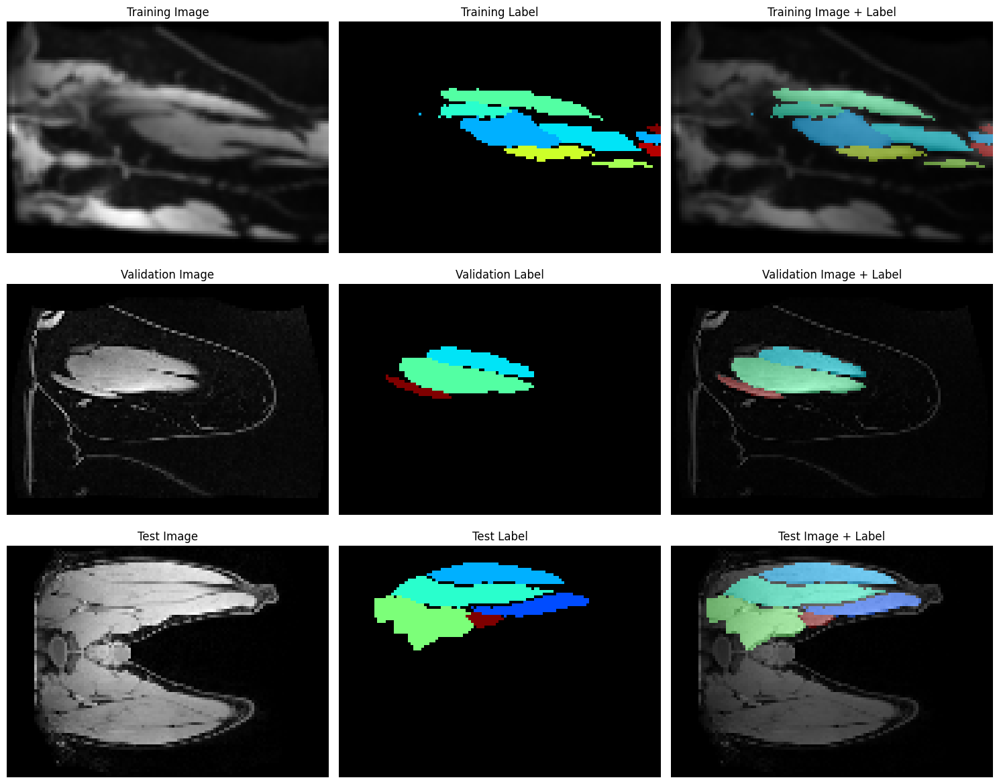

In [4]:
import matplotlib.pyplot as plt
import numpy as np
import torch
from torch import Tensor
from typing import Optional, Union
from matplotlib.colors import ListedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Define imagesc function (similar to MATLAB's imagesc)
def imagesc(
    ax: plt.Axes,
    image: Union[Tensor, np.ndarray],
    title: Optional[str] = None,
    colormap: plt.cm = plt.cm.gray,
    clim: Optional[tuple[float, float]] = None,
    show_axis: bool = False,
    show_colorbar: bool = True,
    **kwargs,
) -> None:
    """Display image with scaled colors. Similar to Matlab's imagesc."""
    # Handle color limits (clim)
    if clim is not None and isinstance(clim, (list, tuple)):
        if len(clim) == 2 and (clim[0] < clim[1]):
            clim_args = {"vmin": float(clim[0]), "vmax": float(clim[1])}
        else:
            raise ValueError("clim must be a tuple of (min, max) with min < max.")
    else:
        clim_args = {}

    # Convert Tensor to numpy if needed
    if isinstance(image, Tensor):
        image = image.cpu().detach().numpy()

    im = ax.imshow(image, colormap, **clim_args, **kwargs)
    ax.set_title(title)

    if show_colorbar:
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

    if not show_axis:
        ax.set_axis_off()

# Generate random indices for each dataset
train_idx = np.random.randint(len(train_dataset))
val_idx = np.random.randint(len(valid_dataset))
test_idx = np.random.randint(len(test_dataset))

# Print the indices
print(f"Random index for training dataset: {train_idx}")
print(f"Random index for validation dataset: {val_idx}")
print(f"Random index for testing dataset: {test_idx}")

# Colors for segmentation labels (ensure `custom_cmap` is defined)
cmap = custom_cmap  # Custom colormap for segmentation (define this if needed)

# Create the figure
figure = plt.figure(figsize=(15, 12))

# Training data visualization (transformed images)
image, label = train_dataset[train_idx]
image = image.squeeze()  # This will remove any singleton dimensions, including channel dimension
label = label.squeeze()  # Ensure 2D label
ax = figure.add_subplot(3, 3, 1)
imagesc(ax, image, title="Training Image", show_colorbar=False)
ax = figure.add_subplot(3, 3, 2)
imagesc(ax, label, title="Training Label", show_colorbar=False, colormap=cmap, interpolation="nearest")
ax = figure.add_subplot(3, 3, 3)
imagesc(ax, image, title="Training Image + Label", show_colorbar=False)
ax.imshow(label, cmap=cmap, alpha=0.5, interpolation="nearest")

# Validation data visualization (transformed images)
image, label = valid_dataset[val_idx]
image = image.squeeze()  # This will remove any singleton dimensions, including channel dimension
label = label.squeeze()  # Ensure 2D label
ax = figure.add_subplot(3, 3, 4)
imagesc(ax, image, title="Validation Image", show_colorbar=False)
ax = figure.add_subplot(3, 3, 5)
imagesc(ax, label, title="Validation Label", show_colorbar=False, colormap=cmap, interpolation="nearest")
ax = figure.add_subplot(3, 3, 6)
imagesc(ax, image, title="Validation Image + Label", show_colorbar=False)
ax.imshow(label, cmap=cmap, alpha=0.5, interpolation="nearest")

# Test data visualization (transformed images)
image, label = test_dataset[test_idx]
image = image.squeeze()  # This will remove any singleton dimensions, including channel dimension
label = label.squeeze()  # Ensure 2D label
ax = figure.add_subplot(3, 3, 7)
imagesc(ax, image, title="Test Image", show_colorbar=False)
ax = figure.add_subplot(3, 3, 8)
imagesc(ax, label, title="Test Label", show_colorbar=False, colormap=cmap, interpolation="nearest")
ax = figure.add_subplot(3, 3, 9)
imagesc(ax, image, title="Test Image + Label", show_colorbar=False)
ax.imshow(label, cmap=cmap, alpha=0.5, interpolation="nearest")

# Adjust layout and display
figure.tight_layout()
plt.show()


### Architecture of U Net

In [5]:
# Model setup
num_classes = 21
input_shape = (1, 350, 250)
output_shape = (num_classes, 350, 250)
init_channels = 64

In [6]:
class _DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels, dropout=0, use_batchnorm=True):
        super(_DoubleConv, self).__init__()
        layers = [
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        ]
        if use_batchnorm:
            layers.append(nn.BatchNorm2d(out_channels))
        layers.append(nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1))
        layers.append(nn.ReLU(inplace=True))
        if dropout > 0:
            layers.append(nn.Dropout(dropout))
        self.double_conv = nn.Sequential(*layers)

    def forward(self, x):
        return self.double_conv(x)
    

class _Down(nn.Module):
    def __init__(self, in_channels, out_channels, dropout, use_batchnorm=True):
        super(_Down, self).__init__()
        layers = [
            nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True)
        ]
        if use_batchnorm:
            layers.append(nn.BatchNorm2d(out_channels))
        layers.append(nn.MaxPool2d(kernel_size=2, stride=2))
        if dropout > 0:
            layers.append(nn.Dropout2d(p=dropout))
        self.down = nn.Sequential(*layers)

    def forward(self, x):
        return self.down(x)

class _Up(nn.Module):
    def __init__(self, in_channels, out_channels, dropout, use_batchnorm=True, bilinear=True):
        super(_Up, self).__init__()
        if bilinear:
            # Utilisation d'une convolution suivie d'une interpolation bilinéaire
            self.up = nn.Sequential(
                nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),
                nn.Conv2d(in_channels, in_channels // 2, kernel_size=1)
            )
        else:
            # Transposed convolution pour le upsampling
            self.up = nn.ConvTranspose2d(in_channels, in_channels // 2, kernel_size=2, stride=2)

        self.conv = _DoubleConv(in_channels, out_channels, dropout, use_batchnorm)

    def forward(self, x1, x2):
        x1 = self.up(x1)
        # Ajustement de la taille si nécessaire
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]
        x1 = nn.functional.pad(x1, [diffX // 2, diffX - diffX // 2,
                                    diffY // 2, diffY - diffY // 2])
        x = torch.cat([x2, x1], dim=1)  # Concatenation des caractéristiques
        return self.conv(x)

class UNet(nn.Module):
    def __init__(
        self,
        input_shape: Tuple[int, ...],
        output_shape: Tuple[int, ...],
        init_channels: int = 32,
        use_batchnorm: bool = True,
        bilinear: bool = False,
        dropout: float = 0.0,
    ):
        super().__init__()
        in_channels = input_shape[0]
        out_channels = output_shape[0]

        # Encoder (Downsampling Path)
        self.layer1 = _DoubleConv(in_channels, init_channels, dropout / 2, use_batchnorm)
        self.layer2 = _Down(init_channels, init_channels * 2, dropout, use_batchnorm)
        self.layer3 = _Down(init_channels * 2, init_channels * 4, dropout, use_batchnorm)
        self.layer4 = _Down(init_channels * 4, init_channels * 8, dropout, use_batchnorm)
        self.layer5 = _Down(init_channels * 8, init_channels * 16, dropout, use_batchnorm)

        # Decoder (Upsampling Path)
        self.layer6 = _Up(init_channels * 16, init_channels * 8, dropout, use_batchnorm, bilinear=bilinear)
        self.layer7 = _Up(init_channels * 8, init_channels * 4, dropout, use_batchnorm, bilinear=bilinear)
        self.layer8 = _Up(init_channels * 4, init_channels * 2, dropout, use_batchnorm, bilinear=bilinear)
        self.layer9 = _Up(init_channels * 2, init_channels, 0, use_batchnorm, bilinear=bilinear)

        # Final 1x1 Convolution
        self.output_layer = nn.Conv2d(init_channels, out_channels, kernel_size=1)

        # Initialize weights
        for m in self.modules():
            if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
                nn.init.xavier_uniform_(m.weight)

    def forward(self, x: Tensor) -> Tensor:
        x1 = self.layer1(x)  # Encoder
        x2 = self.layer2(x1)
        x3 = self.layer3(x2)
        x4 = self.layer4(x3)
        x5 = self.layer5(x4)

        out = self.layer6(x5, x4)  # Decoder
        out = self.layer7(out, x3)
        out = self.layer8(out, x2)
        out = self.layer9(out, x1)

        return self.output_layer(out)


# Update parameters
num_classes = 21
input_shape = (1, 117, 84)  # Grayscale input image shape
output_shape = (num_classes, 117, 84)  # Output mask shape with 20 classes
init_channels = 64  # Number of initial channels increased for depth

# Initialize and summarize the model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Utilisation de :", "GPU" if torch.cuda.is_available() else "CPU")

model = UNet(input_shape=input_shape, output_shape=output_shape, init_channels=init_channels).to(device)
%pip install torchinfo
from torchinfo import summary

summary_kwargs = dict(
    col_names=["input_size", "output_size", "kernel_size", "num_params"], depth=4, verbose=0
)
summary(model, (1, *input_shape), device="cpu", **summary_kwargs)



Utilisation de : GPU
Note: you may need to restart the kernel to use updated packages.


Layer (type:depth-idx)                   Input Shape               Output Shape              Kernel Shape              Param #
UNet                                     [1, 1, 117, 84]           [1, 21, 117, 84]          --                        --
├─_DoubleConv: 1-1                       [1, 1, 117, 84]           [1, 64, 117, 84]          --                        --
│    └─Sequential: 2-1                   [1, 1, 117, 84]           [1, 64, 117, 84]          --                        --
│    │    └─Conv2d: 3-1                  [1, 1, 117, 84]           [1, 64, 117, 84]          [3, 3]                    640
│    │    └─ReLU: 3-2                    [1, 64, 117, 84]          [1, 64, 117, 84]          --                        --
│    │    └─BatchNorm2d: 3-3             [1, 64, 117, 84]          [1, 64, 117, 84]          --                        128
│    │    └─Conv2d: 3-4                  [1, 64, 117, 84]          [1, 64, 117, 84]          [3, 3]                    36,928
│    │    └─R

### Loss function and training setup

In [7]:
## Specify loss and optimization functions

# Parameters
learning_rate = 0.0005
n_epochs = 50

# specify loss function
import torch.nn as nn
from monai.losses import DiceLoss
from monai.networks.utils import one_hot

# CrossEntropyLoss
#criterion_ce = nn.CrossEntropyLoss()

# DiceLoss (from MONAI)
#criterion_dice = DiceLoss(to_onehot_y=True, softmax=True, reduction="mean")

import torch
import torch.nn as nn
from monai.losses import DiceLoss
from monai.networks.utils import one_hot
from torch.optim.lr_scheduler import ReduceLROnPlateau


class CombinedLoss(nn.Module):
    def __init__(self, weights=[0.5, 0.5]):
        super().__init__()
        self.weights = weights
        self.dice_loss = DiceLoss(to_onehot_y=True, softmax=True, reduction="mean")
        self.ce_loss = nn.CrossEntropyLoss()

    def forward(self, pred, target):
        # Print the shapes of pred and target
        print("Prediction shape:", pred.shape)
        print("Target shape:", target.shape)

        # Ensure target has the correct shape for DiceLoss (B, 1, H, W)
        if target.ndimension() == 3:  # If target shape is (B, H, W)
            target_dice = target.unsqueeze(1)  # Adds channel dimension: (B, 1, H, W)
        else:
            target_dice = target  # If already in the correct shape

        # If the target is multi-class, convert it to one-hot encoding
        if target_dice.shape[1] == 1:  # Single channel (binary segmentation)
            target_dice = one_hot(target_dice, num_classes=pred.shape[1])  # One-hot encoding

        # Calculate Dice loss
        dice = self.dice_loss(pred, target_dice)

        # For CrossEntropyLoss, target should be a single-channel (B, H, W)
        if target.ndimension() == 4:  # Check if target is already 4D (B, 1, H, W)
            target_ce = target.squeeze(1)  # Remove channel dimension
        else:
            target_ce = target

        # Calculate CrossEntropy loss
        ce = self.ce_loss(pred, target_ce)

        # Return combined loss
        return self.weights[0] * dice + self.weights[1] * ce


import torch
import torch.nn.functional as F

def dice_loss(preds, labels, num_classes, epsilon=1e-6):
    """
    Computes the Dice loss for multiclass segmentation.

    Args:
        preds (torch.Tensor): Predicted logits of shape (batch_size, num_classes, height, width).
        labels (torch.Tensor): Ground truth of shape (batch_size, height, width).
        num_classes (int): Number of classes.
        epsilon (float): Small constant to avoid division by zero.

    Returns:
        torch.Tensor: Dice loss (scalar).
    """
    # One-hot encode the ground truth labels
    labels_one_hot = F.one_hot(labels, num_classes=num_classes).permute(0, 3, 1, 2).float()  # Shape: (batch_size, num_classes, height, width)

    # Apply softmax to predictions to get class probabilities
    preds = F.softmax(preds, dim=1)  # Shape: (batch_size, num_classes, height, width)

    # Compute per-class Dice coefficient
    intersection = torch.sum(preds * labels_one_hot, dim=(0, 2, 3))  # Sum over batch, height, width
    prediction_area = torch.sum(preds, dim=(0, 2, 3))  # Sum over batch, height, width
    target_area = torch.sum(labels_one_hot, dim=(0, 2, 3))  # Sum over batch, height, width

    dice_per_class = (2.0 * intersection) / (prediction_area + target_area + epsilon)

    # Average over classes
    mean_dice = torch.mean(dice_per_class)

    # Dice loss is 1 - Dice coefficient
    return 1 - mean_dice



# Choose your loss function criterion = CombinedLoss(weights=[0.5, 0.5])  # Or use criterion_ce or criterion_dice
#criterion = DiceLoss()
#criterion = nn.CrossEntropyLoss()
#criterion = CombinedLoss()
def multiclass_dice_loss(preds, labels, num_classes, epsilon=1e-6):
    """
    Compute Dice loss for multiclass segmentation.

    Args:
        preds (torch.Tensor): Predicted logits of shape (batch_size, num_classes, height, width).
        labels (torch.Tensor): Ground truth of shape (batch_size, height, width).
        num_classes (int): Number of classes.
        epsilon (float): Small constant to avoid division by zero.

    Returns:
        torch.Tensor: Dice loss (scalar).
    """
    # One-hot encode the labels
    labels_one_hot = F.one_hot(labels, num_classes=num_classes).permute(0, 3, 1, 2).float()  # Shape: (batch_size, num_classes, height, width)

    # Apply softmax to predictions to convert logits to probabilities
    preds = F.softmax(preds, dim=1)  # Shape: (batch_size, num_classes, height, width)

    # Compute intersection and union for each class
    intersection = torch.sum(preds * labels_one_hot, dim=(0, 2, 3))  # Sum over batch, height, width
    prediction_area = torch.sum(preds, dim=(0, 2, 3))  # Sum over batch, height, width
    target_area = torch.sum(labels_one_hot, dim=(0, 2, 3))  # Sum over batch, height, width

    # Compute Dice score per class
    dice_per_class = (2.0 * intersection) / (prediction_area + target_area + epsilon)

    # Compute the average Dice loss (1 - mean Dice score)
    return 1 - torch.mean(dice_per_class)

import torch.nn as nn

# Define the combined loss function
def combined_loss(preds, labels, num_classes, dice_weight=0.5, epsilon=1e-6):
    """
    Compute a combined loss that is a weighted sum of Dice loss and CrossEntropy loss.

    Args:
        preds (torch.Tensor): Predicted logits of shape (batch_size, num_classes, height, width).
        labels (torch.Tensor): Ground truth of shape (batch_size, height, width).
        num_classes (int): Number of classes.
        dice_weight (float): Weight for the Dice loss in the combined loss. CrossEntropy weight will be (1 - dice_weight).
        epsilon (float): Small constant to avoid division by zero.

    Returns:
        torch.Tensor: Combined loss (scalar).
    """
    # Compute Dice loss
    dice_loss = multiclass_dice_loss(preds, labels, num_classes, epsilon)

    # Compute CrossEntropy loss
    ce_loss = nn.CrossEntropyLoss()(preds, labels)

    # Weighted sum of the two losses
    total_loss = dice_weight * dice_loss + (1 - dice_weight) * ce_loss

    return total_loss



# Functions to calculate IoU and Dice Coefficient
def compute_iou(pred, target, num_classes):
    ious = []
    pred = torch.argmax(pred, dim=1)  # Convert logits to class indices
    for cls in range(1, num_classes):  # Skip background (class 0)
        pred_cls = pred == cls
        target_cls = target == cls
        intersection = (pred_cls & target_cls).sum().float()
        union = (pred_cls | target_cls).sum().float()
        if union == 0:
            ious.append(float('nan'))  # If no target for this class, ignore
        else:
            ious.append((intersection / union).item())
    return ious

def compute_dice(pred, target, num_classes):
    dices = []
    pred = torch.argmax(pred, dim=1)  # Convert logits to class indices
    for cls in range(1, num_classes):  # Skip background (class 0)
        pred_cls = pred == cls
        target_cls = target == cls
        intersection = (pred_cls & target_cls).sum().float()
        dice = (2.0 * intersection) / (pred_cls.sum() + target_cls.sum() + 1e-6)
        dices.append(dice.item())
    return dices

import torch.nn as nn

# Define the combined loss function
def combined_loss(preds, labels, num_classes, dice_weight=0.5, epsilon=1e-6):
    """
    Compute a combined loss that is a weighted sum of Dice loss and CrossEntropy loss.

    Args:
        preds (torch.Tensor): Predicted logits of shape (batch_size, num_classes, height, width).
        labels (torch.Tensor): Ground truth of shape (batch_size, height, width).
        num_classes (int): Number of classes.
        dice_weight (float): Weight for the Dice loss in the combined loss. CrossEntropy weight will be (1 - dice_weight).
        epsilon (float): Small constant to avoid division by zero.

    Returns:
        torch.Tensor: Combined loss (scalar).
    """
    # Compute Dice loss
    dice_loss = multiclass_dice_loss(preds, labels, num_classes, epsilon)

    # Compute CrossEntropy loss
    ce_loss = nn.CrossEntropyLoss()(preds, labels)

    # Weighted sum of the two losses
    total_loss = dice_weight * dice_loss + (1 - dice_weight) * ce_loss

    return total_loss

import torch
import torch.nn.functional as F

def hausdorff_loss_multiclass(preds, targets, num_classes, epsilon=1e-6):
    """
    Compute the approximated Hausdorff Loss for multiclass segmentation.

    Args:
        preds (torch.Tensor): Predicted logits of shape (batch_size, num_classes, height, width).
        targets (torch.Tensor): Ground truth of shape (batch_size, height, width).
        num_classes (int): Number of classes (including background).
        epsilon (float): Small constant to avoid division by zero.

    Returns:
        torch.Tensor: Hausdorff loss (scalar).
    """
    # Apply softmax to predictions (to convert logits to probabilities)
    preds = F.softmax(preds, dim=1)

    # Binarize predictions and targets (by thresholding the probability at 0.5)
    preds_binary = (preds > 0.5).float()
    targets_binary = torch.zeros_like(preds_binary)
    for c in range(num_classes):
        targets_binary[:, c, :, :] = (targets == c).float()

    # Initialize variables to store Hausdorff loss
    total_loss = 0.0
    
    # Loop through each class to calculate the Hausdorff distance
    for c in range(1, num_classes):  # Skip background class (0)
        # Predicted and ground truth points for class c
        preds_c = preds_binary[:, c, :, :]
        targets_c = targets_binary[:, c, :, :]

        # Compute the Euclidean distance transform (distance from each pixel to the nearest object pixel)
        # Compute distance for both predicted and target masks
        dt_preds = torch.cdist(preds_c.view(preds_c.shape[0], -1), 
                               targets_c.view(targets_c.shape[0], -1), p=2)

        # Min distance from preds -> targets
        min_dist_a = dt_preds.min(dim=1).values

        # Min distance from targets -> preds
        min_dist_b = dt_preds.min(dim=0).values

        # Add the min distances for the current class
        class_loss = min_dist_a.mean() + min_dist_b.mean()
        total_loss += class_loss

    return total_loss / (num_classes - 1)  # Average over classes (excluding background)


# specify optimizer
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate, betas=(0.9, 0.999), weight_decay=1e-4)



# Choose your loss function criterion = CombinedLoss(weights=[0.5, 0.5])  # Or use criterion_ce or criterion_dice
#criterion = DiceLoss()
criterion = nn.CrossEntropyLoss()
#criterion = CombinedLoss()



# specify optimizer
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate, betas=(0.9, 0.999), weight_decay=1e-4)
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5, verbose=True)



The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.


# Training
### Model initialisation and training

In [8]:
import torch
import torch.nn.functional as F
from torch.optim.lr_scheduler import ReduceLROnPlateau
import numpy as np
import matplotlib.pyplot as plt

# Move the model to the device
model = model.to(device)

# Lists to store loss and accuracy for each epoch
train_losses = []
valid_losses = []

best_valid_loss = float('inf')
best_epoch = 0
dice_weight=0.7
# Learning rate scheduler
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5, verbose=True)

# Training and validation loop
for epoch in range(n_epochs):
    # Training Phase
    model.train()
    epoch_loss = 0
    correct_train = 0
    total_train = 0
    all_ious = []
    all_dices = []

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device).to(torch.long)

        optimizer.zero_grad()
        outputs = model(images)
        
        # Use Dice loss
        loss =  combined_loss(outputs, labels, num_classes, dice_weight=dice_weight)
        loss.backward()
        optimizer.step()
        
        epoch_loss += loss.item()

        # Accuracy (ignoring background class 0)
        mask = (labels > 0)
        _, predicted = torch.max(outputs, dim=1)
        correct_train += ((predicted == labels) & mask).sum().item()
        total_train += mask.sum().item()
        
        # Compute IoU and Dice
        ious = compute_iou(outputs, labels, num_classes)
        dices = compute_dice(outputs, labels, num_classes)
        all_ious.extend(ious)
        all_dices.extend(dices)
    
    # Average metrics for training
    train_loss = epoch_loss / len(train_loader)
    train_accuracy = correct_train / total_train
    train_iou = np.nanmean(all_ious)
    train_dice = np.nanmean(all_dices)

    # Validation Phase
    model.eval()
    valid_loss = 0.0
    correct_valid = 0
    total_valid = 0
    all_valid_ious = []
    all_valid_dices = []

    with torch.no_grad():
        for images, labels in valid_loader:
            images, labels = images.to(device), labels.to(device).to(torch.long)
            
            if labels.ndim == 4:
                labels = labels.squeeze(1)
            
            outputs = model(images)
            
            # Use Dice loss for validation
            loss =  combined_loss(outputs, labels, num_classes, dice_weight=dice_weight)
            valid_loss += loss.item()
            
            # Calculate predictions
            _, predicted = torch.max(outputs, dim=1)
            
            # Accuracy (ignoring background class 0)
            mask = (labels > 0)
            correct_valid += ((predicted == labels) & mask).sum().item()
            total_valid += mask.sum().item()
            
            # Compute IoU and Dice
            valid_ious = compute_iou(outputs, labels, num_classes)
            valid_dices = compute_dice(outputs, labels, num_classes)
            all_valid_ious.extend(valid_ious)
            all_valid_dices.extend(valid_dices)

    # Average metrics for validation
    valid_loss = valid_loss / len(valid_loader)
    valid_accuracy = correct_valid / total_valid
    valid_iou = np.nanmean(all_valid_ious)
    valid_dice = np.nanmean(all_valid_dices)

    # Update learning rate scheduler
    scheduler.step(valid_loss)

    # Append losses for plotting
    train_losses.append(train_loss)
    valid_losses.append(valid_loss)

    # Print epoch summary in one line
    print(f"Epoch {epoch+1}/{n_epochs} | "
          f"Train Loss: {train_loss:.4f}, Valid Loss: {valid_loss:.4f} | "
          f"Train Acc: {train_accuracy*100:.2f}%, Valid Acc: {valid_accuracy*100:.2f}% | "
          f"Train IoU: {train_iou:.4f}, Valid IoU: {valid_iou:.4f} | "
          f"Train Dice: {train_dice:.4f}, Valid Dice: {valid_dice:.4f}")

    # Save best model
    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        best_epoch = epoch + 1
        # torch.save(model.state_dict(), 'best_model.pth')
        print(f"  Saved best model at epoch {best_epoch} with valid loss: {best_valid_loss:.4f}")

# Load best model after training 
model.load_state_dict(torch.load('best_model.pth'))
print(f"Best model selected at epoch {best_epoch} with valid loss: {best_valid_loss:.4f}")



KeyboardInterrupt: 

### Display Curve

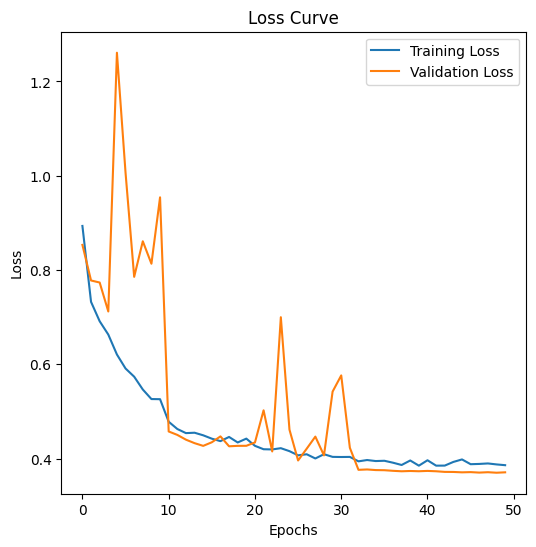

In [9]:
import matplotlib.pyplot as plt

# Plotting Training and Validation Loss
plt.figure(figsize=(6, 6))
plt.plot(train_losses, label='Training Loss')
plt.plot(valid_losses, label='Validation Loss')
plt.title('Loss Curve')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


### Testing and evaluation

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9900
Mean IoU: 0.8414
Mean Dice Score: 0.8842


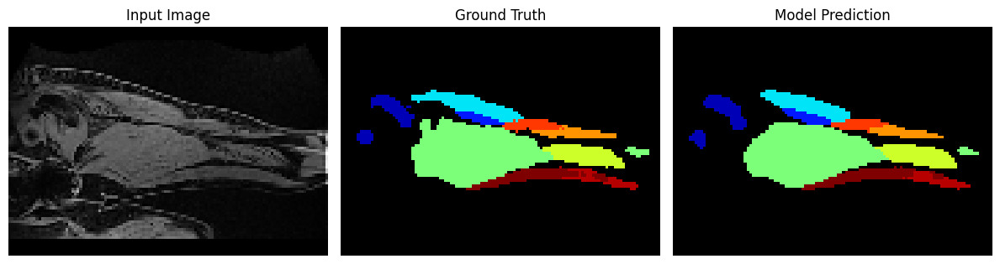

In [8]:
import os
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
from sklearn.metrics import jaccard_score, f1_score
import random

# Load the saved model
model.load_state_dict(torch.load('best_model.pth'),strict=False)  # Load the best model
model.to(device)
model.eval()  # Set the model to evaluation mode

# Create test DataLoader
num_workers = 0#os.cpu_count() - 1
test_dataloader = DataLoader(
    test_dataset,
    batch_size=1,  # Testing one sample at a time for analysis
    shuffle=False,
    num_workers=num_workers,
    pin_memory=torch.cuda.is_available()
)

# Initialize metrics
total_iou = 0.0
total_dice = 0.0
correct_pixels = 0
total_pixels = 0
num_samples = 0

# Randomly select an index for visualization
random_index = random.randint(0, len(test_dataset) - 1)

# Variables to store data for visualization
random_image = None
random_label = None
random_pred = None

# Function to compute IoU and Dice
def compute_metrics(pred, label):
    pred_flat = pred.flatten()
    label_flat = label.flatten()

    # Compute IoU and Dice
    iou = jaccard_score(label_flat, pred_flat, average='macro', zero_division=0)
    dice = f1_score(label_flat, pred_flat, average='macro', zero_division=0)
    return iou, dice

# Loop through the test DataLoader
with torch.no_grad():
    for idx, (image, label) in enumerate(test_dataloader):
        image, label = image.to(device), label.to(device)

        # Perform inference
        pred = model(image)  # Forward pass
        pred = F.softmax(pred, dim=1).argmax(dim=1)  # Get the most probable class for each pixel

        # Calculate metrics
        pred_np = pred.cpu().numpy().squeeze()  # Convert to NumPy
        label_np = label.cpu().numpy().squeeze()  # Convert to NumPy

        # Ensure shapes match
        if label_np.ndim == 3:  # One-hot encoded label
            label_np = np.argmax(label_np, axis=0)

        iou, dice = compute_metrics(pred_np, label_np)
        total_iou += iou
        total_dice += dice

        # Calculate pixel accuracy
        correct_pixels += (pred == label).sum().item()
        total_pixels += label.numel()

        # Store random sample for visualization
        if idx == random_index:
            random_image = image
            random_label = label
            random_pred = pred

        num_samples += 1

# Calculate mean metrics
mean_iou = total_iou / num_samples
mean_dice = total_dice / num_samples
test_accuracy = correct_pixels / total_pixels

print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Mean IoU: {mean_iou:.4f}")
print(f"Mean Dice Score: {mean_dice:.4f}")

# Visualization for the random sample
if random_image is not None and random_label is not None and random_pred is not None:
    # Prepare data for visualization
    random_image = random_image.squeeze().detach().cpu().numpy()  # Image
    random_label = random_label.squeeze().detach().cpu().numpy()  # Label
    random_pred = random_pred.squeeze().detach().cpu().numpy()  # Prediction

    # Convert one-hot encoded label to class indices if necessary
    if random_label.ndim == 3:  # One-hot encoded label
        random_label = np.argmax(random_label, axis=0)

    # Ensure the image is grayscale if it's a single-channel image
    if random_image.ndim == 3:
        random_image = random_image[0]  # Take the first channel if it's RGB

    # Plot the random image, label, and prediction
    plt.figure(figsize=(12, 4))

    # Original Image
    plt.subplot(1, 3, 1)
    plt.imshow(random_image, cmap='gray', interpolation='nearest')
    plt.title("Input Image")
    plt.axis('off')

    # Ground Truth Label
    plt.subplot(1, 3, 2)
    plt.imshow(random_label, cmap=custom_cmap, interpolation='nearest')
    plt.title("Ground Truth")
    plt.axis('off')

    # Model Prediction
    plt.subplot(1, 3, 3)
    plt.imshow(random_pred, cmap=custom_cmap, interpolation='nearest')
    plt.title("Model Prediction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()



## Méthode Incrémentale

### Fonction train

In [55]:
def train_model(train_loader, valid_loader,model,model_to_train):
    model.load_state_dict(torch.load(model_to_train),strict=False)  # Load the best model
    # Vérifie si un GPU est disponible
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")
    # Move the model to the device
    model = model.to(device)

    # Lists to store loss and accuracy for each epoch
    train_losses = []
    valid_losses = []
    train_accuracies = []
    valid_accuracies = []

    best_valid_loss = float('inf')
    best_epoch = 0

    # Learning rate scheduler
    scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5, verbose=True)
    n_epochs=30
    # Training and validation loop
    for epoch in range(n_epochs):
        # Training Phase
        model.train()
        epoch_loss = 0
        all_ious = []
        all_dices = []
        correct_train = 0
        total_train = 0
        
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device).to(torch.long)

            optimizer.zero_grad()
            outputs = model(images)
            
            # loss = criterion(outputs, labels)
            loss =  combined_loss(outputs, labels, num_classes, dice_weight=dice_weight)
            loss.backward()
            optimizer.step()
            
            epoch_loss += loss.item()

            # Accuracy (ignoring background class 0)
            mask = (labels > 0)
            _, predicted = torch.max(outputs, dim=1)
            correct_train += ((predicted == labels) & mask).sum().item()
            total_train += mask.sum().item()

            # # Compute metrics
            # ious = compute_iou(outputs, labels, num_classes)
            # dices = compute_dice(outputs, labels, num_classes)
            # all_ious.extend(ious)
            # all_dices.extend(dices)
        
        # Average metrics for training
        train_loss = epoch_loss / len(train_loader)
        train_accuracy = correct_train / total_train
        # train_iou = np.nanmean(all_ious)
        # train_dice = np.nanmean(all_dices)

        # Append training loss to the list
        train_losses.append(train_loss)

        # Validation Phase
        model.eval()
        valid_loss = 0.0
        correct_valid = 0
        total_valid = 0
        all_valid_ious = []
        all_valid_dices = []
        
        with torch.no_grad():
            for images, labels in valid_loader:
                images, labels = images.to(device), labels.to(device).to(torch.long)
                
                if labels.ndim == 4:
                    labels = labels.squeeze(1)
                
                outputs = model(images)
                # loss = criterion(outputs, labels)
                loss =  combined_loss(outputs, labels, num_classes, dice_weight=dice_weight)
                valid_loss += loss.item()
                
                # Calculate predictions
                _, predicted = torch.max(outputs, dim=1)
                
                # Accuracy (ignoring background class 0)
                mask = (labels > 0)
                correct_valid += ((predicted == labels) & mask).sum().item()
                total_valid += mask.sum().item()
                
                # IoU and Dice Coefficient
                # valid_ious = compute_iou(outputs, labels, num_classes)
                # valid_dices = compute_dice(outputs, labels, num_classes)
                # all_valid_ious.extend(valid_ious)
                # all_valid_dices.extend(valid_dices)

        # Average metrics for validation
        valid_loss = valid_loss / len(valid_loader)
        valid_accuracy = correct_valid / total_valid
        # valid_iou = np.nanmean(all_valid_ious)
        # valid_dice = np.nanmean(all_valid_dices)

        # Append validation loss to the list
        valid_losses.append(valid_loss)
        valid_accuracies.append(valid_accuracy)
        
        # Update learning rate scheduler
        scheduler.step(valid_loss)
        
        print(f'Epoch: {epoch+1}/{n_epochs} \tTraining Loss: {train_loss:.4f} \tValidation Loss: {valid_loss:.4f}')
        print(f'\tTraining Accuracy: {train_accuracy:.4f} \tValidation Accuracy: {valid_accuracy:.4f}')
        # print(f'\tTraining IoU: {train_iou:.4f} \tValidation IoU: {valid_iou:.4f}')
        # print(f'\tTraining Dice: {train_dice:.4f} \tValidation Dice: {valid_dice:.4f}')

        # Save best model
        if valid_loss < best_valid_loss:
            best_valid_loss = valid_loss
            best_epoch = epoch + 1
            torch.save(model.state_dict(), 'best_model_sys.pth')
            print(f"Saved best model at epoch {best_epoch} with validation loss: {best_valid_loss:.4f}")

    # # Load best model after training
    # model.load_state_dict(torch.load('best_model.pth'))
    # print(f"Best model selected at epoch {best_epoch} with validation loss: {best_valid_loss:.4f}")
    return train_losses, valid_losses

In [56]:
class EWC:
    def __init__(self, model, dataloader, device):
        self.model = model
        self.device = device
        self.params = {n: p.clone().detach() for n, p in model.named_parameters() if p.requires_grad}
        self.fisher = self._compute_fisher(dataloader)

    def _compute_fisher(self, dataloader):
        fisher = {n: torch.zeros_like(p) for n, p in self.params.items()}
        self.model.eval()
        for images, labels in dataloader:
            images, labels = images.to(self.device), labels.to(self.device).to(torch.long)
            self.model.zero_grad()
            outputs = self.model(images)
            loss = F.cross_entropy(outputs, labels)
            loss.backward()
            for n, p in self.model.named_parameters():
                if p.requires_grad:
                    fisher[n] += p.grad.pow(2).detach()
        # Average Fisher information
        for n in fisher:
            fisher[n] /= len(dataloader)
        return fisher

    def penalty(self, model):
        loss = 0
        for n, p in model.named_parameters():
            if p.requires_grad:
                loss += (self.fisher[n] * (p - self.params[n]).pow(2)).sum()
        return loss

def train_model_with_ewc(train_loader, valid_loader, model, prev_dataloader,model_to_train, lambda_ewc=0.1):
    model.load_state_dict(torch.load(model_to_train),strict=False)  # Load the best model
    # Vérifie si un GPU est disponible
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")
    # Move the model to the device
    model = model.to(device)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)

    # Initialize optimizer, scheduler, and loss function
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
    scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5, verbose=True)
    criterion = torch.nn.CrossEntropyLoss()

    # Initialize EWC
    ewc = EWC(model, prev_dataloader, device)

    train_losses = []
    valid_losses = []

    best_valid_loss = float('inf')
    n_epochs = 30

    for epoch in range(n_epochs):
        model.train()
        epoch_loss = 0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device).to(torch.long)

            optimizer.zero_grad()
            outputs = model(images)

            # loss = criterion(outputs, labels)
            loss =  combined_loss(outputs, labels, num_classes, dice_weight=dice_weight)
            loss += lambda_ewc * ewc.penalty(model)  # Add EWC penalty
            
            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()

        train_loss = epoch_loss / len(train_loader)
        train_losses.append(train_loss)

        # Validation Phase
        model.eval()
        valid_loss = 0.0
        with torch.no_grad():
            for images, labels in valid_loader:
                images, labels = images.to(device), labels.to(device).to(torch.long)
                outputs = model(images)
                # loss = criterion(outputs, labels)
                loss =  combined_loss(outputs, labels, num_classes, dice_weight=dice_weight)
                valid_loss += loss.item()

        valid_loss /= len(valid_loader)
        valid_losses.append(valid_loss)
        scheduler.step(valid_loss)

        print(f'Epoch {epoch+1}/{n_epochs}: Train Loss: {train_loss:.4f}, Valid Loss: {valid_loss:.4f}')
        
        # Save best model
        if valid_loss < best_valid_loss:
            best_valid_loss = valid_loss
            best_epoch = epoch + 1
            torch.save(model.state_dict(), 'best_model_sys.pth')
            print(f"Saved best model at epoch {best_epoch} with validation loss: {best_valid_loss:.4f}")


    return train_losses, valid_losses


### Fonction Test

In [58]:

# Step 5: Main implementation

# Set the EWC hyperparameter
lambda_ewc = 0.01  # Adjust this value to control the strength of the EWC penalty

# Fine-tuning parameters
learning_rate = 1e-5  # Use a smaller learning rate
dice_weight = 0.7  # Adjust dice weight
n_epochs = 30  # Increase number of epochs

# Initialize optimizer with weight decay
optimizer = torch.optim.AdamW(
    model.parameters(),
    lr=learning_rate,
    weight_decay=1e-4
)

# Use a more sophisticated scheduler
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.5,
    patience=5,
    min_lr=1e-7
)


# Fine-tune the model on the new data
# fine_tune_with_ewc(
#     model, uncertain_data_loader, valid_loader, optimizer, scheduler, fisher, prev_params,
#     combined_loss, num_classes, lambda_ewc=lambda_ewc, dice_weight=dice_weight, n_epochs=50, device=device
# )

# Load the fine-tuned model
# model.load_state_dict(torch.load("fine_tuned_ewc_model.pth"))
# print("Fine-tuned model loaded.")

In [59]:
import os
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
from sklearn.metrics import jaccard_score, f1_score
import random

def test_model_dice(test_dataset, model_to_test):
    # Load the saved model
    model.load_state_dict(torch.load(model_to_test),strict=False)  # Load the best model
    model.to(device)
    model.eval()  # Set the model to evaluation mode

    # Create test DataLoader
    num_workers = 0#os.cpu_count() - 1
    test_dataloader = DataLoader(
        test_dataset,
        batch_size=1,  # Testing one sample at a time for analysis
        shuffle=False,
        num_workers=num_workers,
        pin_memory=torch.cuda.is_available()
    )

    # Initialize metrics
    total_iou = 0.0
    total_dice = 0.0
    correct_pixels = 0
    total_pixels = 0
    num_samples = 0

    # Randomly select an index for visualization
    random_index = random.randint(0, len(test_dataset) - 1)

    # Variables to store data for visualization
    random_image = None
    random_label = None
    random_pred = None

    # Function to compute IoU and Dice
    def compute_metrics(pred, label):
        pred_flat = pred.flatten()
        label_flat = label.flatten()

        # Compute IoU and Dice
        iou = jaccard_score(label_flat, pred_flat, average='macro', zero_division=0)
        dice = f1_score(label_flat, pred_flat, average='macro', zero_division=0)
        return iou, dice

    # Loop through the test DataLoader
    image_list=[]
    label_list=[]
    pred_list=[]
    with torch.no_grad():
        for idx, (image, label) in enumerate(test_dataloader):
            image, label = image.to(device), label.to(device)

            # Perform inference
            pred = model(image)  # Forward pass
            pred = F.softmax(pred, dim=1).argmax(dim=1)  # Get the most probable class for each pixel

            # Calculate metrics
            pred_np = pred.cpu().numpy().squeeze()  # Convert to NumPy
            label_np = label.cpu().numpy().squeeze()  # Convert to NumPy

            # Ensure shapes match
            if label_np.ndim == 3:  # One-hot encoded label
                label_np = np.argmax(label_np, axis=0)

            iou, dice = compute_metrics(pred_np, label_np)
            total_iou += iou
            total_dice += dice

            # Calculate pixel accuracy
            correct_pixels += (pred == label).sum().item()
            total_pixels += label.numel()

            # Store random sample for visualization
            if idx == random_index:
                random_image = image
                random_label = label
                random_pred = pred
            
            image_list.append(image)
            label_list.append(label)
            pred_list.append(pred)

            num_samples += 1

    # Calculate mean metrics
    mean_iou = total_iou / num_samples
    mean_dice = total_dice / num_samples
    test_accuracy = correct_pixels / total_pixels

    print(f"Test Accuracy: {test_accuracy:.4f}")
    print(f"Mean IoU: {mean_iou:.4f}")
    print(f"Mean Dice Score: {mean_dice:.4f}")

    # Visualization for the random sample
    if random_image is not None and random_label is not None and random_pred is not None:
        # Prepare data for visualization
        random_image = random_image.squeeze().detach().cpu().numpy()  # Image
        random_label = random_label.squeeze().detach().cpu().numpy()  # Label
        random_pred = random_pred.squeeze().detach().cpu().numpy()  # Prediction

        # Convert one-hot encoded label to class indices if necessary
        if random_label.ndim == 3:  # One-hot encoded label
            random_label = np.argmax(random_label, axis=0)

        # Ensure the image is grayscale if it's a single-channel image
        if random_image.ndim == 3:
            random_image = random_image[0]  # Take the first channel if it's RGB

        # Plot the random image, label, and prediction
        plt.figure(figsize=(18, 6))

        # Original Image
        plt.subplot(1, 3, 1)
        plt.imshow(random_image, cmap='gray', interpolation='nearest')
        plt.title("Input Image")
        plt.axis('off')

        # Ground Truth Overlay
        plt.subplot(1, 3, 2)
        plt.imshow(random_image, cmap='gray', interpolation='nearest')  # Base image
        plt.imshow(random_label, cmap=custom_cmap, alpha=0.8, interpolation='nearest')  # Ground truth overlay
        plt.title("Input + Ground Truth")
        plt.axis('off')

        # Prediction Overlay
        plt.subplot(1, 3, 3)
        plt.imshow(random_image, cmap='gray', interpolation='nearest')  # Base image
        plt.imshow(random_pred, cmap=custom_cmap, alpha=0.8, interpolation='nearest')  # Prediction overlay
        plt.title("Input + Prediction")
        plt.axis('off')

        plt.tight_layout()
        plt.show()

    return image_list,label_list,pred_list,test_accuracy, mean_dice


In [60]:
import torch
from torch.utils.data import Dataset


class CustomDataset_tensor(Dataset):
    def __init__(self, images, labels, transform=None):
        """
        Args:
            images (Tensor): Tensor contenant les images (ex: [N, C, H, W])
            labels (Tensor): Tensor contenant les labels (ex: [N, C, H, W])
            transform (callable, optional): Transformation à appliquer aux données (image, mask).
        """
        self.images = images
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        # Sélectionner l'image et le label pour l'indice donné
        image = self.images[idx]
        label = self.labels[idx]

        # Si l'image est en 2D (H, W), ajouter la dimension du canal (C, H, W)
        if image.ndimension() == 2:  # Cas où l'image est 2D (ex: échelle de gris)
            image = image.unsqueeze(0)  # Ajouter la dimension du canal (C, H, W)

        # Si le label est en 2D (H, W), ajouter la dimension du canal (C, H, W)
        if label.ndimension() == 2:  # Cas où le label est 2D
            label = label.unsqueeze(0)  # Ajouter la dimension du canal (C, H, W)

        # Appliquer les transformations si spécifiées
        if self.transform:
            transformed = self.transform(image=image, mask=label)
            image = transformed['image']
            label = transformed['mask']

        # Retirer la dimension du canal du label si présente (on garde (H, W))
        label = label.squeeze(0)  # Retirer la dimension du canal pour le label (H, W)

        return image, label


## Méthode incrémentale

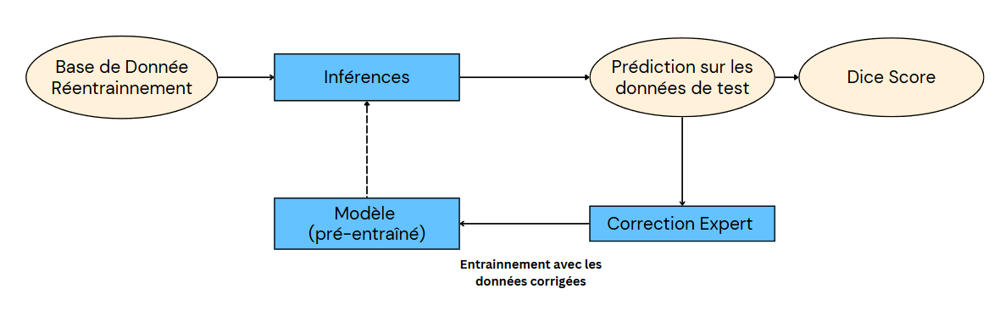

### Sans méthode EWC

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9900
Mean IoU: 0.8414
Mean Dice Score: 0.8842


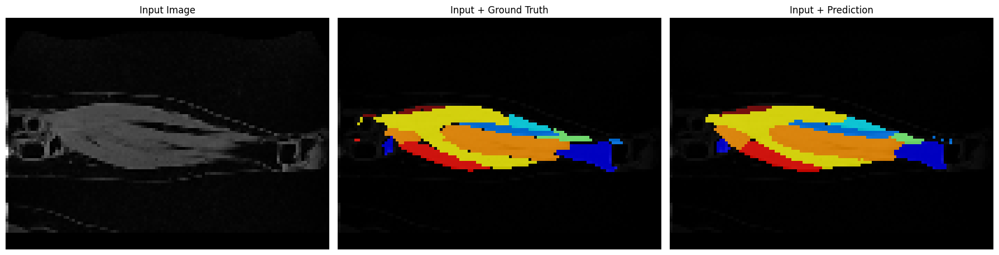

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9900
Mean IoU: 0.8414
Mean Dice Score: 0.8842


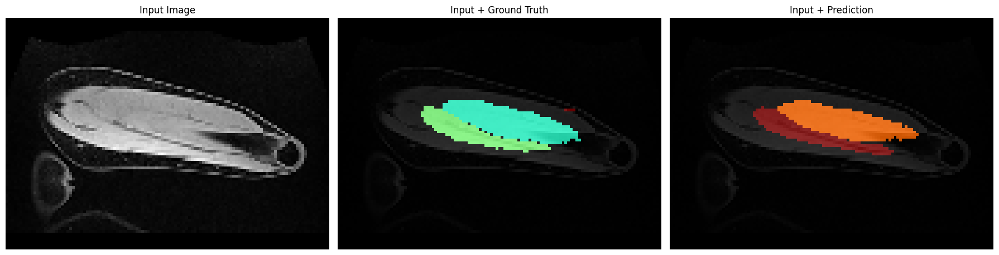

---------------------------------
Nombre de réentrainnement : 1/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch: 1/30 	Training Loss: 0.3214 	Validation Loss: 0.4397
	Training Accuracy: 0.9526 	Validation Accuracy: 0.9584
Saved best model at epoch 1 with validation loss: 0.4397
Epoch: 2/30 	Training Loss: 0.3253 	Validation Loss: 0.4186
	Training Accuracy: 0.9562 	Validation Accuracy: 0.9560
Saved best model at epoch 2 with validation loss: 0.4186
Epoch: 3/30 	Training Loss: 0.3272 	Validation Loss: 0.4381
	Training Accuracy: 0.9567 	Validation Accuracy: 0.9560
Epoch: 4/30 	Training Loss: 0.3408 	Validation Loss: 0.3817
	Training Accuracy: 0.9597 	Validation Accuracy: 0.9539
Saved best model at epoch 4 with validation loss: 0.3817
Epoch: 5/30 	Training Loss: 0.3137 	Validation Loss: 0.3918
	Training Accuracy: 0.9569 	Validation Accuracy: 0.9538
Epoch: 6/30 	Training Loss: 0.3550 	Validation Loss: 0.4159
	Training Accuracy: 0.9522 	Validation Accuracy: 0.9555
Epoch: 7/30 	Training Loss: 0.3070 	Validation Loss: 0.4082
	Training Accuracy: 0.9608 	Validation Accuracy: 0.9537
Epoch: 8/30 	Trai

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9902
Mean IoU: 0.8681
Mean Dice Score: 0.9103


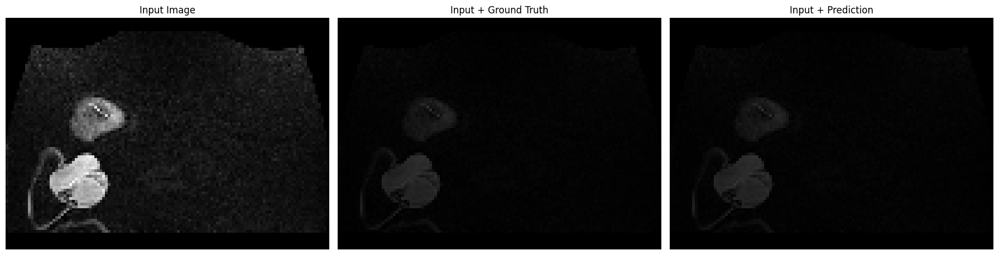

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9913
Mean IoU: 0.8614
Mean Dice Score: 0.8994


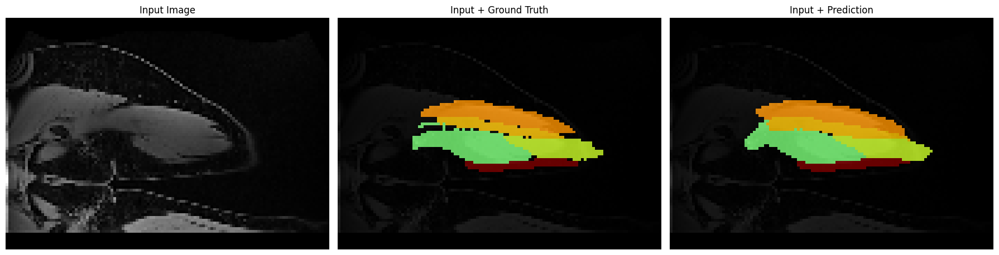

---------------------------------
Nombre de réentrainnement : 2/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch: 1/30 	Training Loss: 0.3099 	Validation Loss: 0.3774
	Training Accuracy: 0.9611 	Validation Accuracy: 0.9680
Saved best model at epoch 1 with validation loss: 0.3774
Epoch: 2/30 	Training Loss: 0.3169 	Validation Loss: 0.4238
	Training Accuracy: 0.9577 	Validation Accuracy: 0.9662
Epoch: 3/30 	Training Loss: 0.2983 	Validation Loss: 0.3959
	Training Accuracy: 0.9600 	Validation Accuracy: 0.9648
Epoch: 4/30 	Training Loss: 0.3328 	Validation Loss: 0.3899
	Training Accuracy: 0.9576 	Validation Accuracy: 0.9659
Epoch: 5/30 	Training Loss: 0.3195 	Validation Loss: 0.4407
	Training Accuracy: 0.9591 	Validation Accuracy: 0.9676
Epoch: 6/30 	Training Loss: 0.3119 	Validation Loss: 0.4365
	Training Accuracy: 0.9590 	Validation Accuracy: 0.9660
Epoch: 7/30 	Training Loss: 0.2995 	Validation Loss: 0.3907
	Training Accuracy: 0.9594 	Validation Accuracy: 0.9649
Epoch: 8/30 	Training Loss: 0.3349 	Validation Loss: 0.4106
	Training Accuracy: 0.9587 	Validation Accuracy: 0.9691
Epoch: 9/30 	Tr

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9902
Mean IoU: 0.8633
Mean Dice Score: 0.9059


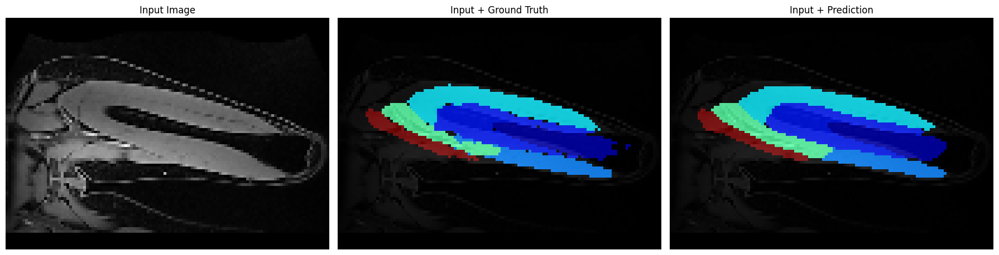

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9912
Mean IoU: 0.8582
Mean Dice Score: 0.8962


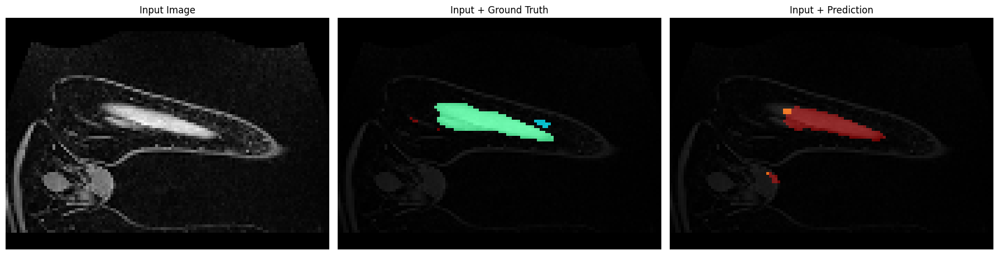

---------------------------------
Nombre de réentrainnement : 3/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch: 1/30 	Training Loss: 0.3168 	Validation Loss: 0.4156
	Training Accuracy: 0.9575 	Validation Accuracy: 0.9688
Saved best model at epoch 1 with validation loss: 0.4156
Epoch: 2/30 	Training Loss: 0.3372 	Validation Loss: 0.3668
	Training Accuracy: 0.9592 	Validation Accuracy: 0.9666
Saved best model at epoch 2 with validation loss: 0.3668
Epoch: 3/30 	Training Loss: 0.2988 	Validation Loss: 0.4340
	Training Accuracy: 0.9595 	Validation Accuracy: 0.9634
Epoch: 4/30 	Training Loss: 0.3290 	Validation Loss: 0.3597
	Training Accuracy: 0.9589 	Validation Accuracy: 0.9699
Saved best model at epoch 4 with validation loss: 0.3597
Epoch: 5/30 	Training Loss: 0.3311 	Validation Loss: 0.3791
	Training Accuracy: 0.9600 	Validation Accuracy: 0.9677
Epoch: 6/30 	Training Loss: 0.3280 	Validation Loss: 0.4340
	Training Accuracy: 0.9587 	Validation Accuracy: 0.9656
Epoch: 7/30 	Training Loss: 0.3057 	Validation Loss: 0.3782
	Training Accuracy: 0.9566 	Validation Accuracy: 0.9663
Epoch: 8/30 	Trai

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9903
Mean IoU: 0.8675
Mean Dice Score: 0.9097


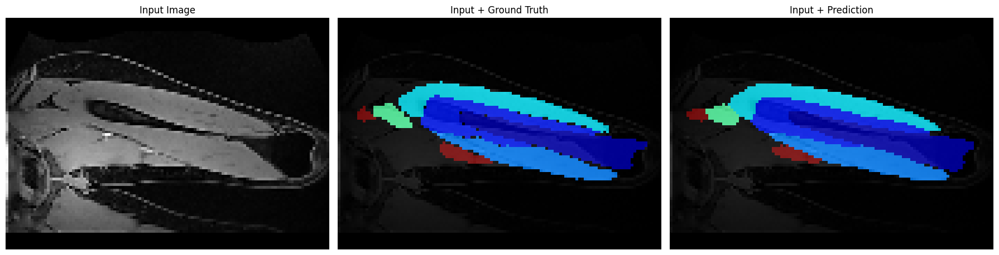

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9914
Mean IoU: 0.8623
Mean Dice Score: 0.9002


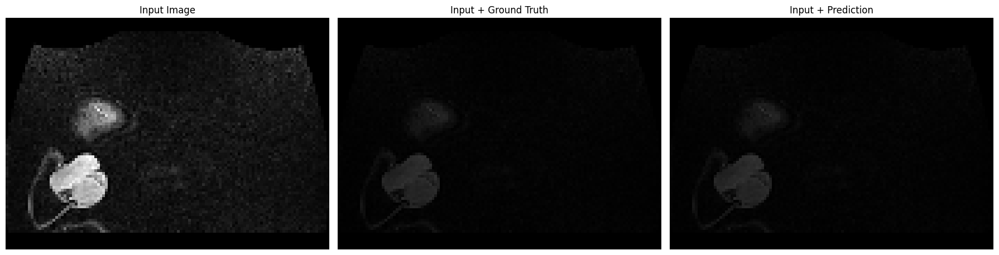

---------------------------------
Nombre de réentrainnement : 4/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch: 1/30 	Training Loss: 0.3228 	Validation Loss: 0.4047
	Training Accuracy: 0.9613 	Validation Accuracy: 0.9684
Saved best model at epoch 1 with validation loss: 0.4047
Epoch: 2/30 	Training Loss: 0.3365 	Validation Loss: 0.3458
	Training Accuracy: 0.9597 	Validation Accuracy: 0.9654
Saved best model at epoch 2 with validation loss: 0.3458
Epoch: 3/30 	Training Loss: 0.3103 	Validation Loss: 0.3675
	Training Accuracy: 0.9580 	Validation Accuracy: 0.9658
Epoch: 4/30 	Training Loss: 0.3301 	Validation Loss: 0.3590
	Training Accuracy: 0.9614 	Validation Accuracy: 0.9695
Epoch: 5/30 	Training Loss: 0.3444 	Validation Loss: 0.4274
	Training Accuracy: 0.9591 	Validation Accuracy: 0.9707
Epoch: 6/30 	Training Loss: 0.3153 	Validation Loss: 0.4439
	Training Accuracy: 0.9590 	Validation Accuracy: 0.9699
Epoch: 7/30 	Training Loss: 0.3193 	Validation Loss: 0.3689
	Training Accuracy: 0.9623 	Validation Accuracy: 0.9694
Epoch: 8/30 	Training Loss: 0.3340 	Validation Loss: 0.4026
	Training Accu

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9902
Mean IoU: 0.8588
Mean Dice Score: 0.9009


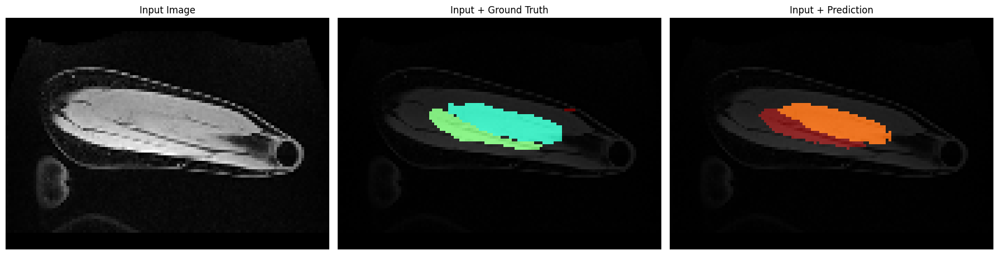

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9913
Mean IoU: 0.8612
Mean Dice Score: 0.8991


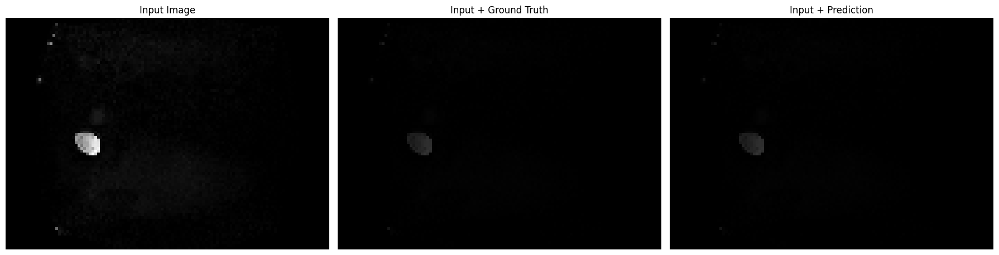

---------------------------------
Nombre de réentrainnement : 5/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch: 1/30 	Training Loss: 0.3116 	Validation Loss: 0.3965
	Training Accuracy: 0.9614 	Validation Accuracy: 0.9687
Saved best model at epoch 1 with validation loss: 0.3965
Epoch: 2/30 	Training Loss: 0.3263 	Validation Loss: 0.3664
	Training Accuracy: 0.9615 	Validation Accuracy: 0.9684
Saved best model at epoch 2 with validation loss: 0.3664
Epoch: 3/30 	Training Loss: 0.3276 	Validation Loss: 0.3526
	Training Accuracy: 0.9618 	Validation Accuracy: 0.9668
Saved best model at epoch 3 with validation loss: 0.3526
Epoch: 4/30 	Training Loss: 0.3028 	Validation Loss: 0.4559
	Training Accuracy: 0.9615 	Validation Accuracy: 0.9678
Epoch: 5/30 	Training Loss: 0.3144 	Validation Loss: 0.4240
	Training Accuracy: 0.9603 	Validation Accuracy: 0.9637
Epoch: 6/30 	Training Loss: 0.3213 	Validation Loss: 0.4065
	Training Accuracy: 0.9613 	Validation Accuracy: 0.9644
Epoch: 7/30 	Training Loss: 0.3317 	Validation Loss: 0.3958
	Training Accuracy: 0.9618 	Validation Accuracy: 0.9661
Epoch: 8/30 	Trai

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9901
Mean IoU: 0.8486
Mean Dice Score: 0.8915


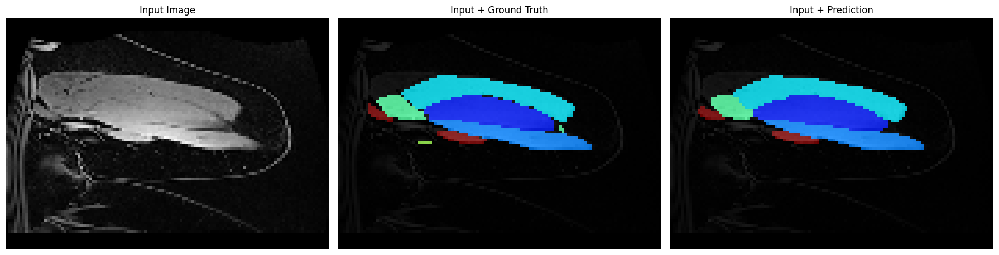

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9911
Mean IoU: 0.8588
Mean Dice Score: 0.8970


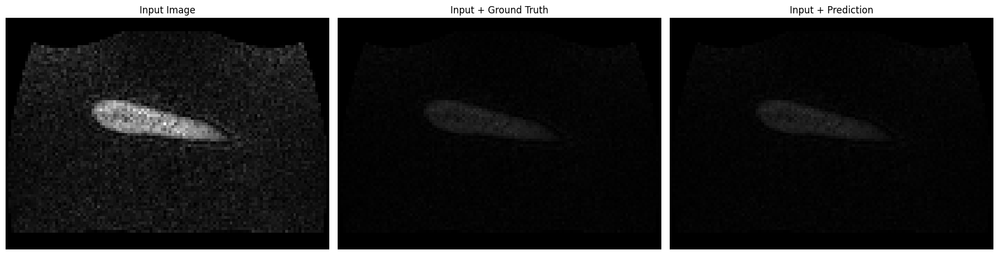

---------------------------------
Nombre de réentrainnement : 6/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch: 1/30 	Training Loss: 0.3132 	Validation Loss: 0.4004
	Training Accuracy: 0.9536 	Validation Accuracy: 0.9658
Saved best model at epoch 1 with validation loss: 0.4004
Epoch: 2/30 	Training Loss: 0.3095 	Validation Loss: 0.3634
	Training Accuracy: 0.9611 	Validation Accuracy: 0.9674
Saved best model at epoch 2 with validation loss: 0.3634
Epoch: 3/30 	Training Loss: 0.3062 	Validation Loss: 0.4352
	Training Accuracy: 0.9600 	Validation Accuracy: 0.9668
Epoch: 4/30 	Training Loss: 0.3373 	Validation Loss: 0.3561
	Training Accuracy: 0.9606 	Validation Accuracy: 0.9664
Saved best model at epoch 4 with validation loss: 0.3561
Epoch: 5/30 	Training Loss: 0.3117 	Validation Loss: 0.4037
	Training Accuracy: 0.9600 	Validation Accuracy: 0.9663
Epoch: 6/30 	Training Loss: 0.3306 	Validation Loss: 0.3797
	Training Accuracy: 0.9595 	Validation Accuracy: 0.9667
Epoch: 7/30 	Training Loss: 0.3071 	Validation Loss: 0.4184
	Training Accuracy: 0.9613 	Validation Accuracy: 0.9659
Epoch: 8/30 	Trai

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9902
Mean IoU: 0.8470
Mean Dice Score: 0.8900


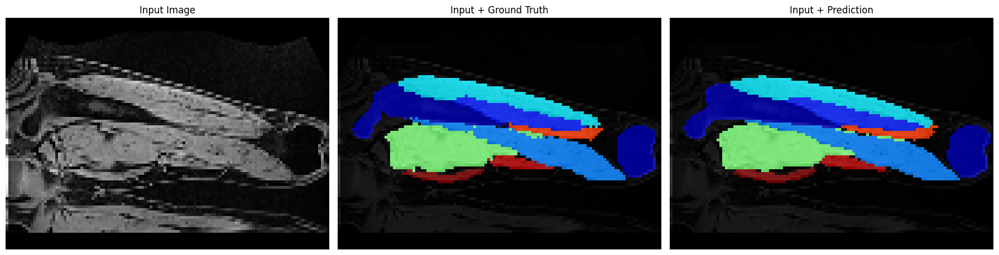

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9912
Mean IoU: 0.8597
Mean Dice Score: 0.8980


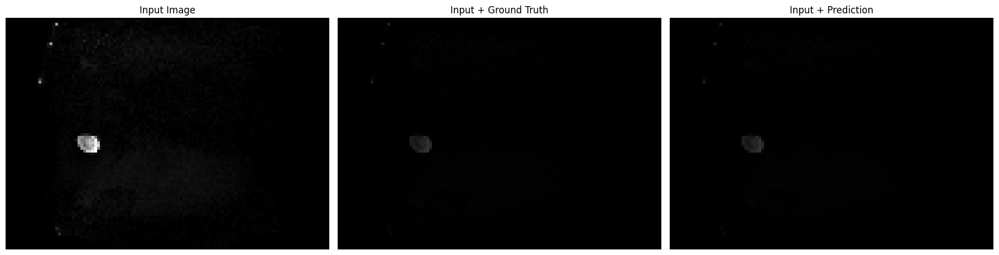

---------------------------------
Nombre de réentrainnement : 7/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch: 1/30 	Training Loss: 0.3059 	Validation Loss: 0.4348
	Training Accuracy: 0.9620 	Validation Accuracy: 0.9673
Saved best model at epoch 1 with validation loss: 0.4348
Epoch: 2/30 	Training Loss: 0.3265 	Validation Loss: 0.3915
	Training Accuracy: 0.9626 	Validation Accuracy: 0.9696
Saved best model at epoch 2 with validation loss: 0.3915
Epoch: 3/30 	Training Loss: 0.3258 	Validation Loss: 0.3879
	Training Accuracy: 0.9598 	Validation Accuracy: 0.9704
Saved best model at epoch 3 with validation loss: 0.3879
Epoch: 4/30 	Training Loss: 0.3283 	Validation Loss: 0.4459
	Training Accuracy: 0.9616 	Validation Accuracy: 0.9694
Epoch: 5/30 	Training Loss: 0.3206 	Validation Loss: 0.3947
	Training Accuracy: 0.9613 	Validation Accuracy: 0.9685
Epoch: 6/30 	Training Loss: 0.3078 	Validation Loss: 0.4180
	Training Accuracy: 0.9586 	Validation Accuracy: 0.9661
Epoch: 7/30 	Training Loss: 0.3383 	Validation Loss: 0.3462
	Training Accuracy: 0.9614 	Validation Accuracy: 0.9659
Saved best model 

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9901
Mean IoU: 0.8484
Mean Dice Score: 0.8915


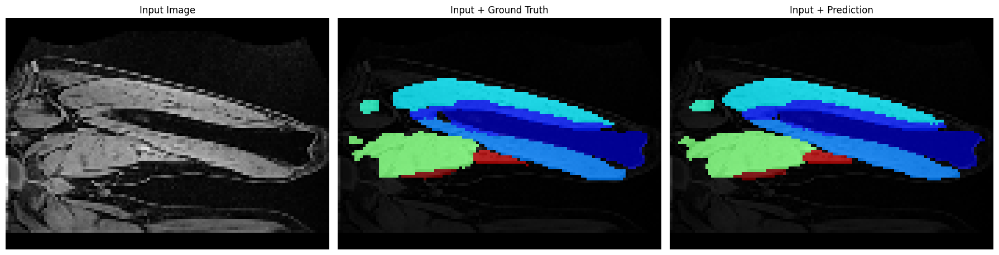

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9911
Mean IoU: 0.8584
Mean Dice Score: 0.8969


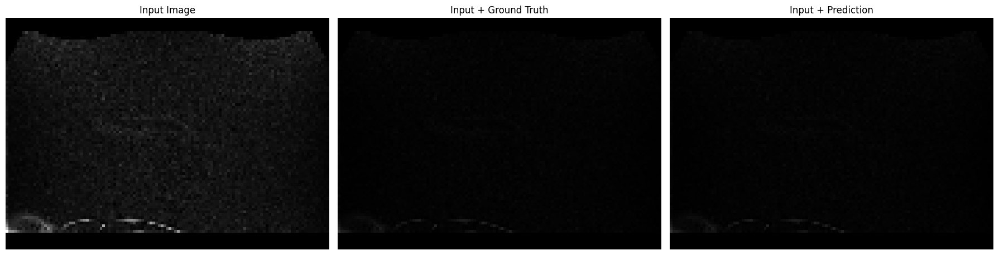

---------------------------------
Nombre de réentrainnement : 8/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch: 1/30 	Training Loss: 0.3169 	Validation Loss: 0.3588
	Training Accuracy: 0.9600 	Validation Accuracy: 0.9650
Saved best model at epoch 1 with validation loss: 0.3588
Epoch: 2/30 	Training Loss: 0.3251 	Validation Loss: 0.4112
	Training Accuracy: 0.9599 	Validation Accuracy: 0.9662
Epoch: 3/30 	Training Loss: 0.3080 	Validation Loss: 0.3515
	Training Accuracy: 0.9607 	Validation Accuracy: 0.9637
Saved best model at epoch 3 with validation loss: 0.3515
Epoch: 4/30 	Training Loss: 0.2965 	Validation Loss: 0.3891
	Training Accuracy: 0.9606 	Validation Accuracy: 0.9638
Epoch: 5/30 	Training Loss: 0.3076 	Validation Loss: 0.3598
	Training Accuracy: 0.9596 	Validation Accuracy: 0.9641
Epoch: 6/30 	Training Loss: 0.3416 	Validation Loss: 0.4556
	Training Accuracy: 0.9606 	Validation Accuracy: 0.9689
Epoch: 7/30 	Training Loss: 0.3131 	Validation Loss: 0.3570
	Training Accuracy: 0.9612 	Validation Accuracy: 0.9665
Epoch: 8/30 	Training Loss: 0.3287 	Validation Loss: 0.4676
	Training Accu

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9903
Mean IoU: 0.8612
Mean Dice Score: 0.9031


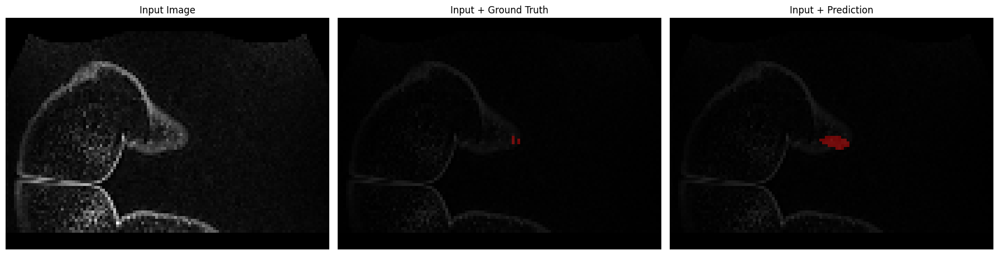

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9914
Mean IoU: 0.8620
Mean Dice Score: 0.8997


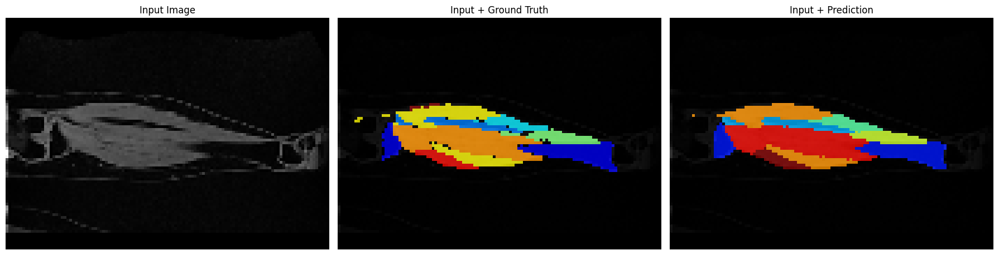

---------------------------------
Nombre de réentrainnement : 9/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch: 1/30 	Training Loss: 0.3517 	Validation Loss: 0.3667
	Training Accuracy: 0.9627 	Validation Accuracy: 0.9681
Saved best model at epoch 1 with validation loss: 0.3667
Epoch: 2/30 	Training Loss: 0.3254 	Validation Loss: 0.3898
	Training Accuracy: 0.9608 	Validation Accuracy: 0.9642
Epoch: 3/30 	Training Loss: 0.3534 	Validation Loss: 0.4461
	Training Accuracy: 0.9611 	Validation Accuracy: 0.9616
Epoch: 4/30 	Training Loss: 0.3091 	Validation Loss: 0.3481
	Training Accuracy: 0.9590 	Validation Accuracy: 0.9638
Saved best model at epoch 4 with validation loss: 0.3481
Epoch: 5/30 	Training Loss: 0.3102 	Validation Loss: 0.3916
	Training Accuracy: 0.9618 	Validation Accuracy: 0.9635
Epoch: 6/30 	Training Loss: 0.3127 	Validation Loss: 0.3743
	Training Accuracy: 0.9616 	Validation Accuracy: 0.9660
Epoch: 7/30 	Training Loss: 0.3231 	Validation Loss: 0.4017
	Training Accuracy: 0.9591 	Validation Accuracy: 0.9683
Epoch: 8/30 	Training Loss: 0.3099 	Validation Loss: 0.4066
	Training Accu

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9902
Mean IoU: 0.8641
Mean Dice Score: 0.9065


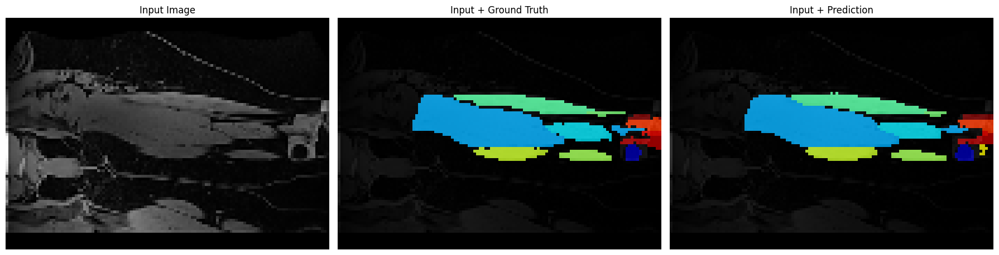

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9913
Mean IoU: 0.8609
Mean Dice Score: 0.8992


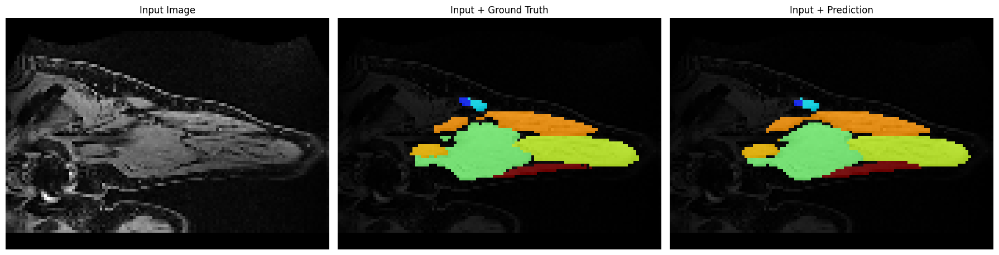

---------------------------------
Nombre de réentrainnement : 10/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch: 1/30 	Training Loss: 0.2961 	Validation Loss: 0.4349
	Training Accuracy: 0.9603 	Validation Accuracy: 0.9682
Saved best model at epoch 1 with validation loss: 0.4349
Epoch: 2/30 	Training Loss: 0.3391 	Validation Loss: 0.4249
	Training Accuracy: 0.9546 	Validation Accuracy: 0.9639
Saved best model at epoch 2 with validation loss: 0.4249
Epoch: 3/30 	Training Loss: 0.3035 	Validation Loss: 0.3883
	Training Accuracy: 0.9614 	Validation Accuracy: 0.9672
Saved best model at epoch 3 with validation loss: 0.3883
Epoch: 4/30 	Training Loss: 0.3207 	Validation Loss: 0.3793
	Training Accuracy: 0.9623 	Validation Accuracy: 0.9660
Saved best model at epoch 4 with validation loss: 0.3793
Epoch: 5/30 	Training Loss: 0.3406 	Validation Loss: 0.4083
	Training Accuracy: 0.9585 	Validation Accuracy: 0.9672
Epoch: 6/30 	Training Loss: 0.3229 	Validation Loss: 0.4501
	Training Accuracy: 0.9582 	Validation Accuracy: 0.9647
Epoch: 7/30 	Training Loss: 0.3252 	Validation Loss: 0.4451
	Training Accura

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9902
Mean IoU: 0.8602
Mean Dice Score: 0.9027


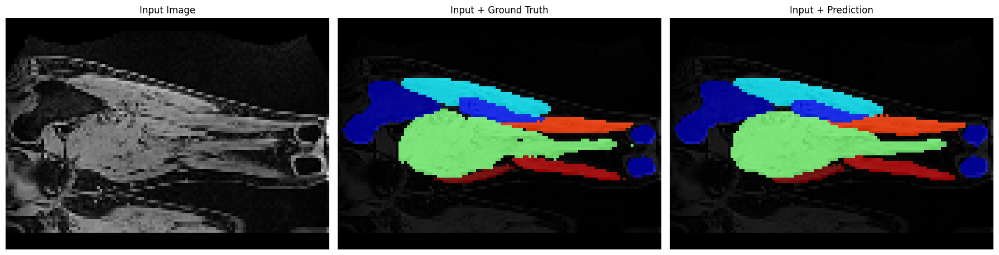

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9912
Mean IoU: 0.8582
Mean Dice Score: 0.8962


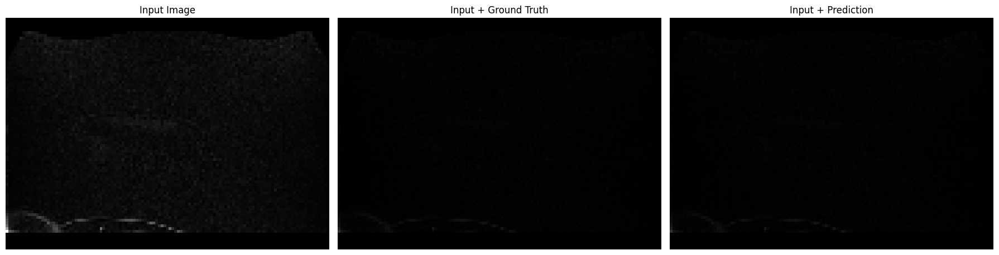

---------------------------------
Nombre de réentrainnement : 11/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch: 1/30 	Training Loss: 0.3284 	Validation Loss: 0.4343
	Training Accuracy: 0.9618 	Validation Accuracy: 0.9696
Saved best model at epoch 1 with validation loss: 0.4343
Epoch: 2/30 	Training Loss: 0.3176 	Validation Loss: 0.4067
	Training Accuracy: 0.9618 	Validation Accuracy: 0.9714
Saved best model at epoch 2 with validation loss: 0.4067
Epoch: 3/30 	Training Loss: 0.3163 	Validation Loss: 0.4351
	Training Accuracy: 0.9583 	Validation Accuracy: 0.9672
Epoch: 4/30 	Training Loss: 0.3062 	Validation Loss: 0.3458
	Training Accuracy: 0.9602 	Validation Accuracy: 0.9662
Saved best model at epoch 4 with validation loss: 0.3458
Epoch: 5/30 	Training Loss: 0.3242 	Validation Loss: 0.3838
	Training Accuracy: 0.9593 	Validation Accuracy: 0.9657
Epoch: 6/30 	Training Loss: 0.3215 	Validation Loss: 0.4123
	Training Accuracy: 0.9606 	Validation Accuracy: 0.9645
Epoch: 7/30 	Training Loss: 0.3317 	Validation Loss: 0.4177
	Training Accuracy: 0.9603 	Validation Accuracy: 0.9659
Epoch: 8/30 	Trai

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9901
Mean IoU: 0.8440
Mean Dice Score: 0.8866


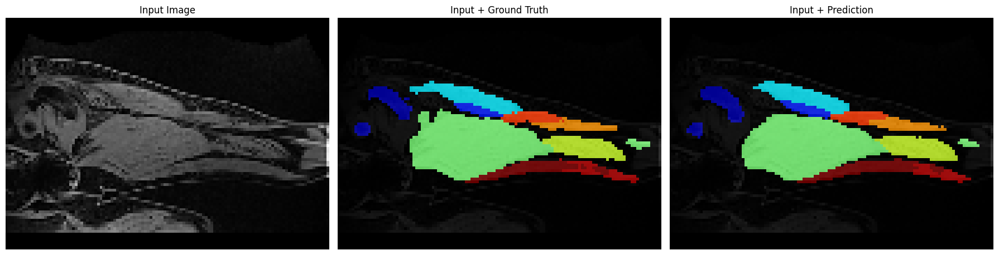

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9911
Mean IoU: 0.8582
Mean Dice Score: 0.8965


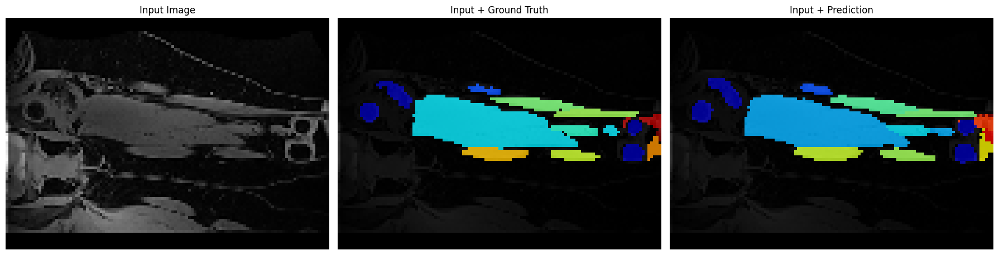

---------------------------------
Nombre de réentrainnement : 12/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch: 1/30 	Training Loss: 0.3360 	Validation Loss: 0.4107
	Training Accuracy: 0.9566 	Validation Accuracy: 0.9686
Saved best model at epoch 1 with validation loss: 0.4107
Epoch: 2/30 	Training Loss: 0.3311 	Validation Loss: 0.4516
	Training Accuracy: 0.9580 	Validation Accuracy: 0.9682
Epoch: 3/30 	Training Loss: 0.3225 	Validation Loss: 0.4445
	Training Accuracy: 0.9564 	Validation Accuracy: 0.9654
Epoch: 4/30 	Training Loss: 0.3297 	Validation Loss: 0.3759
	Training Accuracy: 0.9561 	Validation Accuracy: 0.9652
Saved best model at epoch 4 with validation loss: 0.3759
Epoch: 5/30 	Training Loss: 0.3139 	Validation Loss: 0.3898
	Training Accuracy: 0.9568 	Validation Accuracy: 0.9628
Epoch: 6/30 	Training Loss: 0.3286 	Validation Loss: 0.4180
	Training Accuracy: 0.9571 	Validation Accuracy: 0.9646
Epoch: 7/30 	Training Loss: 0.3345 	Validation Loss: 0.4302
	Training Accuracy: 0.9579 	Validation Accuracy: 0.9657
Epoch: 8/30 	Training Loss: 0.3433 	Validation Loss: 0.4311
	Training Accu

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9901
Mean IoU: 0.8570
Mean Dice Score: 0.8998


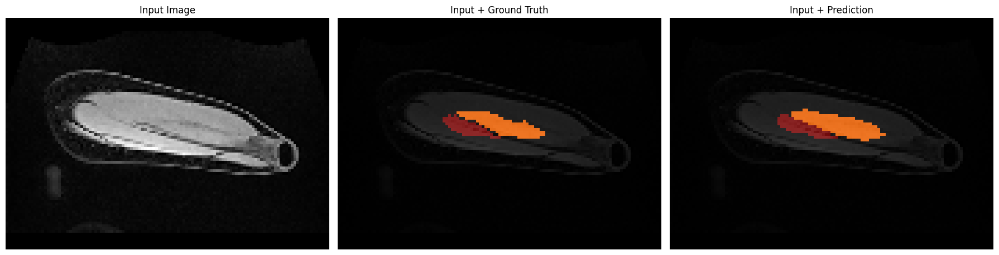

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9912
Mean IoU: 0.8603
Mean Dice Score: 0.8988


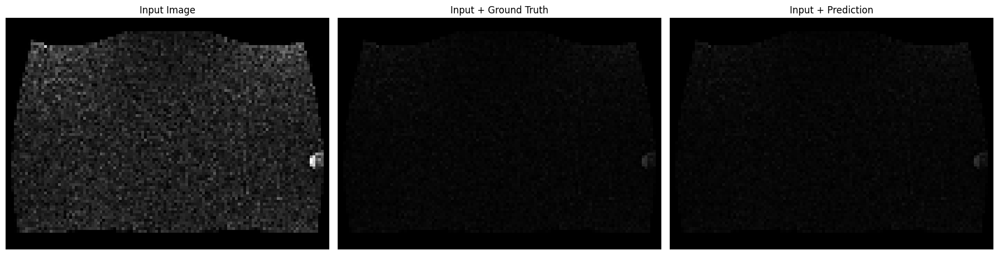

---------------------------------
Nombre de réentrainnement : 13/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch: 1/30 	Training Loss: 0.3443 	Validation Loss: 0.3979
	Training Accuracy: 0.9607 	Validation Accuracy: 0.9702
Saved best model at epoch 1 with validation loss: 0.3979
Epoch: 2/30 	Training Loss: 0.3252 	Validation Loss: 0.4077
	Training Accuracy: 0.9594 	Validation Accuracy: 0.9670
Epoch: 3/30 	Training Loss: 0.3263 	Validation Loss: 0.4446
	Training Accuracy: 0.9580 	Validation Accuracy: 0.9653
Epoch: 4/30 	Training Loss: 0.3487 	Validation Loss: 0.4046
	Training Accuracy: 0.9585 	Validation Accuracy: 0.9677
Epoch: 5/30 	Training Loss: 0.3229 	Validation Loss: 0.4043
	Training Accuracy: 0.9571 	Validation Accuracy: 0.9693
Epoch: 6/30 	Training Loss: 0.3225 	Validation Loss: 0.3578
	Training Accuracy: 0.9591 	Validation Accuracy: 0.9696
Saved best model at epoch 6 with validation loss: 0.3578
Epoch: 7/30 	Training Loss: 0.3291 	Validation Loss: 0.3894
	Training Accuracy: 0.9595 	Validation Accuracy: 0.9696
Epoch: 8/30 	Training Loss: 0.3105 	Validation Loss: 0.4198
	Training Accu

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9902
Mean IoU: 0.8654
Mean Dice Score: 0.9082


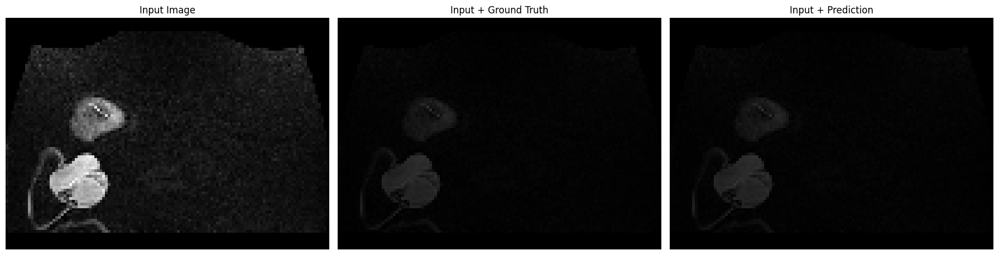

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9913
Mean IoU: 0.8609
Mean Dice Score: 0.8991


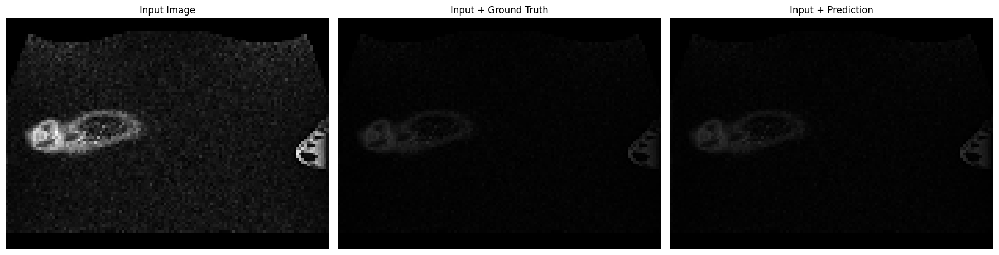

---------------------------------
Nombre de réentrainnement : 14/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch: 1/30 	Training Loss: 0.3185 	Validation Loss: 0.4097
	Training Accuracy: 0.9636 	Validation Accuracy: 0.9667
Saved best model at epoch 1 with validation loss: 0.4097
Epoch: 2/30 	Training Loss: 0.3049 	Validation Loss: 0.3470
	Training Accuracy: 0.9589 	Validation Accuracy: 0.9671
Saved best model at epoch 2 with validation loss: 0.3470
Epoch: 3/30 	Training Loss: 0.3438 	Validation Loss: 0.3664
	Training Accuracy: 0.9605 	Validation Accuracy: 0.9691
Epoch: 4/30 	Training Loss: 0.3177 	Validation Loss: 0.4242
	Training Accuracy: 0.9598 	Validation Accuracy: 0.9686
Epoch: 5/30 	Training Loss: 0.3210 	Validation Loss: 0.3968
	Training Accuracy: 0.9536 	Validation Accuracy: 0.9661
Epoch: 6/30 	Training Loss: 0.3008 	Validation Loss: 0.4359
	Training Accuracy: 0.9623 	Validation Accuracy: 0.9663
Epoch: 7/30 	Training Loss: 0.3203 	Validation Loss: 0.4170
	Training Accuracy: 0.9591 	Validation Accuracy: 0.9663
Epoch: 8/30 	Training Loss: 0.3273 	Validation Loss: 0.4448
	Training Accu

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9901
Mean IoU: 0.8556
Mean Dice Score: 0.8984


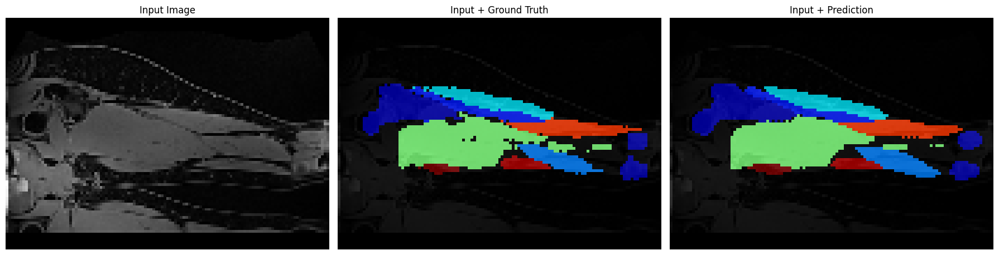

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9912
Mean IoU: 0.8594
Mean Dice Score: 0.8977


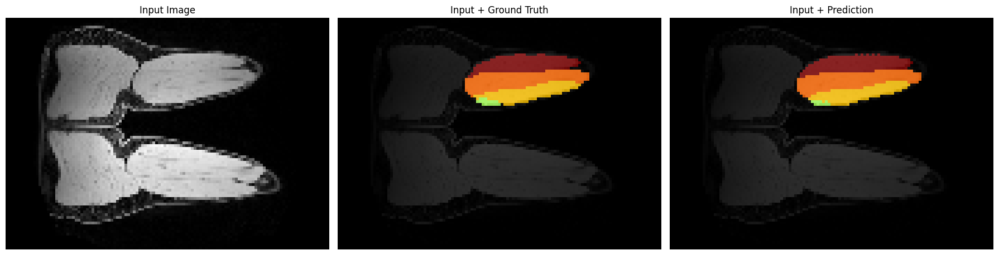

---------------------------------
Nombre de réentrainnement : 15/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch: 1/30 	Training Loss: 0.3278 	Validation Loss: 0.3899
	Training Accuracy: 0.9594 	Validation Accuracy: 0.9706
Saved best model at epoch 1 with validation loss: 0.3899
Epoch: 2/30 	Training Loss: 0.3234 	Validation Loss: 0.4348
	Training Accuracy: 0.9625 	Validation Accuracy: 0.9683
Epoch: 3/30 	Training Loss: 0.3265 	Validation Loss: 0.3583
	Training Accuracy: 0.9573 	Validation Accuracy: 0.9659
Saved best model at epoch 3 with validation loss: 0.3583
Epoch: 4/30 	Training Loss: 0.3222 	Validation Loss: 0.3661
	Training Accuracy: 0.9597 	Validation Accuracy: 0.9676
Epoch: 5/30 	Training Loss: 0.3263 	Validation Loss: 0.4365
	Training Accuracy: 0.9593 	Validation Accuracy: 0.9673
Epoch: 6/30 	Training Loss: 0.3109 	Validation Loss: 0.4156
	Training Accuracy: 0.9553 	Validation Accuracy: 0.9648
Epoch: 7/30 	Training Loss: 0.3161 	Validation Loss: 0.3966
	Training Accuracy: 0.9613 	Validation Accuracy: 0.9657
Epoch: 8/30 	Training Loss: 0.3371 	Validation Loss: 0.3938
	Training Accu

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9902
Mean IoU: 0.8672
Mean Dice Score: 0.9097


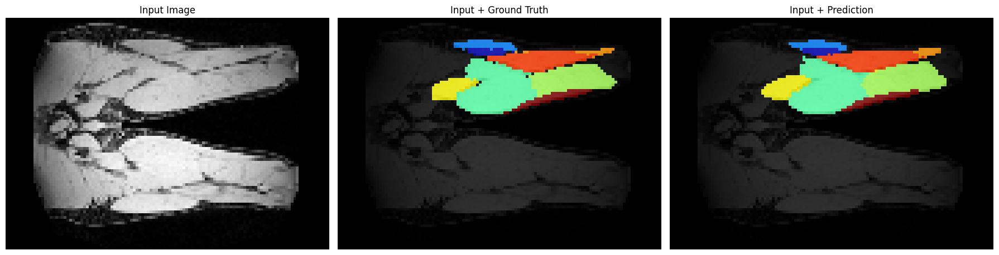

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9913
Mean IoU: 0.8622
Mean Dice Score: 0.9005


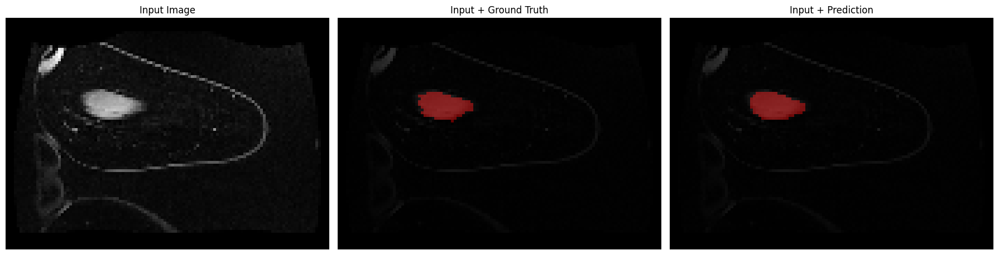

---------------------------------
Nombre de réentrainnement : 16/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch: 1/30 	Training Loss: 0.3143 	Validation Loss: 0.4170
	Training Accuracy: 0.9625 	Validation Accuracy: 0.9682
Saved best model at epoch 1 with validation loss: 0.4170
Epoch: 2/30 	Training Loss: 0.3146 	Validation Loss: 0.4348
	Training Accuracy: 0.9595 	Validation Accuracy: 0.9662
Epoch: 3/30 	Training Loss: 0.3126 	Validation Loss: 0.4254
	Training Accuracy: 0.9600 	Validation Accuracy: 0.9659
Epoch: 4/30 	Training Loss: 0.3073 	Validation Loss: 0.4071
	Training Accuracy: 0.9617 	Validation Accuracy: 0.9671
Saved best model at epoch 4 with validation loss: 0.4071
Epoch: 5/30 	Training Loss: 0.3107 	Validation Loss: 0.3704
	Training Accuracy: 0.9611 	Validation Accuracy: 0.9640
Saved best model at epoch 5 with validation loss: 0.3704
Epoch: 6/30 	Training Loss: 0.3220 	Validation Loss: 0.4066
	Training Accuracy: 0.9578 	Validation Accuracy: 0.9653
Epoch: 7/30 	Training Loss: 0.3443 	Validation Loss: 0.4447
	Training Accuracy: 0.9615 	Validation Accuracy: 0.9666
Epoch: 8/30 	Trai

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9903
Mean IoU: 0.8671
Mean Dice Score: 0.9096


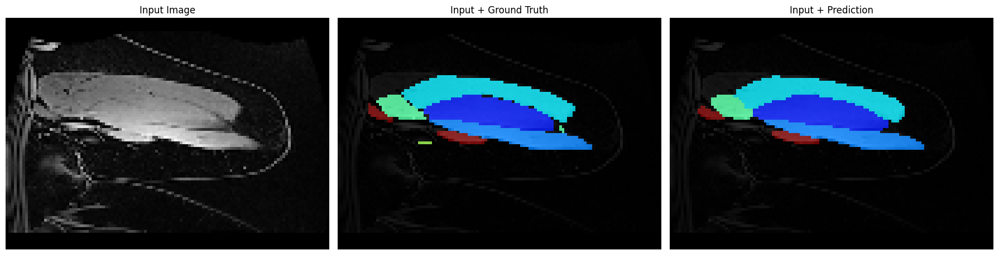

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9914
Mean IoU: 0.8637
Mean Dice Score: 0.9016


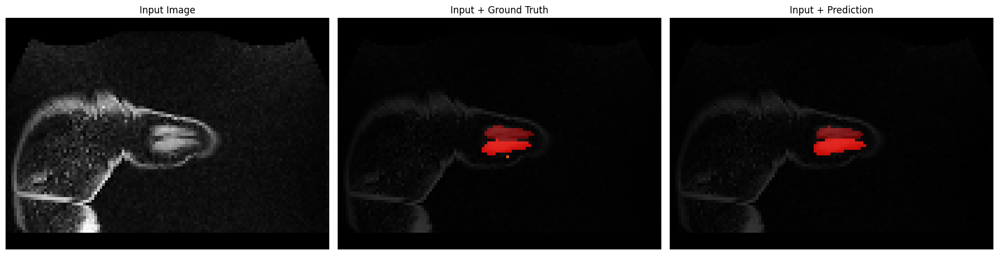

---------------------------------
Nombre de réentrainnement : 17/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch: 1/30 	Training Loss: 0.3289 	Validation Loss: 0.3907
	Training Accuracy: 0.9610 	Validation Accuracy: 0.9682
Saved best model at epoch 1 with validation loss: 0.3907
Epoch: 2/30 	Training Loss: 0.3256 	Validation Loss: 0.4057
	Training Accuracy: 0.9571 	Validation Accuracy: 0.9646
Epoch: 3/30 	Training Loss: 0.3232 	Validation Loss: 0.3887
	Training Accuracy: 0.9617 	Validation Accuracy: 0.9657
Saved best model at epoch 3 with validation loss: 0.3887
Epoch: 4/30 	Training Loss: 0.3364 	Validation Loss: 0.3799
	Training Accuracy: 0.9604 	Validation Accuracy: 0.9638
Saved best model at epoch 4 with validation loss: 0.3799
Epoch: 5/30 	Training Loss: 0.3187 	Validation Loss: 0.4470
	Training Accuracy: 0.9624 	Validation Accuracy: 0.9670
Epoch: 6/30 	Training Loss: 0.3050 	Validation Loss: 0.3679
	Training Accuracy: 0.9575 	Validation Accuracy: 0.9646
Saved best model at epoch 6 with validation loss: 0.3679
Epoch: 7/30 	Training Loss: 0.3420 	Validation Loss: 0.3968
	Training Accura

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9902
Mean IoU: 0.8655
Mean Dice Score: 0.9080


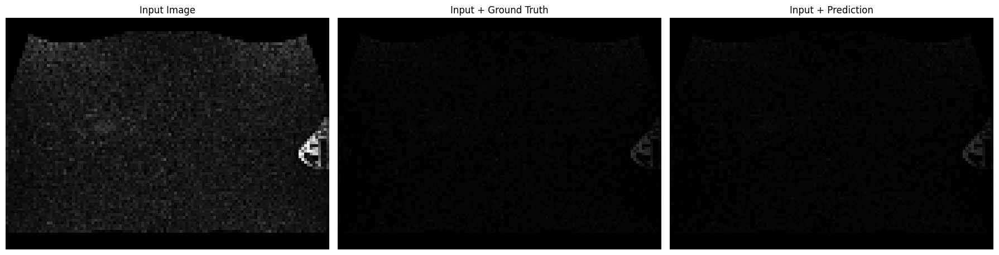

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9913
Mean IoU: 0.8625
Mean Dice Score: 0.9007


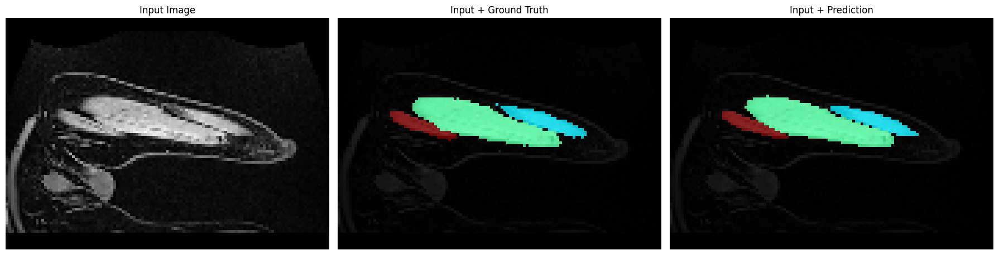

---------------------------------
Nombre de réentrainnement : 18/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch: 1/30 	Training Loss: 0.3161 	Validation Loss: 0.3965
	Training Accuracy: 0.9617 	Validation Accuracy: 0.9686
Saved best model at epoch 1 with validation loss: 0.3965
Epoch: 2/30 	Training Loss: 0.3152 	Validation Loss: 0.4210
	Training Accuracy: 0.9595 	Validation Accuracy: 0.9665
Epoch: 3/30 	Training Loss: 0.3239 	Validation Loss: 0.4234
	Training Accuracy: 0.9601 	Validation Accuracy: 0.9668
Epoch: 4/30 	Training Loss: 0.3297 	Validation Loss: 0.4406
	Training Accuracy: 0.9604 	Validation Accuracy: 0.9687
Epoch: 5/30 	Training Loss: 0.3399 	Validation Loss: 0.4180
	Training Accuracy: 0.9603 	Validation Accuracy: 0.9662
Epoch: 6/30 	Training Loss: 0.3105 	Validation Loss: 0.4373
	Training Accuracy: 0.9582 	Validation Accuracy: 0.9665
Epoch: 7/30 	Training Loss: 0.3076 	Validation Loss: 0.3486
	Training Accuracy: 0.9639 	Validation Accuracy: 0.9653
Saved best model at epoch 7 with validation loss: 0.3486
Epoch: 8/30 	Training Loss: 0.3063 	Validation Loss: 0.4362
	Training Accu

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9902
Mean IoU: 0.8491
Mean Dice Score: 0.8915


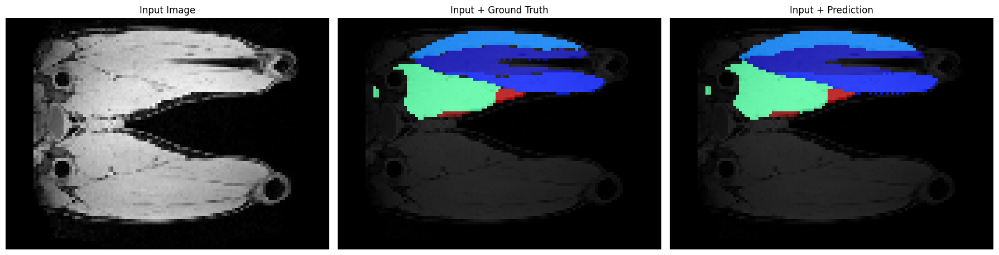

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9912
Mean IoU: 0.8593
Mean Dice Score: 0.8975


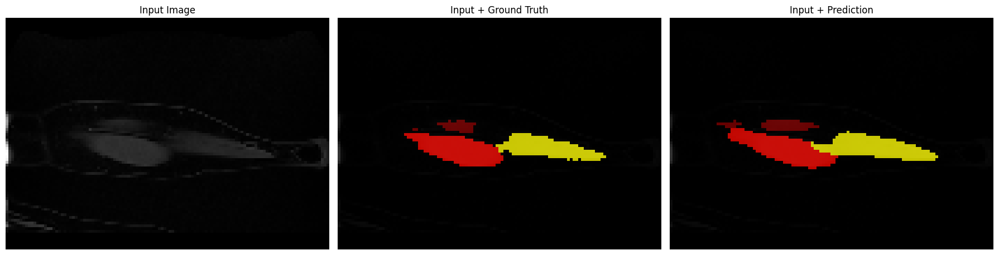

---------------------------------
Nombre de réentrainnement : 19/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch: 1/30 	Training Loss: 0.3072 	Validation Loss: 0.4371
	Training Accuracy: 0.9610 	Validation Accuracy: 0.9654
Saved best model at epoch 1 with validation loss: 0.4371
Epoch: 2/30 	Training Loss: 0.3206 	Validation Loss: 0.4085
	Training Accuracy: 0.9580 	Validation Accuracy: 0.9657
Saved best model at epoch 2 with validation loss: 0.4085
Epoch: 3/30 	Training Loss: 0.3222 	Validation Loss: 0.4384
	Training Accuracy: 0.9570 	Validation Accuracy: 0.9668
Epoch: 4/30 	Training Loss: 0.3181 	Validation Loss: 0.3951
	Training Accuracy: 0.9604 	Validation Accuracy: 0.9687
Saved best model at epoch 4 with validation loss: 0.3951
Epoch: 5/30 	Training Loss: 0.3480 	Validation Loss: 0.3940
	Training Accuracy: 0.9588 	Validation Accuracy: 0.9700
Saved best model at epoch 5 with validation loss: 0.3940
Epoch: 6/30 	Training Loss: 0.3161 	Validation Loss: 0.4064
	Training Accuracy: 0.9623 	Validation Accuracy: 0.9669
Epoch: 7/30 	Training Loss: 0.3318 	Validation Loss: 0.3673
	Training Accura

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9903
Mean IoU: 0.8675
Mean Dice Score: 0.9094


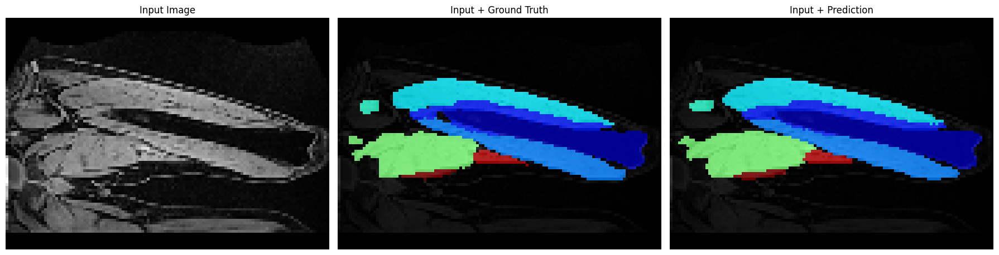

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9913
Mean IoU: 0.8619
Mean Dice Score: 0.9000


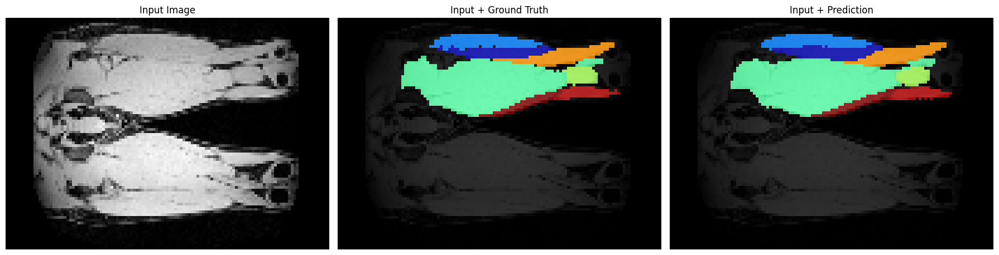

---------------------------------
Nombre de réentrainnement : 20/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch: 1/30 	Training Loss: 0.3191 	Validation Loss: 0.4328
	Training Accuracy: 0.9586 	Validation Accuracy: 0.9676
Saved best model at epoch 1 with validation loss: 0.4328
Epoch: 2/30 	Training Loss: 0.3173 	Validation Loss: 0.4124
	Training Accuracy: 0.9606 	Validation Accuracy: 0.9681
Saved best model at epoch 2 with validation loss: 0.4124
Epoch: 3/30 	Training Loss: 0.3372 	Validation Loss: 0.3562
	Training Accuracy: 0.9601 	Validation Accuracy: 0.9688
Saved best model at epoch 3 with validation loss: 0.3562
Epoch: 4/30 	Training Loss: 0.3309 	Validation Loss: 0.4141
	Training Accuracy: 0.9577 	Validation Accuracy: 0.9671
Epoch: 5/30 	Training Loss: 0.3365 	Validation Loss: 0.3583
	Training Accuracy: 0.9589 	Validation Accuracy: 0.9703
Epoch: 6/30 	Training Loss: 0.3207 	Validation Loss: 0.3590
	Training Accuracy: 0.9594 	Validation Accuracy: 0.9685
Epoch: 7/30 	Training Loss: 0.3324 	Validation Loss: 0.4144
	Training Accuracy: 0.9595 	Validation Accuracy: 0.9680
Epoch: 8/30 	Trai

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9902
Mean IoU: 0.8517
Mean Dice Score: 0.8944


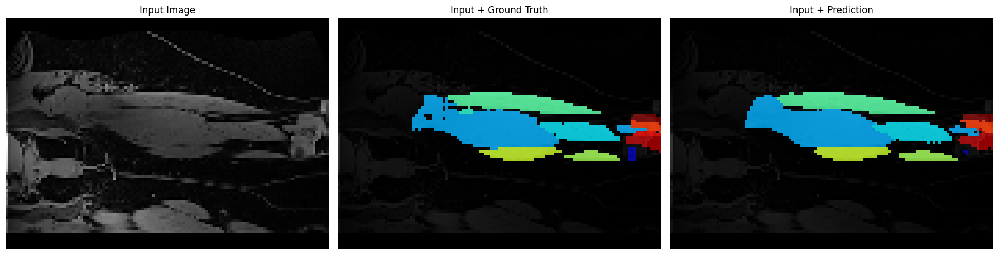

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9913
Mean IoU: 0.8593
Mean Dice Score: 0.8974


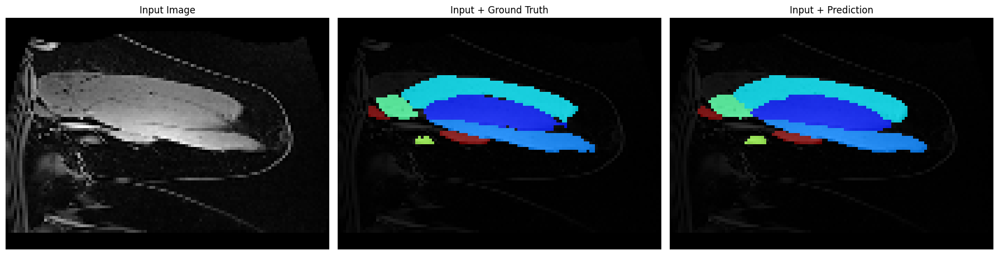

---------------------------------
Nombre de réentrainnement : 21/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch: 1/30 	Training Loss: 0.2960 	Validation Loss: 0.3763
	Training Accuracy: 0.9587 	Validation Accuracy: 0.9671
Saved best model at epoch 1 with validation loss: 0.3763
Epoch: 2/30 	Training Loss: 0.3063 	Validation Loss: 0.4230
	Training Accuracy: 0.9623 	Validation Accuracy: 0.9666
Epoch: 3/30 	Training Loss: 0.3337 	Validation Loss: 0.4052
	Training Accuracy: 0.9599 	Validation Accuracy: 0.9660
Epoch: 4/30 	Training Loss: 0.3269 	Validation Loss: 0.4440
	Training Accuracy: 0.9563 	Validation Accuracy: 0.9668
Epoch: 5/30 	Training Loss: 0.3332 	Validation Loss: 0.4195
	Training Accuracy: 0.9584 	Validation Accuracy: 0.9695
Epoch: 6/30 	Training Loss: 0.3126 	Validation Loss: 0.3933
	Training Accuracy: 0.9600 	Validation Accuracy: 0.9662
Epoch: 7/30 	Training Loss: 0.3295 	Validation Loss: 0.4246
	Training Accuracy: 0.9596 	Validation Accuracy: 0.9644
Epoch: 8/30 	Training Loss: 0.3447 	Validation Loss: 0.4165
	Training Accuracy: 0.9588 	Validation Accuracy: 0.9660
Epoch: 9/30 	Tr

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9901
Mean IoU: 0.8652
Mean Dice Score: 0.9083


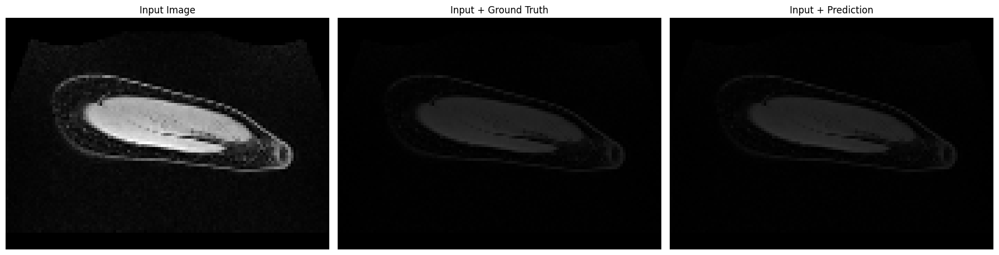

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9913
Mean IoU: 0.8614
Mean Dice Score: 0.8996


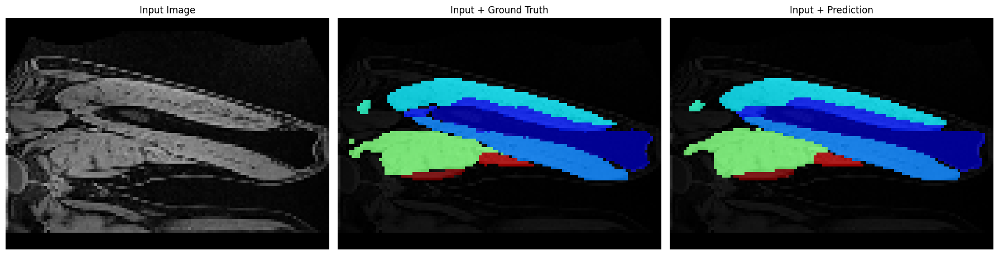

---------------------------------
Nombre de réentrainnement : 22/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch: 1/30 	Training Loss: 0.3182 	Validation Loss: 0.4178
	Training Accuracy: 0.9584 	Validation Accuracy: 0.9662
Saved best model at epoch 1 with validation loss: 0.4178
Epoch: 2/30 	Training Loss: 0.3165 	Validation Loss: 0.3776
	Training Accuracy: 0.9584 	Validation Accuracy: 0.9689
Saved best model at epoch 2 with validation loss: 0.3776
Epoch: 3/30 	Training Loss: 0.3484 	Validation Loss: 0.4322
	Training Accuracy: 0.9587 	Validation Accuracy: 0.9659
Epoch: 4/30 	Training Loss: 0.3276 	Validation Loss: 0.4238
	Training Accuracy: 0.9568 	Validation Accuracy: 0.9665
Epoch: 5/30 	Training Loss: 0.3488 	Validation Loss: 0.4225
	Training Accuracy: 0.9597 	Validation Accuracy: 0.9670
Epoch: 6/30 	Training Loss: 0.3300 	Validation Loss: 0.3674
	Training Accuracy: 0.9623 	Validation Accuracy: 0.9691
Saved best model at epoch 6 with validation loss: 0.3674
Epoch: 7/30 	Training Loss: 0.3247 	Validation Loss: 0.4314
	Training Accuracy: 0.9615 	Validation Accuracy: 0.9683
Epoch: 8/30 	Trai

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9901
Mean IoU: 0.8481
Mean Dice Score: 0.8911


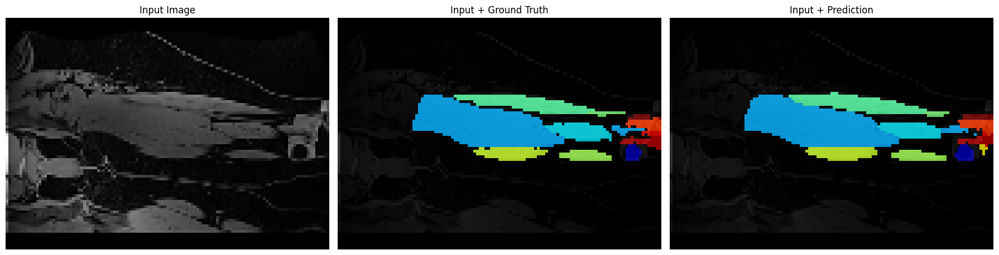

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9911
Mean IoU: 0.8588
Mean Dice Score: 0.8972


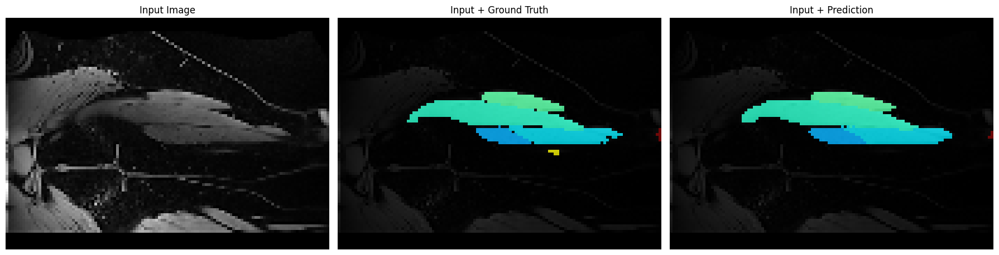

---------------------------------
Nombre de réentrainnement : 23/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch: 1/30 	Training Loss: 0.3070 	Validation Loss: 0.4245
	Training Accuracy: 0.9584 	Validation Accuracy: 0.9678
Saved best model at epoch 1 with validation loss: 0.4245
Epoch: 2/30 	Training Loss: 0.3375 	Validation Loss: 0.3780
	Training Accuracy: 0.9598 	Validation Accuracy: 0.9653
Saved best model at epoch 2 with validation loss: 0.3780
Epoch: 3/30 	Training Loss: 0.3219 	Validation Loss: 0.3563
	Training Accuracy: 0.9594 	Validation Accuracy: 0.9640
Saved best model at epoch 3 with validation loss: 0.3563
Epoch: 4/30 	Training Loss: 0.3383 	Validation Loss: 0.3911
	Training Accuracy: 0.9582 	Validation Accuracy: 0.9661
Epoch: 5/30 	Training Loss: 0.3277 	Validation Loss: 0.3498
	Training Accuracy: 0.9562 	Validation Accuracy: 0.9662
Saved best model at epoch 5 with validation loss: 0.3498
Epoch: 6/30 	Training Loss: 0.3312 	Validation Loss: 0.3766
	Training Accuracy: 0.9592 	Validation Accuracy: 0.9655
Epoch: 7/30 	Training Loss: 0.3397 	Validation Loss: 0.3753
	Training Accura

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9902
Mean IoU: 0.8595
Mean Dice Score: 0.9017


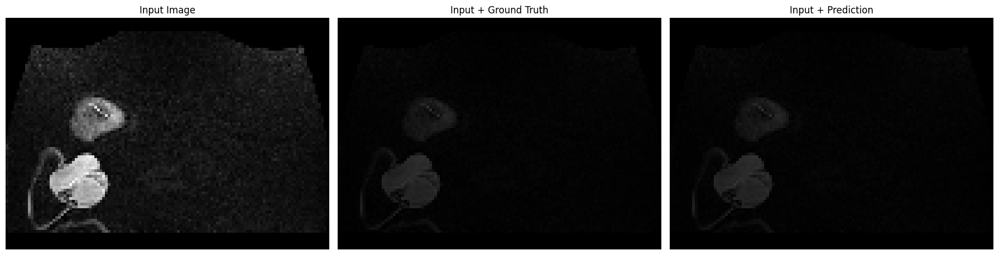

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


KeyboardInterrupt: 

In [61]:
#Inférence avec modele de base = test voir new_data
affichage_dice=[]
affichage_acc=[]
affichage_dice_new=[]
affichage_acc_new=[]
image_inference,label_inference,prediction,test_accuracy,mean_dice=test_model_dice(test_dataset, 'best_model.pth')
affichage_acc.append(test_accuracy)
affichage_dice.append(mean_dice)
image_inference_new,label_inference_new,prediction_new,test_accuracy_new,mean_dice_new=test_model_dice(test_dataset, 'best_model.pth')
affichage_acc_new.append(test_accuracy_new)
affichage_dice_new.append(mean_dice_new)
# print(type(label_inference))
# print(type(label_inference[0]))
# print(label_inference[0])
# print("------------------")

# Sur la segmentation modifier la prédiction 
# => comparaison vérité et prédiction puis ajout de 50% de diffrérence = Modification Epert
# for i in range(len(image_inference)):
#     image_inference[] = images_fe.squeeze(0) 
#     print(images_fe.shape)
# print(image_inference[0].shape)
compte=1
model_to_train=['best_model.pth','best_model_sys.pth','best_model_sys.pth','best_model_sys.pth','best_model_sys.pth']
for u in range(45):
    print('---------------------------------')
    print(f'Nombre de réentrainnement : {compte}/45')
    compte+=1
    model_to_train.append('best_model_sys.pth')
    corrected_predictions_list=[]
    for i in range(len(image_inference)):
        # print(type(label[i]))
        # print(image[i].shape)
        image_inference[i]=image_inference[i].squeeze(0)
        # print(image_inference[i].shape)
        # Prepare data for visualization
        imagep = image_inference[i].squeeze().detach().cpu().numpy()  # Image
        labelp = label_inference[i].squeeze().detach().cpu().numpy()  # Label
        predictionp = prediction[i].squeeze().detach().cpu().numpy()  # Prediction

        # Convert one-hot encoded label to class indices if necessary
        if labelp.ndim == 3:  # One-hot encoded label
            labelp = np.argmax(labelp, axis=0)

        # Ensure the image is grayscale if it's a single-channel image
        if imagep.ndim == 3:
            imagep = imagep[0]  # Take the first channel if it's RGB


        # Calculer la matrice des différences
        incorrect_pixels = (predictionp != labelp)

        # Générer une matrice aléatoire avec 20% de chances pour chaque pixel
        random_mask = np.random.rand(*predictionp.shape) < 0.5

        # Identifier les pixels à corriger (intersection des pixels incorrects et du masque aléatoire)
        correction_mask = incorrect_pixels & random_mask

        # Appliquer les corrections sur la matrice de prédictions
        corrected_predictions = predictionp.copy()
        corrected_predictions[correction_mask] = labelp[correction_mask]
        corrected_predictions_list.append(corrected_predictions)


    # Vérifier les tailles des listes avant de passer à train_test_split
    # print(len(image_inference))  # Affiche la taille de 'image'
    # print(len(corrected_predictions_list))  # Affiche la taille de 'corrected_predictions_list'

    # Assurez-vous que les deux ont le même nombre d'exemples
    if len(image_inference) != len(corrected_predictions_list):
        raise ValueError("Les listes 'image' et 'corrected_predictions_list' n'ont pas le même nombre d'échantillons")

    # Remise sus forme de dataloader
    new_train_image_files, new_valid_image_files, new_train_label_files, new_valid_label_files = train_test_split(
        image_inference, corrected_predictions_list, test_size=0.2, random_state=42
    )

    # print(type(image_inference))
    # print(type(new_train_image_files))

    new_train_image_files = [torch.tensor(img) for img in new_train_image_files]
    new_train_label_files = [torch.tensor(lbl) for lbl in new_train_label_files]
    new_train_image_files = torch.stack(new_train_image_files)
    new_train_label_files = torch.stack(new_train_label_files)
    # new_train_dataset = CustomDataset(new_train_image_files, new_train_label_files, transform=train_transforms)
    new_train_dataset = CustomDataset_tensor(new_train_image_files, new_train_label_files)
    new_train_dataset = TensorDataset(new_train_image_files, new_train_label_files)
    new_train_loader = DataLoader(new_train_dataset, batch_size=batch_size, shuffle=True, pin_memory=False)

    new_valid_image_files = [torch.tensor(img) for img in new_valid_image_files]
    new_valid_label_files = [torch.tensor(lbl) for lbl in new_valid_label_files]
    new_valid_image_files = torch.stack(new_valid_image_files)
    new_valid_label_files = torch.stack(new_valid_label_files)
    new_valid_dataset = CustomDataset_tensor(new_valid_image_files, new_valid_label_files)
    new_valid_dataset = TensorDataset(new_valid_image_files, new_valid_label_files)
    new_valid_loader = DataLoader(new_valid_dataset, batch_size=batch_size, shuffle=True, pin_memory=False)

    # print(type(train_loader))
    # print(type(new_train_loader))

    # Réentrainnement (avec et sans EWC)
    # model.load_state_dict(torch.load('best_model.pth'),strict=False)  # Load the best model
    # model.to(device)

    # # fine_tune_with_ewc(
    # #     model, new_train_loader, new_valid_loader, optimizer, scheduler, fisher, prev_params,
    # #     combined_loss, num_classes, lambda_ewc=lambda_ewc, dice_weight=dice_weight, n_epochs=30, device=device
    # # )



    list_train_loss=[]
    list_valid_loss=[]
    train_loss,valid_loss= train_model(new_train_loader,new_valid_loader,model,model_to_train[u])
    # train_loss,valid_loss= train_model_with_ewc(new_train_loader,new_valid_loader,model,train_loader,model_to_train[u], 0.01)

    list_train_loss.append(train_loss)
    list_valid_loss.append(valid_loss)

    # for i, loss in enumerate(list_train_loss):
    #     plt.plot(loss, label=f'Model {i}')  # Ajouter une légende avec le numéro de modèle

    # # Ajouter des détails au graphique
    # plt.title('Train Loss Comparison')
    # plt.xlabel('Epochs')
    # plt.ylabel('Loss')
    # plt.legend()  # Afficher les légendes
    # plt.grid(True)  # Ajouter une grille pour faciliter la lecture
    # plt.show()

    # # Inférence avec nouveau model =data test pour comparé nouvelle prédiction et vérité 
    image_inference,label_inference,prediction,test_accuracy,mean_dice=test_model_dice(test_dataset, 'best_model_sys.pth')
    image_inference_new,label_inference_new,prediction_new,test_accuracy_new,mean_dice_new=test_model_dice(new_dataset, 'best_model_sys.pth')

    affichage_acc.append(test_accuracy)
    affichage_dice.append(mean_dice)
    affichage_acc_new.append(test_accuracy_new)
    affichage_dice_new.append(mean_dice_new)

plt.plot(range(len(affichage_acc)), affichage_acc)
plt.title('train test correction 20%')
plt.xlabel('nb training')
plt.ylabel('précision %')
plt.legend()  # Afficher les légendes
plt.grid(True)  # Ajouter une grille pour faciliter la lecture
plt.show()

plt.plot(range(len(affichage_dice)), affichage_dice)
plt.title('train test correction 20%')
plt.xlabel('nb training')
plt.ylabel('Dice loss')
plt.legend()  # Afficher les légendes
plt.grid(True)  # Ajouter une grille pour faciliter la lecture
plt.show()






### Avec Méthode EWC

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9900
Mean IoU: 0.8414
Mean Dice Score: 0.8842


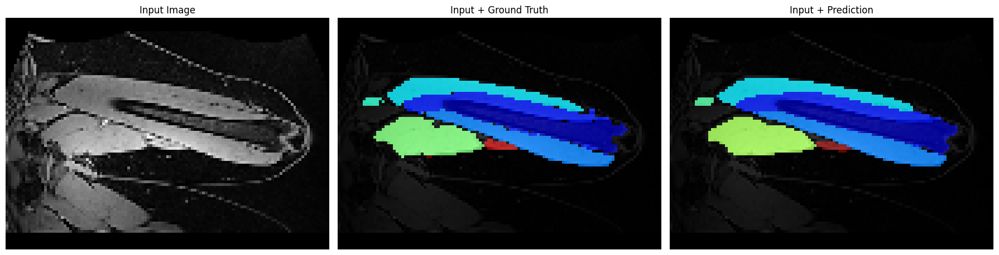

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9900
Mean IoU: 0.8414
Mean Dice Score: 0.8842


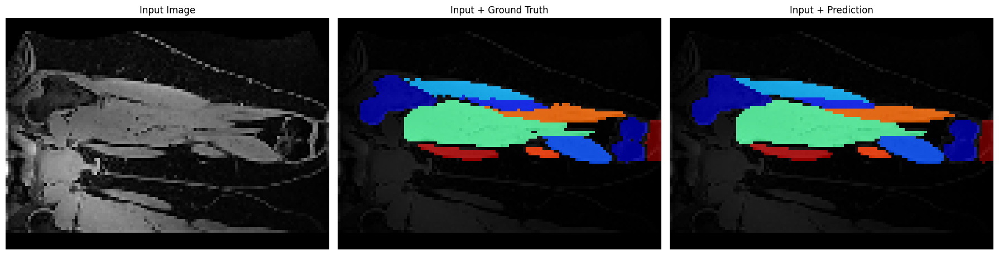

---------------------------------
Nombre de réentrainnement : 1/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.3688, Valid Loss: 0.6214
Saved best model at epoch 1 with validation loss: 0.6214
Epoch 2/30: Train Loss: 0.3601, Valid Loss: 0.3966
Saved best model at epoch 2 with validation loss: 0.3966
Epoch 3/30: Train Loss: 0.3473, Valid Loss: 0.5103
Epoch 4/30: Train Loss: 0.3551, Valid Loss: 0.4521
Epoch 5/30: Train Loss: 0.3156, Valid Loss: 0.4464
Epoch 6/30: Train Loss: 0.3342, Valid Loss: 0.3966
Saved best model at epoch 6 with validation loss: 0.3966
Epoch 7/30: Train Loss: 0.3234, Valid Loss: 0.3953
Saved best model at epoch 7 with validation loss: 0.3953
Epoch 8/30: Train Loss: 0.3296, Valid Loss: 0.4265
Epoch 9/30: Train Loss: 0.3289, Valid Loss: 0.3864
Saved best model at epoch 9 with validation loss: 0.3864
Epoch 10/30: Train Loss: 0.3047, Valid Loss: 0.4444
Epoch 11/30: Train Loss: 0.3093, Valid Loss: 0.3849
Saved best model at epoch 11 with validation loss: 0.3849
Epoch 12/30: Train Loss: 0.3070, Valid Loss: 0.4389
Epoch 13/30: Train Loss: 0.3271, Valid Los

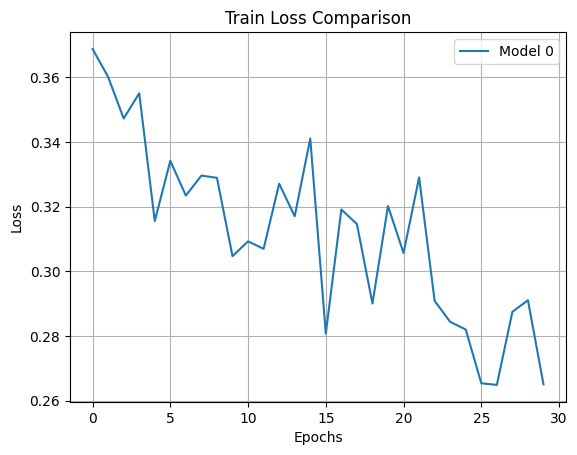

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9909
Mean IoU: 0.8659
Mean Dice Score: 0.9051


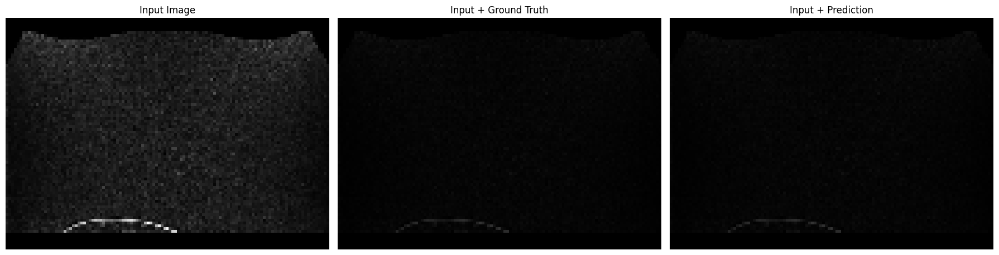

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9883
Mean IoU: 0.8029
Mean Dice Score: 0.8464


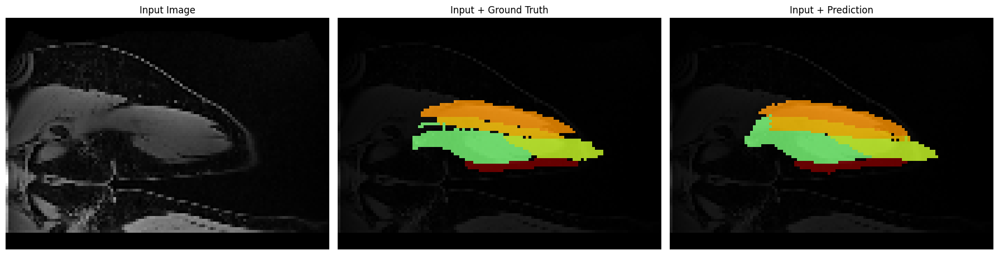

---------------------------------
Nombre de réentrainnement : 2/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.3349, Valid Loss: 0.4933
Saved best model at epoch 1 with validation loss: 0.4933
Epoch 2/30: Train Loss: 0.3356, Valid Loss: 0.4782
Saved best model at epoch 2 with validation loss: 0.4782
Epoch 3/30: Train Loss: 0.3181, Valid Loss: 0.4382
Saved best model at epoch 3 with validation loss: 0.4382
Epoch 4/30: Train Loss: 0.3004, Valid Loss: 0.3982
Saved best model at epoch 4 with validation loss: 0.3982
Epoch 5/30: Train Loss: 0.2908, Valid Loss: 0.3821
Saved best model at epoch 5 with validation loss: 0.3821
Epoch 6/30: Train Loss: 0.2950, Valid Loss: 0.4194
Epoch 7/30: Train Loss: 0.3091, Valid Loss: 0.4579
Epoch 8/30: Train Loss: 0.3170, Valid Loss: 0.3916
Epoch 9/30: Train Loss: 0.2976, Valid Loss: 0.4235
Epoch 10/30: Train Loss: 0.3018, Valid Loss: 0.4062
Epoch 11/30: Train Loss: 0.2704, Valid Loss: 0.3736
Saved best model at epoch 11 with validation loss: 0.3736
Epoch 12/30: Train Loss: 0.2987, Valid Loss: 0.4028
Epoch 13/30: Train Loss: 0.2970, Valid Los

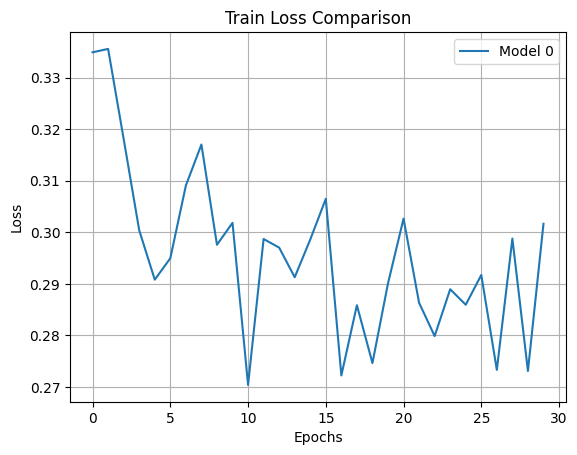

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9900
Mean IoU: 0.8446
Mean Dice Score: 0.8841


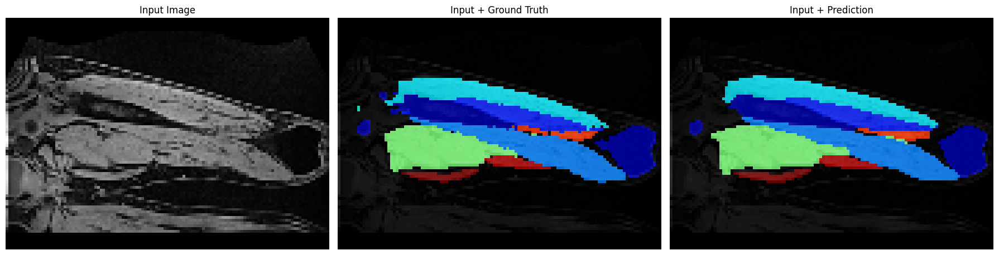

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9863
Mean IoU: 0.7290
Mean Dice Score: 0.7753


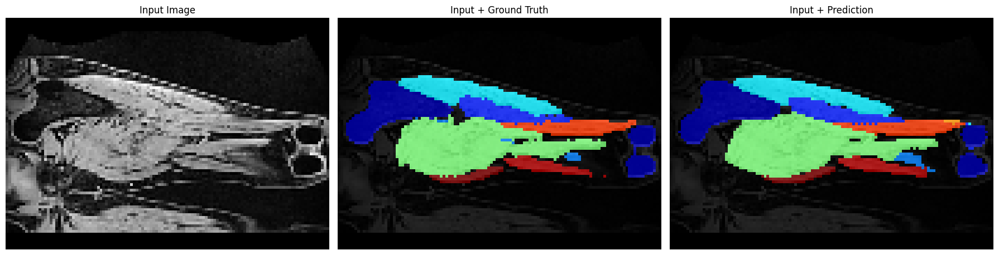

---------------------------------
Nombre de réentrainnement : 3/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2969, Valid Loss: 1.3419
Saved best model at epoch 1 with validation loss: 1.3419
Epoch 2/30: Train Loss: 0.3065, Valid Loss: 0.4598
Saved best model at epoch 2 with validation loss: 0.4598
Epoch 3/30: Train Loss: 0.3058, Valid Loss: 0.6474
Epoch 4/30: Train Loss: 0.3130, Valid Loss: 0.4563
Saved best model at epoch 4 with validation loss: 0.4563
Epoch 5/30: Train Loss: 0.2915, Valid Loss: 0.4201
Saved best model at epoch 5 with validation loss: 0.4201
Epoch 6/30: Train Loss: 0.2982, Valid Loss: 0.4455
Epoch 7/30: Train Loss: 0.3004, Valid Loss: 0.4132
Saved best model at epoch 7 with validation loss: 0.4132
Epoch 8/30: Train Loss: 0.3021, Valid Loss: 0.4027
Saved best model at epoch 8 with validation loss: 0.4027
Epoch 9/30: Train Loss: 0.3080, Valid Loss: 0.4218
Epoch 10/30: Train Loss: 0.2940, Valid Loss: 0.4222
Epoch 11/30: Train Loss: 0.3012, Valid Loss: 0.4164
Epoch 12/30: Train Loss: 0.3075, Valid Loss: 0.4295
Epoch 13/30: Train Loss: 0.3151, Valid Loss

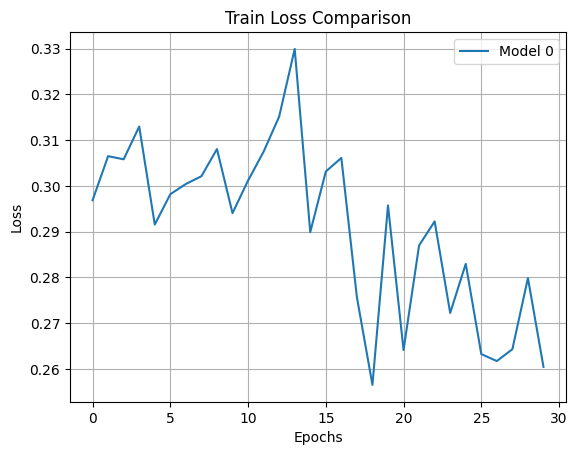

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9906
Mean IoU: 0.8530
Mean Dice Score: 0.8899


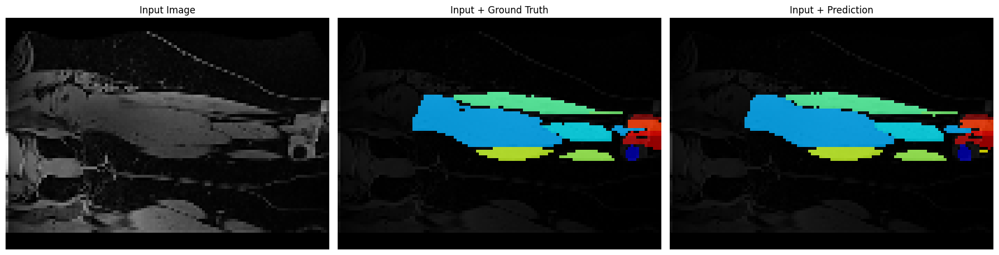

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9856
Mean IoU: 0.7578
Mean Dice Score: 0.8062


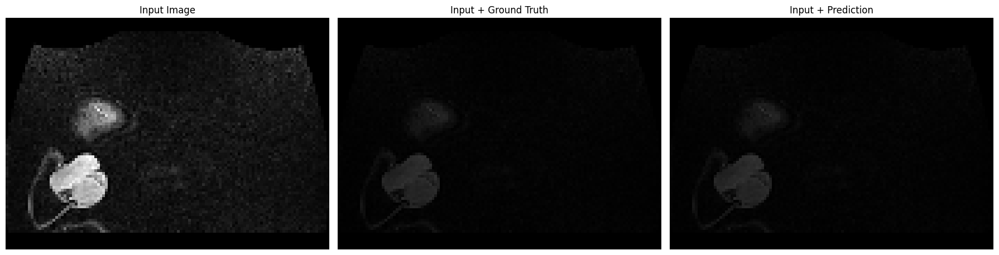

---------------------------------
Nombre de réentrainnement : 4/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2907, Valid Loss: 1.2683
Saved best model at epoch 1 with validation loss: 1.2683
Epoch 2/30: Train Loss: 0.2930, Valid Loss: 0.4744
Saved best model at epoch 2 with validation loss: 0.4744
Epoch 3/30: Train Loss: 0.3345, Valid Loss: 0.7070
Epoch 4/30: Train Loss: 0.2911, Valid Loss: 0.4006
Saved best model at epoch 4 with validation loss: 0.4006
Epoch 5/30: Train Loss: 0.2818, Valid Loss: 0.4335
Epoch 6/30: Train Loss: 0.2974, Valid Loss: 0.4206
Epoch 7/30: Train Loss: 0.2883, Valid Loss: 0.3611
Saved best model at epoch 7 with validation loss: 0.3611
Epoch 8/30: Train Loss: 0.2845, Valid Loss: 0.3767
Epoch 9/30: Train Loss: 0.2703, Valid Loss: 0.4225
Epoch 10/30: Train Loss: 0.2905, Valid Loss: 0.3897
Epoch 11/30: Train Loss: 0.2704, Valid Loss: 0.4329
Epoch 12/30: Train Loss: 0.2491, Valid Loss: 0.4052
Epoch 13/30: Train Loss: 0.2930, Valid Loss: 0.4300
Epoch 14/30: Train Loss: 0.2790, Valid Loss: 0.3555
Saved best model at epoch 14 with validation loss: 0.

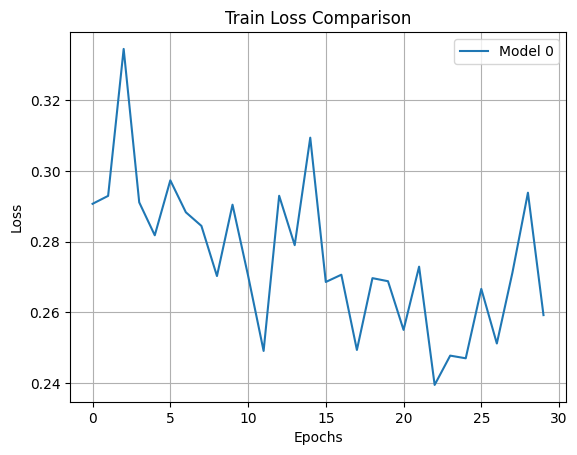

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9913
Mean IoU: 0.8540
Mean Dice Score: 0.8882


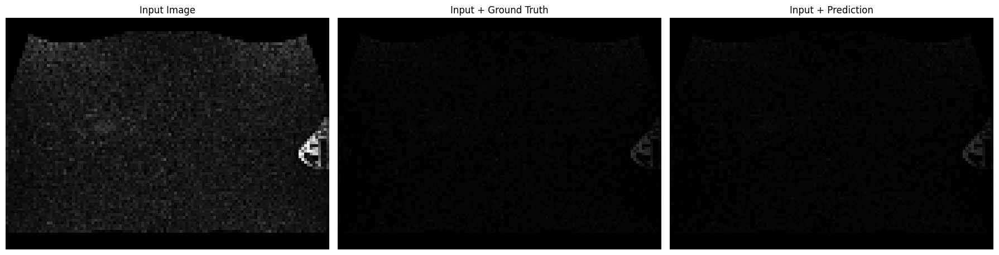

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9852
Mean IoU: 0.7418
Mean Dice Score: 0.7890


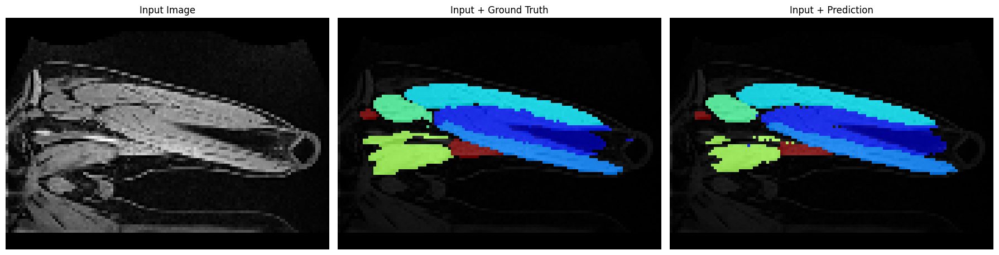

---------------------------------
Nombre de réentrainnement : 5/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2753, Valid Loss: 1.1042
Saved best model at epoch 1 with validation loss: 1.1042
Epoch 2/30: Train Loss: 0.2873, Valid Loss: 0.4718
Saved best model at epoch 2 with validation loss: 0.4718
Epoch 3/30: Train Loss: 0.2767, Valid Loss: 0.5152
Epoch 4/30: Train Loss: 0.2896, Valid Loss: 0.4607
Saved best model at epoch 4 with validation loss: 0.4607
Epoch 5/30: Train Loss: 0.2609, Valid Loss: 0.4198
Saved best model at epoch 5 with validation loss: 0.4198
Epoch 6/30: Train Loss: 0.2930, Valid Loss: 0.4430
Epoch 7/30: Train Loss: 0.2924, Valid Loss: 0.4095
Saved best model at epoch 7 with validation loss: 0.4095
Epoch 8/30: Train Loss: 0.2818, Valid Loss: 0.4352
Epoch 9/30: Train Loss: 0.2688, Valid Loss: 0.4349
Epoch 10/30: Train Loss: 0.2992, Valid Loss: 0.4177
Epoch 11/30: Train Loss: 0.2939, Valid Loss: 0.4135
Epoch 12/30: Train Loss: 0.2789, Valid Loss: 0.4396
Epoch 13/30: Train Loss: 0.2504, Valid Loss: 0.4250
Epoch 14/30: Train Loss: 0.2879, Valid Loss: 0.4

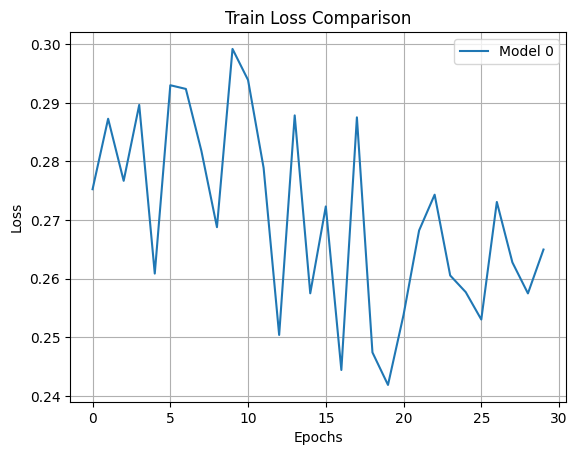

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9925
Mean IoU: 0.8790
Mean Dice Score: 0.9085


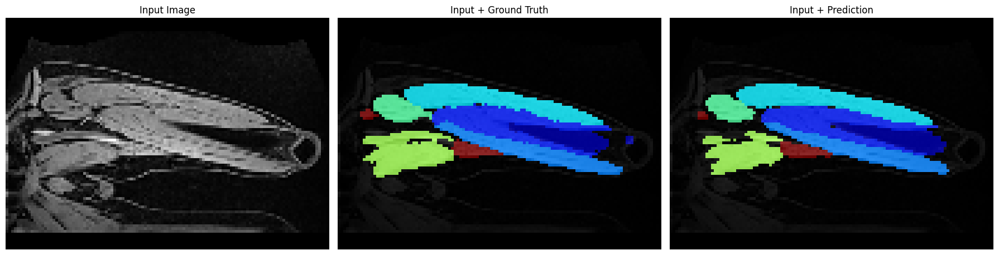

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9844
Mean IoU: 0.7306
Mean Dice Score: 0.7782


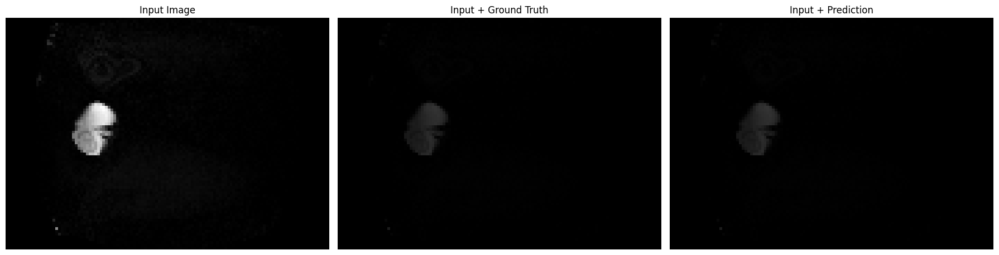

---------------------------------
Nombre de réentrainnement : 6/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2720, Valid Loss: 1.1643
Saved best model at epoch 1 with validation loss: 1.1643
Epoch 2/30: Train Loss: 0.2885, Valid Loss: 0.4790
Saved best model at epoch 2 with validation loss: 0.4790
Epoch 3/30: Train Loss: 0.2708, Valid Loss: 0.5533
Epoch 4/30: Train Loss: 0.2724, Valid Loss: 0.4654
Saved best model at epoch 4 with validation loss: 0.4654
Epoch 5/30: Train Loss: 0.2653, Valid Loss: 0.3761
Saved best model at epoch 5 with validation loss: 0.3761
Epoch 6/30: Train Loss: 0.2686, Valid Loss: 0.4134
Epoch 7/30: Train Loss: 0.2607, Valid Loss: 0.3719
Saved best model at epoch 7 with validation loss: 0.3719
Epoch 8/30: Train Loss: 0.2940, Valid Loss: 0.4255
Epoch 9/30: Train Loss: 0.2921, Valid Loss: 0.3859
Epoch 10/30: Train Loss: 0.2871, Valid Loss: 0.4210
Epoch 11/30: Train Loss: 0.2745, Valid Loss: 0.4382
Epoch 12/30: Train Loss: 0.2796, Valid Loss: 0.4837
Epoch 13/30: Train Loss: 0.3157, Valid Loss: 0.4613
Epoch 14/30: Train Loss: 0.2873, Valid Loss: 0.4

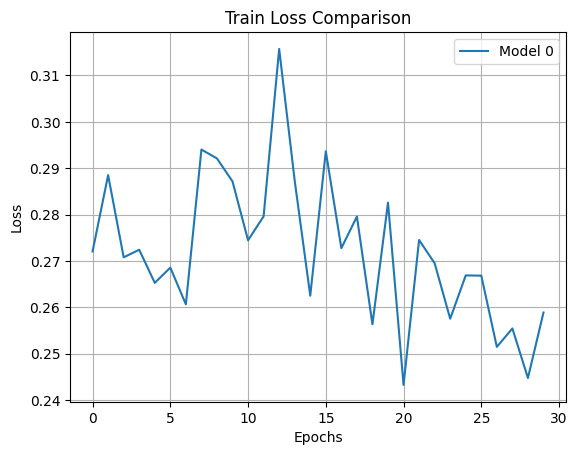

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9927
Mean IoU: 0.8770
Mean Dice Score: 0.9050


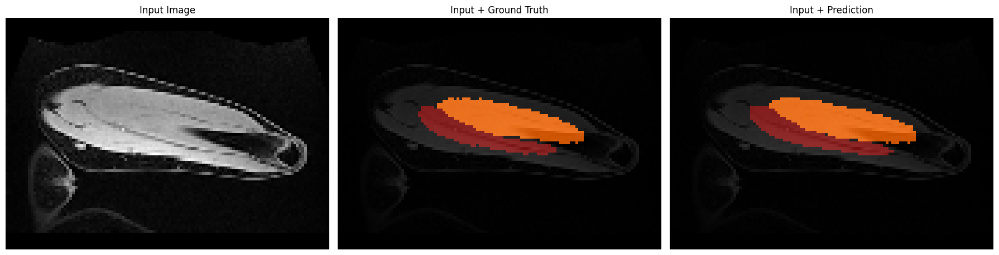

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9842
Mean IoU: 0.7190
Mean Dice Score: 0.7676


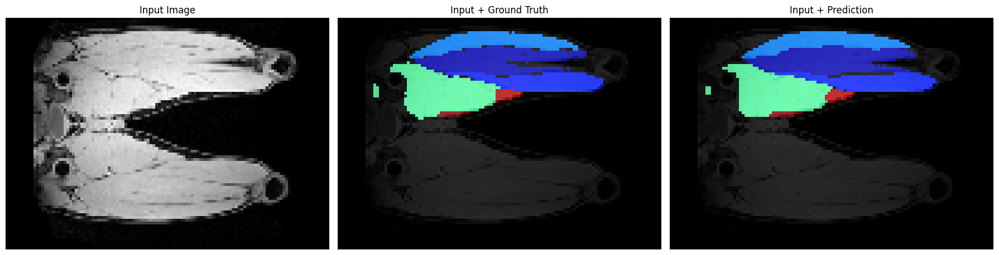

---------------------------------
Nombre de réentrainnement : 7/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2832, Valid Loss: 0.7299
Saved best model at epoch 1 with validation loss: 0.7299
Epoch 2/30: Train Loss: 0.2925, Valid Loss: 0.4114
Saved best model at epoch 2 with validation loss: 0.4114
Epoch 3/30: Train Loss: 0.2890, Valid Loss: 0.4591
Epoch 4/30: Train Loss: 0.2951, Valid Loss: 0.4524
Epoch 5/30: Train Loss: 0.2696, Valid Loss: 0.4509
Epoch 6/30: Train Loss: 0.2745, Valid Loss: 0.4450
Epoch 7/30: Train Loss: 0.2692, Valid Loss: 0.3656
Saved best model at epoch 7 with validation loss: 0.3656
Epoch 8/30: Train Loss: 0.2945, Valid Loss: 0.4265
Epoch 9/30: Train Loss: 0.2410, Valid Loss: 0.4068
Epoch 10/30: Train Loss: 0.2888, Valid Loss: 0.4388
Epoch 11/30: Train Loss: 0.2878, Valid Loss: 0.4317
Epoch 12/30: Train Loss: 0.2795, Valid Loss: 0.3950
Epoch 13/30: Train Loss: 0.2921, Valid Loss: 0.4661
Epoch 14/30: Train Loss: 0.2688, Valid Loss: 0.4340
Epoch 15/30: Train Loss: 0.2750, Valid Loss: 0.3554
Saved best model at epoch 15 with validation loss: 0.3554


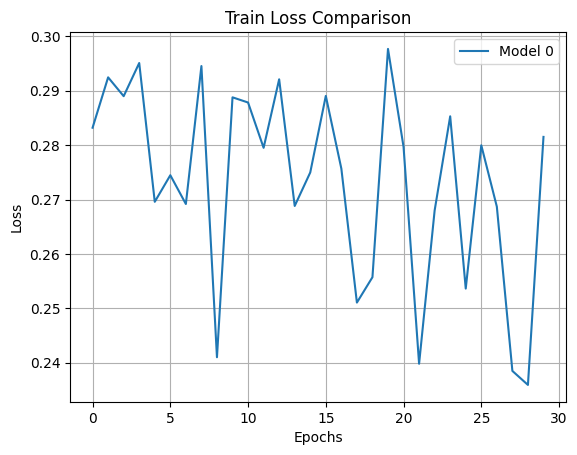

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9931
Mean IoU: 0.8892
Mean Dice Score: 0.9159


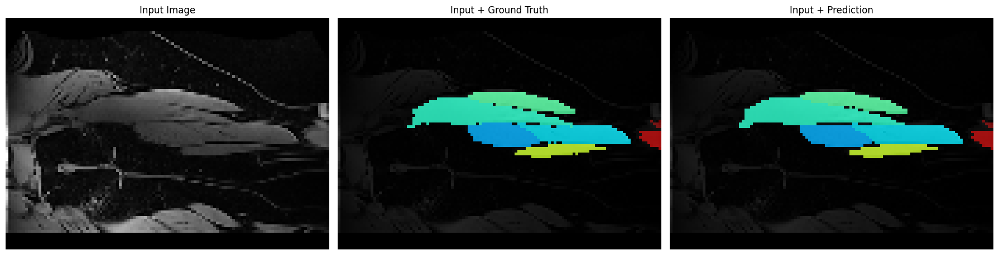

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9837
Mean IoU: 0.7085
Mean Dice Score: 0.7558


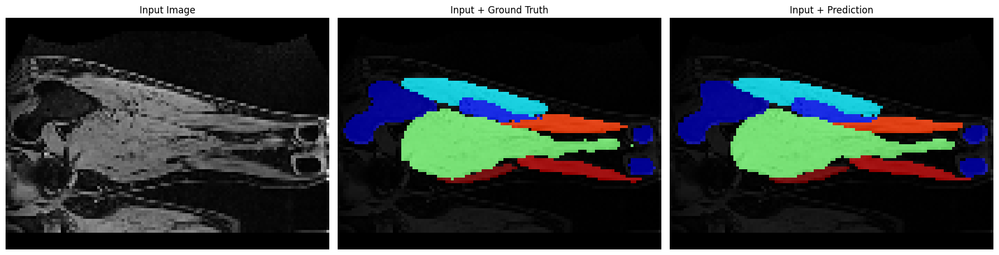

---------------------------------
Nombre de réentrainnement : 8/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2827, Valid Loss: 1.1545
Saved best model at epoch 1 with validation loss: 1.1545
Epoch 2/30: Train Loss: 0.2447, Valid Loss: 0.4622
Saved best model at epoch 2 with validation loss: 0.4622
Epoch 3/30: Train Loss: 0.2825, Valid Loss: 0.6761
Epoch 4/30: Train Loss: 0.2659, Valid Loss: 0.4585
Saved best model at epoch 4 with validation loss: 0.4585
Epoch 5/30: Train Loss: 0.2587, Valid Loss: 0.3727
Saved best model at epoch 5 with validation loss: 0.3727
Epoch 6/30: Train Loss: 0.2976, Valid Loss: 0.4758
Epoch 7/30: Train Loss: 0.2624, Valid Loss: 0.4149
Epoch 8/30: Train Loss: 0.2776, Valid Loss: 0.4445
Epoch 9/30: Train Loss: 0.2950, Valid Loss: 0.4199
Epoch 10/30: Train Loss: 0.2591, Valid Loss: 0.4075
Epoch 11/30: Train Loss: 0.2679, Valid Loss: 0.4316
Epoch 12/30: Train Loss: 0.2761, Valid Loss: 0.3970
Epoch 13/30: Train Loss: 0.2499, Valid Loss: 0.4036
Epoch 14/30: Train Loss: 0.2521, Valid Loss: 0.4266
Epoch 15/30: Train Loss: 0.2978, Valid Loss: 0.4481
E

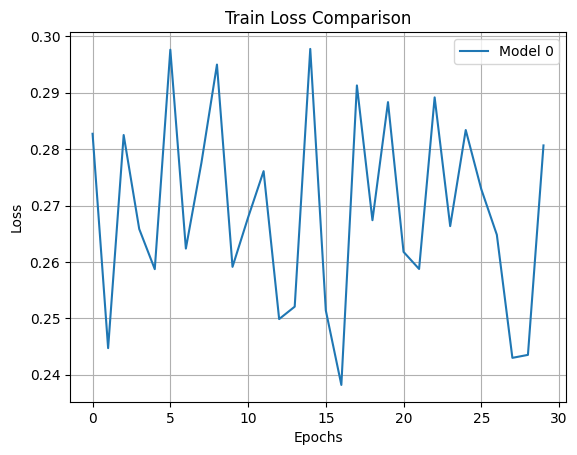

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9936
Mean IoU: 0.8887
Mean Dice Score: 0.9125


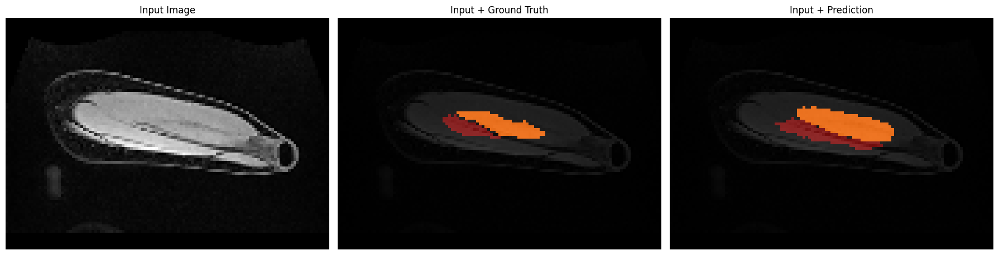

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9837
Mean IoU: 0.7303
Mean Dice Score: 0.7774


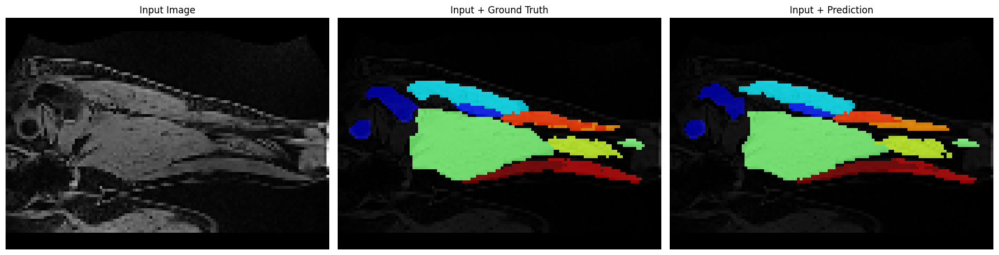

---------------------------------
Nombre de réentrainnement : 9/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2698, Valid Loss: 0.8411
Saved best model at epoch 1 with validation loss: 0.8411
Epoch 2/30: Train Loss: 0.2699, Valid Loss: 0.6695
Saved best model at epoch 2 with validation loss: 0.6695
Epoch 3/30: Train Loss: 0.2574, Valid Loss: 0.5783
Saved best model at epoch 3 with validation loss: 0.5783
Epoch 4/30: Train Loss: 0.2660, Valid Loss: 0.4844
Saved best model at epoch 4 with validation loss: 0.4844
Epoch 5/30: Train Loss: 0.2677, Valid Loss: 0.3751
Saved best model at epoch 5 with validation loss: 0.3751
Epoch 6/30: Train Loss: 0.2904, Valid Loss: 0.4384
Epoch 7/30: Train Loss: 0.2561, Valid Loss: 0.3896
Epoch 8/30: Train Loss: 0.2387, Valid Loss: 0.4431
Epoch 9/30: Train Loss: 0.2599, Valid Loss: 0.3690
Saved best model at epoch 9 with validation loss: 0.3690
Epoch 10/30: Train Loss: 0.2690, Valid Loss: 0.4218
Epoch 11/30: Train Loss: 0.2584, Valid Loss: 0.3882
Epoch 12/30: Train Loss: 0.3095, Valid Loss: 0.4416
Epoch 13/30: Train Loss: 0.2986, Valid Loss

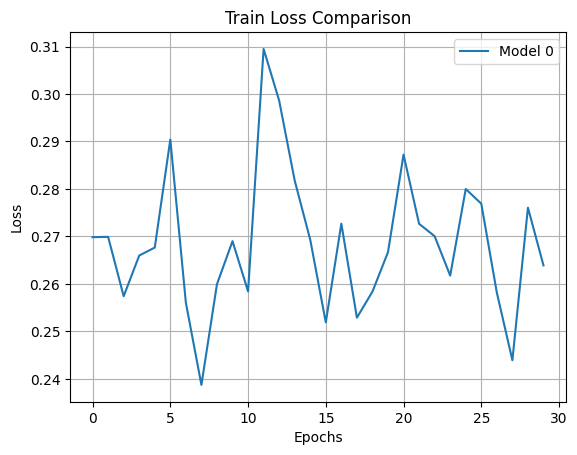

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9934
Mean IoU: 0.8880
Mean Dice Score: 0.9124


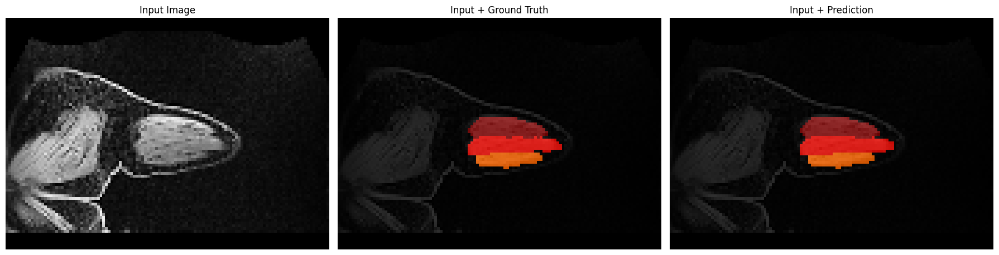

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9826
Mean IoU: 0.6865
Mean Dice Score: 0.7338


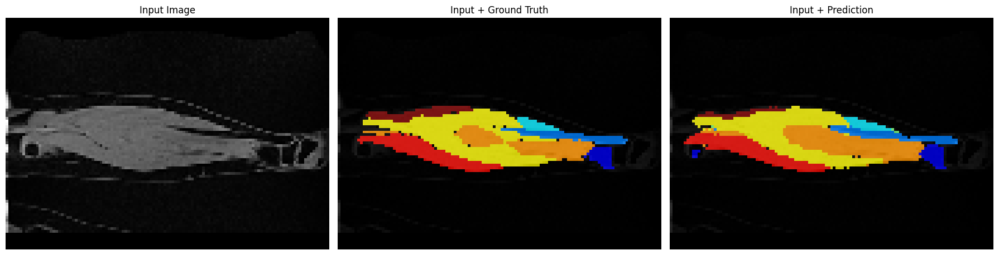

---------------------------------
Nombre de réentrainnement : 10/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2547, Valid Loss: 0.6972
Saved best model at epoch 1 with validation loss: 0.6972
Epoch 2/30: Train Loss: 0.2853, Valid Loss: 0.4195
Saved best model at epoch 2 with validation loss: 0.4195
Epoch 3/30: Train Loss: 0.2626, Valid Loss: 0.3830
Saved best model at epoch 3 with validation loss: 0.3830
Epoch 4/30: Train Loss: 0.2649, Valid Loss: 0.3939
Epoch 5/30: Train Loss: 0.2827, Valid Loss: 0.4568
Epoch 6/30: Train Loss: 0.2682, Valid Loss: 0.4456
Epoch 7/30: Train Loss: 0.2673, Valid Loss: 0.3717
Saved best model at epoch 7 with validation loss: 0.3717
Epoch 8/30: Train Loss: 0.2733, Valid Loss: 0.4425
Epoch 9/30: Train Loss: 0.2767, Valid Loss: 0.4044
Epoch 10/30: Train Loss: 0.2859, Valid Loss: 0.3940
Epoch 11/30: Train Loss: 0.2642, Valid Loss: 0.4440
Epoch 12/30: Train Loss: 0.2597, Valid Loss: 0.4548
Epoch 13/30: Train Loss: 0.2858, Valid Loss: 0.4356
Epoch 14/30: Train Loss: 0.2422, Valid Loss: 0.4044
Epoch 15/30: Train Loss: 0.2470, Valid Loss: 0.4041
E

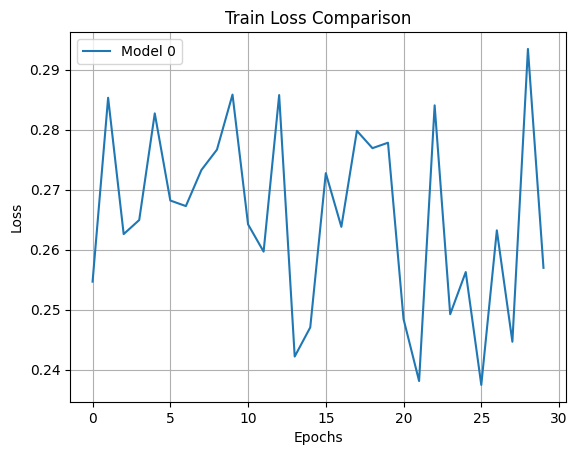

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9940
Mean IoU: 0.9018
Mean Dice Score: 0.9240


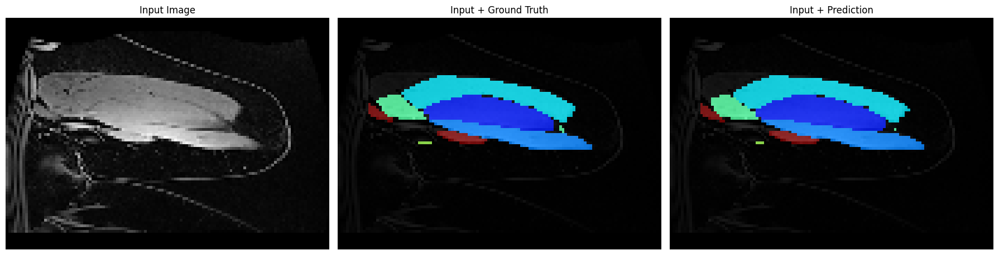

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9827
Mean IoU: 0.7031
Mean Dice Score: 0.7496


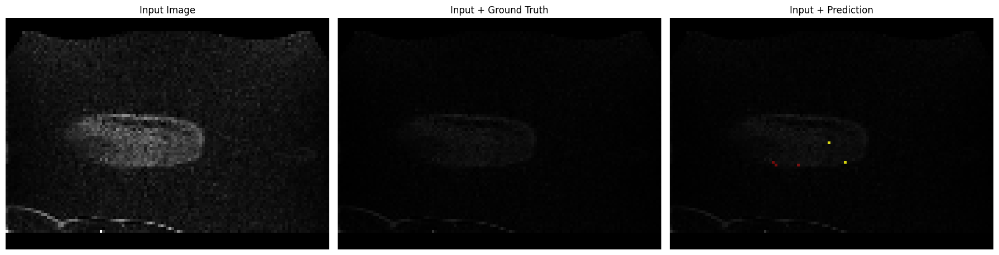

---------------------------------
Nombre de réentrainnement : 11/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2794, Valid Loss: 0.6113
Saved best model at epoch 1 with validation loss: 0.6113
Epoch 2/30: Train Loss: 0.2894, Valid Loss: 0.4734
Saved best model at epoch 2 with validation loss: 0.4734
Epoch 3/30: Train Loss: 0.2826, Valid Loss: 0.4178
Saved best model at epoch 3 with validation loss: 0.4178
Epoch 4/30: Train Loss: 0.2652, Valid Loss: 0.3797
Saved best model at epoch 4 with validation loss: 0.3797
Epoch 5/30: Train Loss: 0.2760, Valid Loss: 0.4405
Epoch 6/30: Train Loss: 0.2754, Valid Loss: 0.3948
Epoch 7/30: Train Loss: 0.3008, Valid Loss: 0.3655
Saved best model at epoch 7 with validation loss: 0.3655
Epoch 8/30: Train Loss: 0.2713, Valid Loss: 0.4307
Epoch 9/30: Train Loss: 0.2647, Valid Loss: 0.4439
Epoch 10/30: Train Loss: 0.3052, Valid Loss: 0.4014
Epoch 11/30: Train Loss: 0.2437, Valid Loss: 0.4161
Epoch 12/30: Train Loss: 0.2695, Valid Loss: 0.3750
Epoch 13/30: Train Loss: 0.2771, Valid Loss: 0.4150
Epoch 14/30: Train Loss: 0.2655, Valid Loss: 0.3

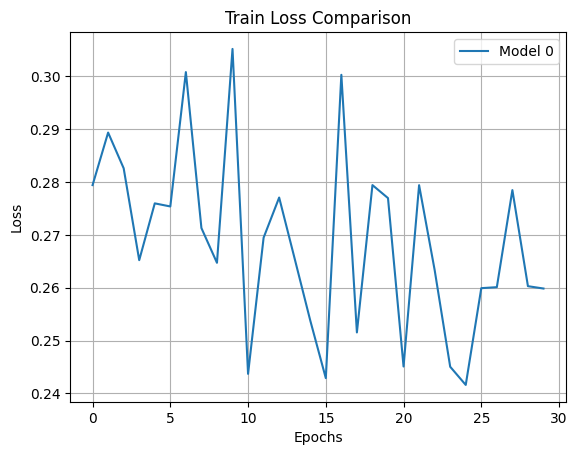

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9946
Mean IoU: 0.8994
Mean Dice Score: 0.9195


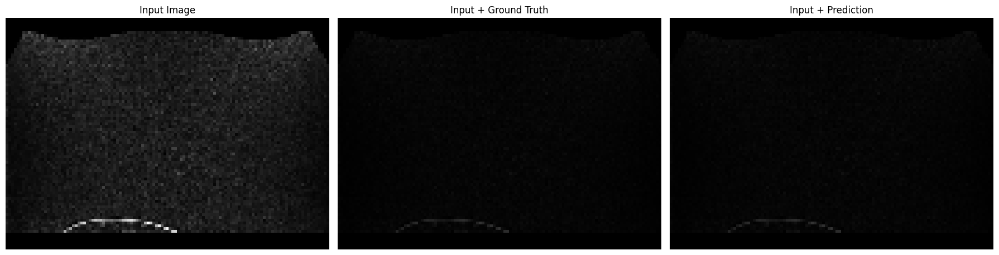

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9831
Mean IoU: 0.6969
Mean Dice Score: 0.7437


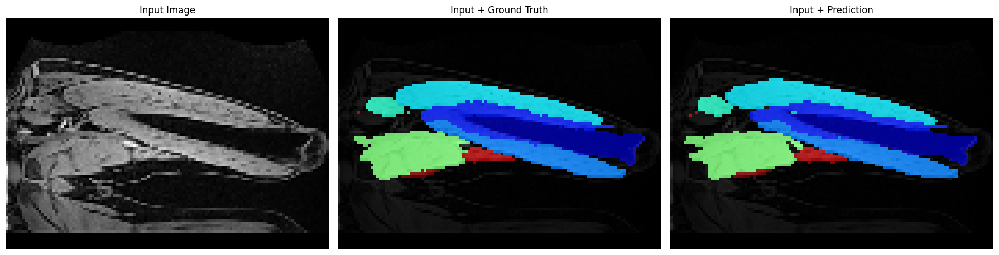

---------------------------------
Nombre de réentrainnement : 12/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2729, Valid Loss: 1.1265
Saved best model at epoch 1 with validation loss: 1.1265
Epoch 2/30: Train Loss: 0.2962, Valid Loss: 0.5134
Saved best model at epoch 2 with validation loss: 0.5134
Epoch 3/30: Train Loss: 0.2697, Valid Loss: 0.5604
Epoch 4/30: Train Loss: 0.3200, Valid Loss: 0.4441
Saved best model at epoch 4 with validation loss: 0.4441
Epoch 5/30: Train Loss: 0.2627, Valid Loss: 0.4344
Saved best model at epoch 5 with validation loss: 0.4344
Epoch 6/30: Train Loss: 0.2528, Valid Loss: 0.4406
Epoch 7/30: Train Loss: 0.3029, Valid Loss: 0.4444
Epoch 8/30: Train Loss: 0.2601, Valid Loss: 0.4297
Saved best model at epoch 8 with validation loss: 0.4297
Epoch 9/30: Train Loss: 0.2796, Valid Loss: 0.4144
Saved best model at epoch 9 with validation loss: 0.4144
Epoch 10/30: Train Loss: 0.2621, Valid Loss: 0.4204
Epoch 11/30: Train Loss: 0.2737, Valid Loss: 0.3726
Saved best model at epoch 11 with validation loss: 0.3726
Epoch 12/30: Train Loss: 0.2776, Vali

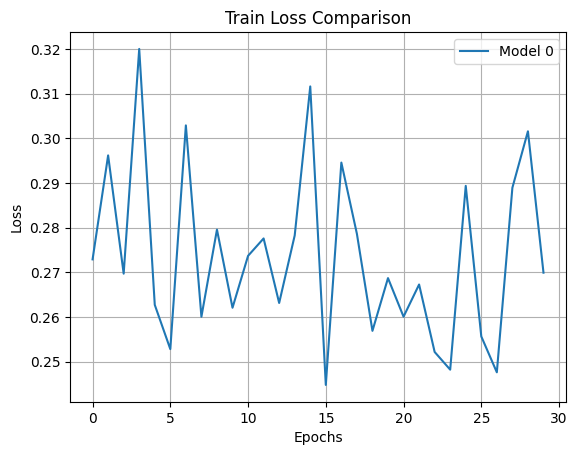

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9946
Mean IoU: 0.9135
Mean Dice Score: 0.9338


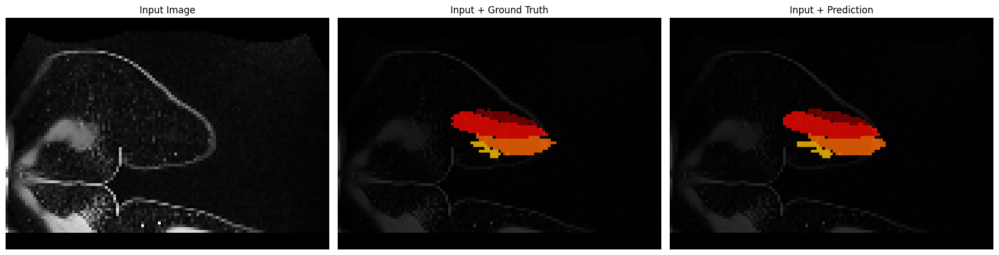

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9823
Mean IoU: 0.6835
Mean Dice Score: 0.7298


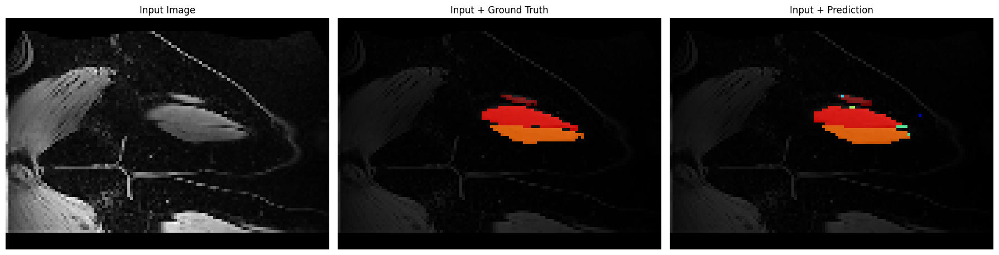

---------------------------------
Nombre de réentrainnement : 13/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2837, Valid Loss: 1.3345
Saved best model at epoch 1 with validation loss: 1.3345
Epoch 2/30: Train Loss: 0.2985, Valid Loss: 0.4838
Saved best model at epoch 2 with validation loss: 0.4838
Epoch 3/30: Train Loss: 0.2708, Valid Loss: 0.5328
Epoch 4/30: Train Loss: 0.2467, Valid Loss: 0.4751
Saved best model at epoch 4 with validation loss: 0.4751
Epoch 5/30: Train Loss: 0.2777, Valid Loss: 0.4195
Saved best model at epoch 5 with validation loss: 0.4195
Epoch 6/30: Train Loss: 0.2593, Valid Loss: 0.3730
Saved best model at epoch 6 with validation loss: 0.3730
Epoch 7/30: Train Loss: 0.2700, Valid Loss: 0.4143
Epoch 8/30: Train Loss: 0.2668, Valid Loss: 0.4162
Epoch 9/30: Train Loss: 0.2610, Valid Loss: 0.4131
Epoch 10/30: Train Loss: 0.2504, Valid Loss: 0.3914
Epoch 11/30: Train Loss: 0.2632, Valid Loss: 0.3897
Epoch 12/30: Train Loss: 0.2897, Valid Loss: 0.4406
Epoch 13/30: Train Loss: 0.2658, Valid Loss: 0.4586
Epoch 14/30: Train Loss: 0.2574, Valid Loss: 0.4

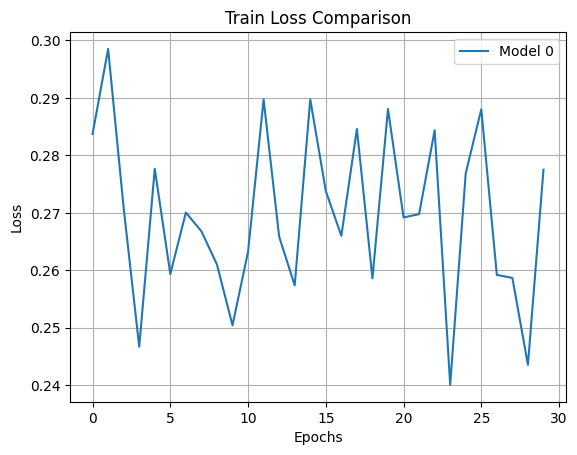

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9951
Mean IoU: 0.9176
Mean Dice Score: 0.9355


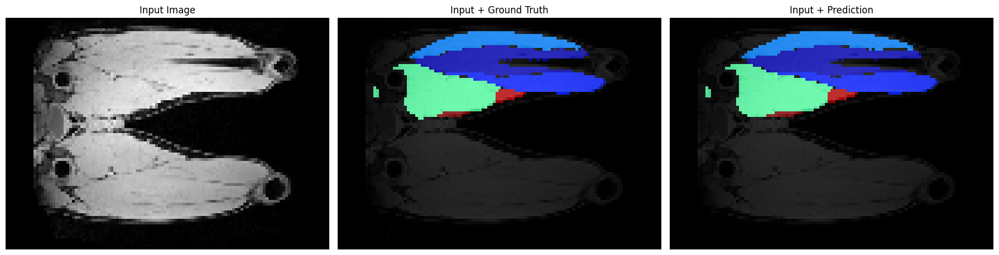

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9821
Mean IoU: 0.6837
Mean Dice Score: 0.7299


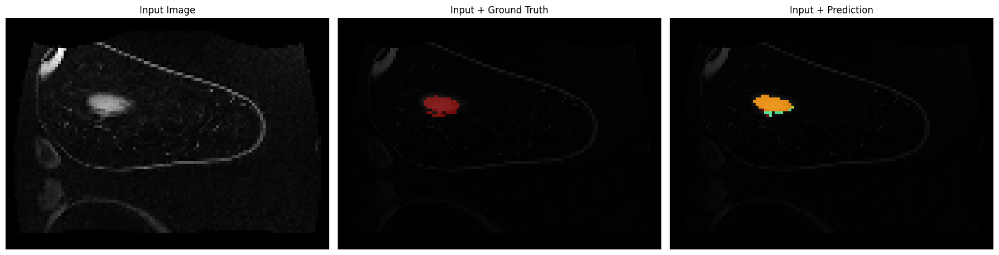

---------------------------------
Nombre de réentrainnement : 14/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2505, Valid Loss: 0.9103
Saved best model at epoch 1 with validation loss: 0.9103
Epoch 2/30: Train Loss: 0.2856, Valid Loss: 0.4994
Saved best model at epoch 2 with validation loss: 0.4994
Epoch 3/30: Train Loss: 0.2579, Valid Loss: 0.4594
Saved best model at epoch 3 with validation loss: 0.4594
Epoch 4/30: Train Loss: 0.2793, Valid Loss: 0.4583
Saved best model at epoch 4 with validation loss: 0.4583
Epoch 5/30: Train Loss: 0.2721, Valid Loss: 0.4601
Epoch 6/30: Train Loss: 0.2524, Valid Loss: 0.4600
Epoch 7/30: Train Loss: 0.2571, Valid Loss: 0.4457
Saved best model at epoch 7 with validation loss: 0.4457
Epoch 8/30: Train Loss: 0.2488, Valid Loss: 0.4292
Saved best model at epoch 8 with validation loss: 0.4292
Epoch 9/30: Train Loss: 0.2470, Valid Loss: 0.4650
Epoch 10/30: Train Loss: 0.2519, Valid Loss: 0.4294
Epoch 11/30: Train Loss: 0.2800, Valid Loss: 0.4468
Epoch 12/30: Train Loss: 0.2613, Valid Loss: 0.4476
Epoch 13/30: Train Loss: 0.2794, Valid Loss

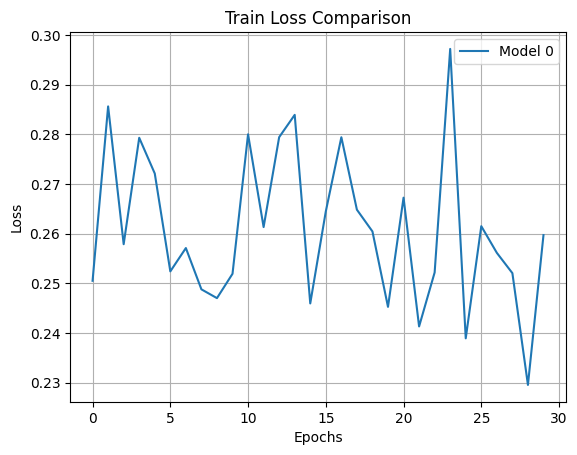

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9950
Mean IoU: 0.9243
Mean Dice Score: 0.9418


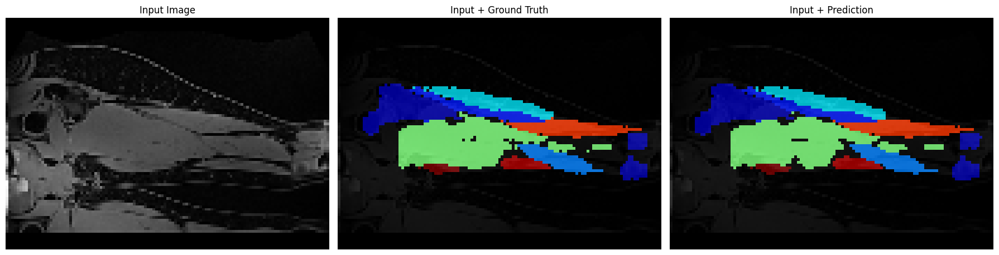

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9822
Mean IoU: 0.6712
Mean Dice Score: 0.7180


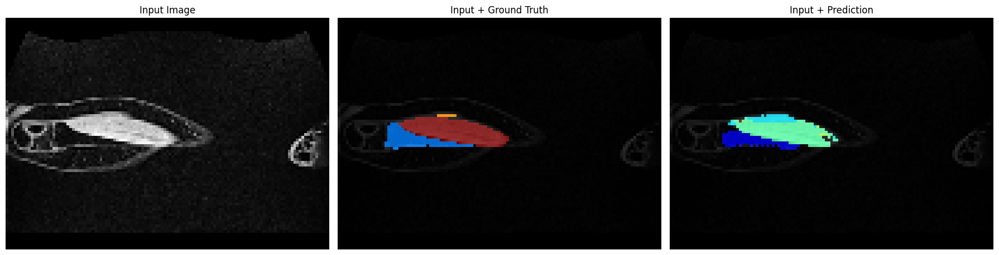

---------------------------------
Nombre de réentrainnement : 15/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.3072, Valid Loss: 0.6379
Saved best model at epoch 1 with validation loss: 0.6379
Epoch 2/30: Train Loss: 0.2805, Valid Loss: 0.4429
Saved best model at epoch 2 with validation loss: 0.4429
Epoch 3/30: Train Loss: 0.2473, Valid Loss: 0.4343
Saved best model at epoch 3 with validation loss: 0.4343
Epoch 4/30: Train Loss: 0.2319, Valid Loss: 0.4647
Epoch 5/30: Train Loss: 0.2771, Valid Loss: 0.4365
Epoch 6/30: Train Loss: 0.2767, Valid Loss: 0.4249
Saved best model at epoch 6 with validation loss: 0.4249
Epoch 7/30: Train Loss: 0.2455, Valid Loss: 0.4495
Epoch 8/30: Train Loss: 0.2701, Valid Loss: 0.4447
Epoch 9/30: Train Loss: 0.2582, Valid Loss: 0.4434
Epoch 10/30: Train Loss: 0.2651, Valid Loss: 0.4114
Saved best model at epoch 10 with validation loss: 0.4114
Epoch 11/30: Train Loss: 0.2654, Valid Loss: 0.4503
Epoch 12/30: Train Loss: 0.2368, Valid Loss: 0.4714
Epoch 13/30: Train Loss: 0.2526, Valid Loss: 0.4200
Epoch 14/30: Train Loss: 0.2490, Valid Loss: 0.

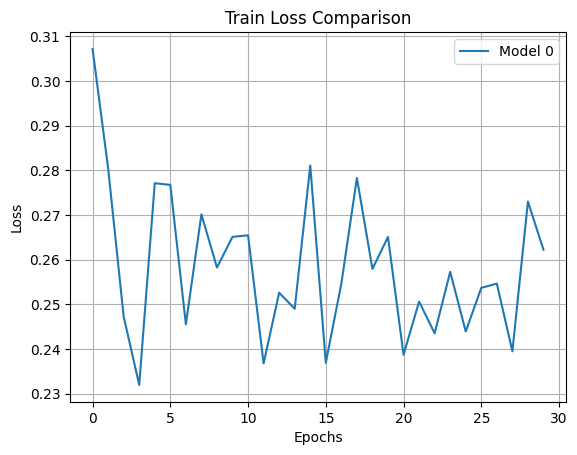

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9951
Mean IoU: 0.9240
Mean Dice Score: 0.9392


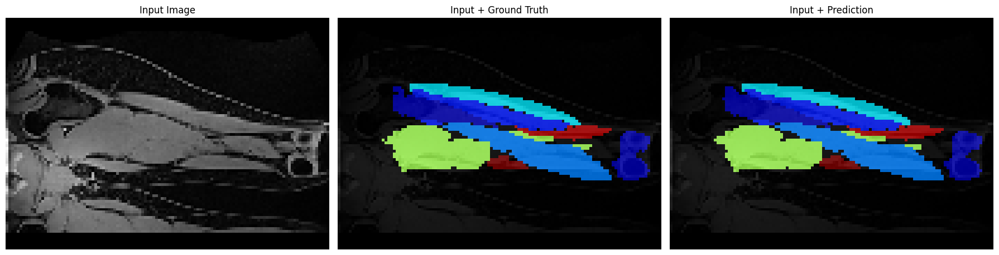

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9819
Mean IoU: 0.6619
Mean Dice Score: 0.7088


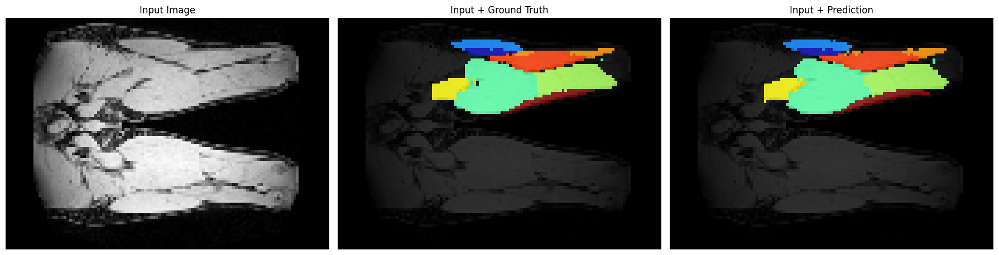

---------------------------------
Nombre de réentrainnement : 16/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2603, Valid Loss: 1.3618
Saved best model at epoch 1 with validation loss: 1.3618
Epoch 2/30: Train Loss: 0.2740, Valid Loss: 0.5201
Saved best model at epoch 2 with validation loss: 0.5201
Epoch 3/30: Train Loss: 0.2853, Valid Loss: 0.4329
Saved best model at epoch 3 with validation loss: 0.4329
Epoch 4/30: Train Loss: 0.2624, Valid Loss: 0.4718
Epoch 5/30: Train Loss: 0.2635, Valid Loss: 0.4642
Epoch 6/30: Train Loss: 0.2703, Valid Loss: 0.4319
Saved best model at epoch 6 with validation loss: 0.4319
Epoch 7/30: Train Loss: 0.2533, Valid Loss: 0.4085
Saved best model at epoch 7 with validation loss: 0.4085
Epoch 8/30: Train Loss: 0.2547, Valid Loss: 0.4274
Epoch 9/30: Train Loss: 0.2617, Valid Loss: 0.3803
Saved best model at epoch 9 with validation loss: 0.3803
Epoch 10/30: Train Loss: 0.2546, Valid Loss: 0.4284
Epoch 11/30: Train Loss: 0.2795, Valid Loss: 0.4255
Epoch 12/30: Train Loss: 0.2415, Valid Loss: 0.4421
Epoch 13/30: Train Loss: 0.2473, Valid Loss

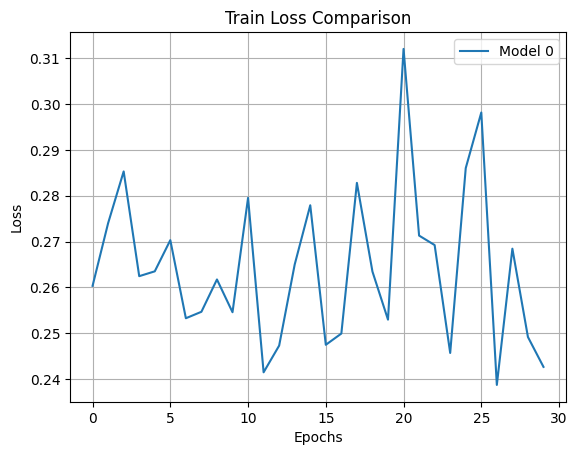

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9954
Mean IoU: 0.9209
Mean Dice Score: 0.9364


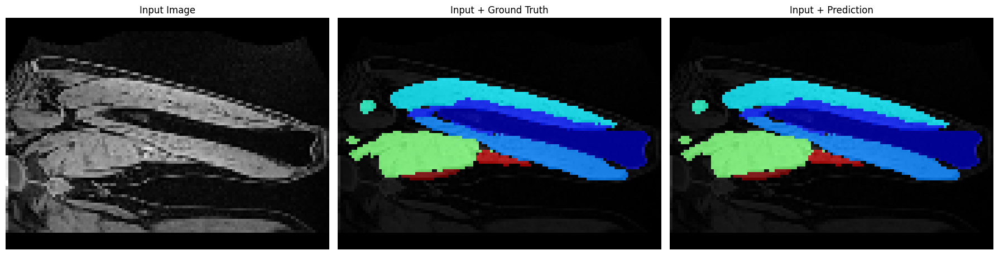

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9823
Mean IoU: 0.6955
Mean Dice Score: 0.7430


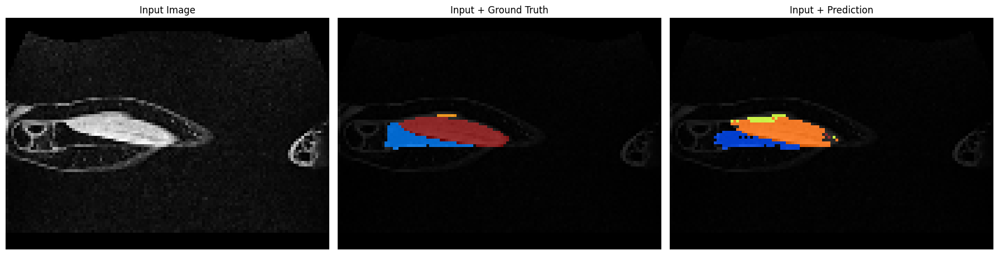

---------------------------------
Nombre de réentrainnement : 17/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2319, Valid Loss: 0.9360
Saved best model at epoch 1 with validation loss: 0.9360
Epoch 2/30: Train Loss: 0.2758, Valid Loss: 0.4399
Saved best model at epoch 2 with validation loss: 0.4399
Epoch 3/30: Train Loss: 0.2563, Valid Loss: 0.4910
Epoch 4/30: Train Loss: 0.2445, Valid Loss: 0.4408
Epoch 5/30: Train Loss: 0.2856, Valid Loss: 0.4623
Epoch 6/30: Train Loss: 0.2467, Valid Loss: 0.4677
Epoch 7/30: Train Loss: 0.2597, Valid Loss: 0.4042
Saved best model at epoch 7 with validation loss: 0.4042
Epoch 8/30: Train Loss: 0.2641, Valid Loss: 0.4893
Epoch 9/30: Train Loss: 0.2626, Valid Loss: 0.4533
Epoch 10/30: Train Loss: 0.2775, Valid Loss: 0.4749
Epoch 11/30: Train Loss: 0.2988, Valid Loss: 0.4666
Epoch 12/30: Train Loss: 0.2469, Valid Loss: 0.4440
Epoch 13/30: Train Loss: 0.2731, Valid Loss: 0.4841
Epoch 14/30: Train Loss: 0.2689, Valid Loss: 0.4616
Epoch 15/30: Train Loss: 0.2621, Valid Loss: 0.4333
Epoch 16/30: Train Loss: 0.2707, Valid Loss: 0.4284
Epoch 

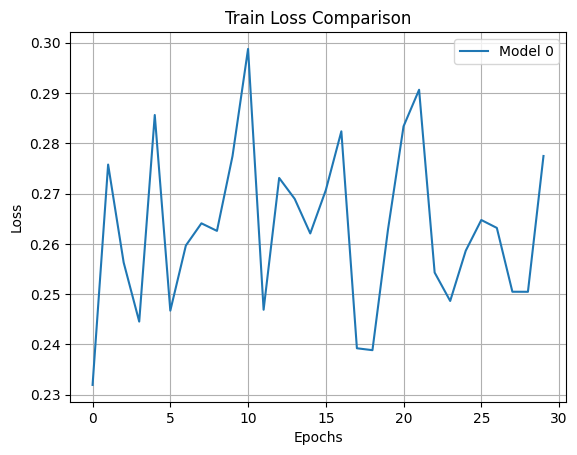

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9955
Mean IoU: 0.9327
Mean Dice Score: 0.9483


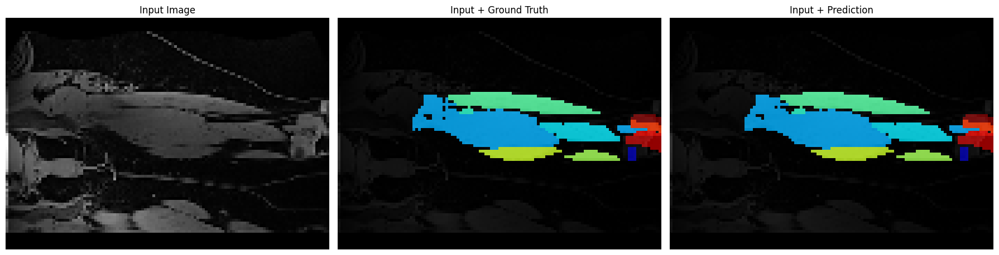

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9822
Mean IoU: 0.6798
Mean Dice Score: 0.7256


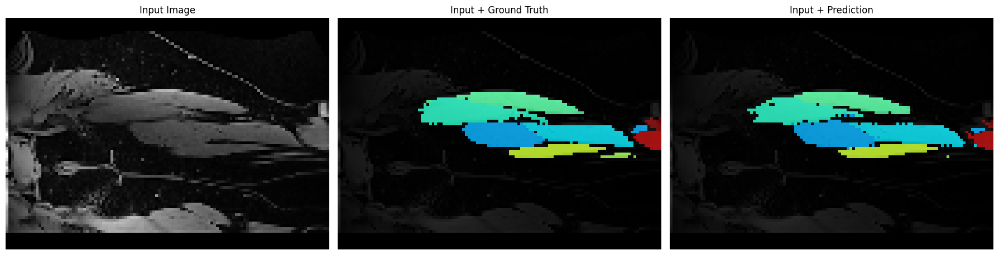

---------------------------------
Nombre de réentrainnement : 18/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2674, Valid Loss: 1.1976
Saved best model at epoch 1 with validation loss: 1.1976
Epoch 2/30: Train Loss: 0.2753, Valid Loss: 0.6391
Saved best model at epoch 2 with validation loss: 0.6391
Epoch 3/30: Train Loss: 0.2823, Valid Loss: 0.4851
Saved best model at epoch 3 with validation loss: 0.4851
Epoch 4/30: Train Loss: 0.2558, Valid Loss: 0.4957
Epoch 5/30: Train Loss: 0.2406, Valid Loss: 0.3910
Saved best model at epoch 5 with validation loss: 0.3910
Epoch 6/30: Train Loss: 0.2802, Valid Loss: 0.4391
Epoch 7/30: Train Loss: 0.2746, Valid Loss: 0.4249
Epoch 8/30: Train Loss: 0.2623, Valid Loss: 0.4418
Epoch 9/30: Train Loss: 0.2337, Valid Loss: 0.4284
Epoch 10/30: Train Loss: 0.2518, Valid Loss: 0.3749
Saved best model at epoch 10 with validation loss: 0.3749
Epoch 11/30: Train Loss: 0.2450, Valid Loss: 0.4070
Epoch 12/30: Train Loss: 0.2652, Valid Loss: 0.4206
Epoch 13/30: Train Loss: 0.2833, Valid Loss: 0.3804
Epoch 14/30: Train Loss: 0.2718, Valid Loss: 0.

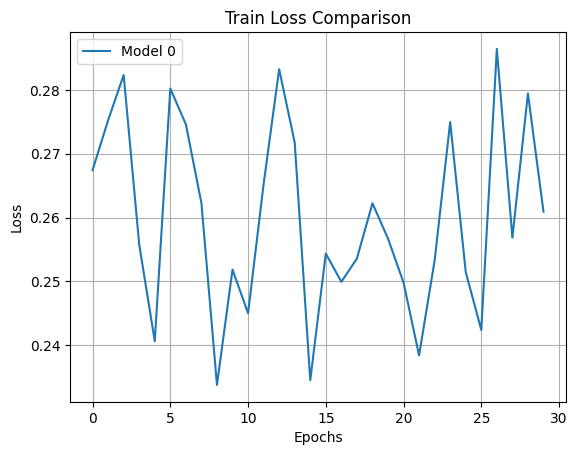

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9953
Mean IoU: 0.9230
Mean Dice Score: 0.9380


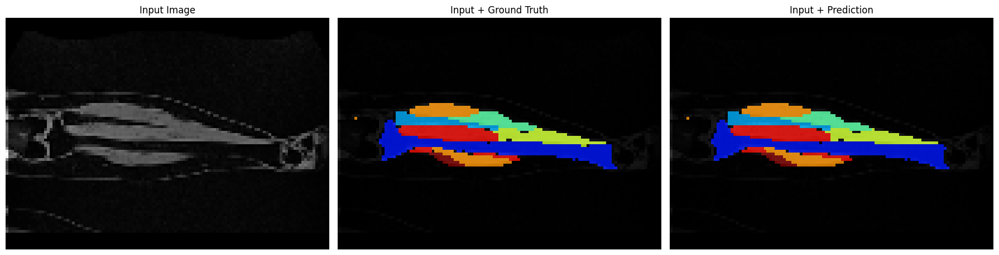

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9815
Mean IoU: 0.6547
Mean Dice Score: 0.6999


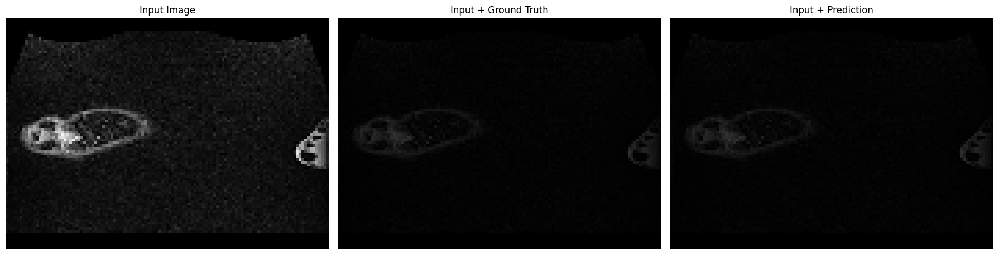

---------------------------------
Nombre de réentrainnement : 19/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2389, Valid Loss: 1.1206
Saved best model at epoch 1 with validation loss: 1.1206
Epoch 2/30: Train Loss: 0.2385, Valid Loss: 0.4745
Saved best model at epoch 2 with validation loss: 0.4745
Epoch 3/30: Train Loss: 0.2568, Valid Loss: 0.6432
Epoch 4/30: Train Loss: 0.2618, Valid Loss: 0.4253
Saved best model at epoch 4 with validation loss: 0.4253
Epoch 5/30: Train Loss: 0.2729, Valid Loss: 0.4517
Epoch 6/30: Train Loss: 0.2962, Valid Loss: 0.4320
Epoch 7/30: Train Loss: 0.2594, Valid Loss: 0.4622
Epoch 8/30: Train Loss: 0.2364, Valid Loss: 0.4611
Epoch 9/30: Train Loss: 0.2652, Valid Loss: 0.4295
Epoch 10/30: Train Loss: 0.2728, Valid Loss: 0.3898
Saved best model at epoch 10 with validation loss: 0.3898
Epoch 11/30: Train Loss: 0.2653, Valid Loss: 0.4572
Epoch 12/30: Train Loss: 0.2832, Valid Loss: 0.4622
Epoch 13/30: Train Loss: 0.2685, Valid Loss: 0.4600
Epoch 14/30: Train Loss: 0.2456, Valid Loss: 0.4358
Epoch 15/30: Train Loss: 0.2480, Valid Loss: 0.4670


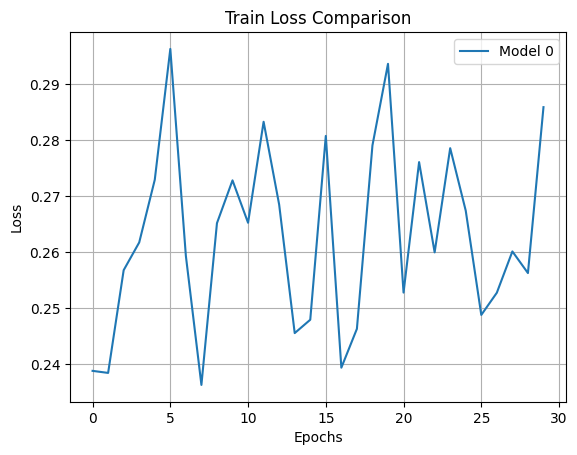

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9955
Mean IoU: 0.9204
Mean Dice Score: 0.9349


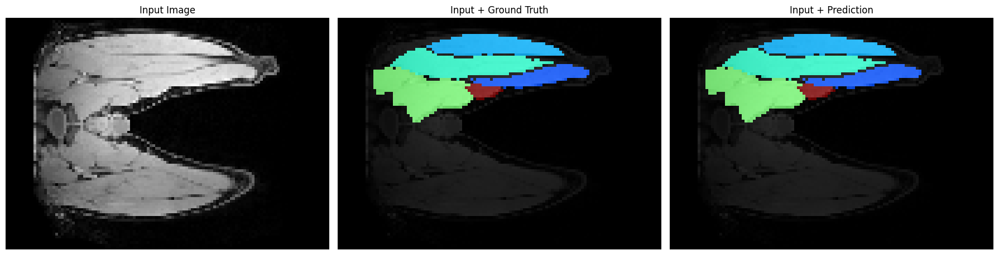

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9819
Mean IoU: 0.6778
Mean Dice Score: 0.7241


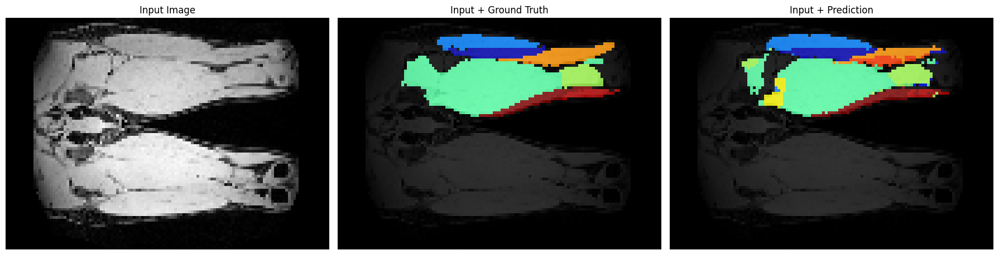

---------------------------------
Nombre de réentrainnement : 20/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2848, Valid Loss: 1.3581
Saved best model at epoch 1 with validation loss: 1.3581
Epoch 2/30: Train Loss: 0.2556, Valid Loss: 0.5982
Saved best model at epoch 2 with validation loss: 0.5982
Epoch 3/30: Train Loss: 0.2676, Valid Loss: 0.4848
Saved best model at epoch 3 with validation loss: 0.4848
Epoch 4/30: Train Loss: 0.2566, Valid Loss: 0.4750
Saved best model at epoch 4 with validation loss: 0.4750
Epoch 5/30: Train Loss: 0.2793, Valid Loss: 0.4584
Saved best model at epoch 5 with validation loss: 0.4584
Epoch 6/30: Train Loss: 0.2614, Valid Loss: 0.4587
Epoch 7/30: Train Loss: 0.2804, Valid Loss: 0.4805
Epoch 8/30: Train Loss: 0.2702, Valid Loss: 0.4762
Epoch 9/30: Train Loss: 0.2823, Valid Loss: 0.4755
Epoch 10/30: Train Loss: 0.2348, Valid Loss: 0.4648
Epoch 11/30: Train Loss: 0.2504, Valid Loss: 0.4723
Epoch 12/30: Train Loss: 0.2741, Valid Loss: 0.4805
Epoch 13/30: Train Loss: 0.2440, Valid Loss: 0.4788
Epoch 14/30: Train Loss: 0.2461, Valid Loss: 0.3

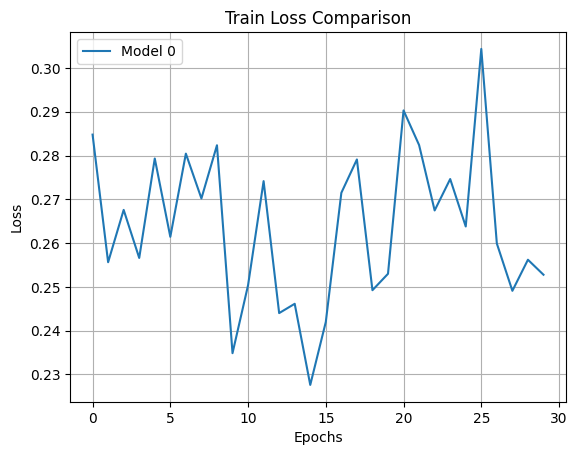

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9955
Mean IoU: 0.9215
Mean Dice Score: 0.9346


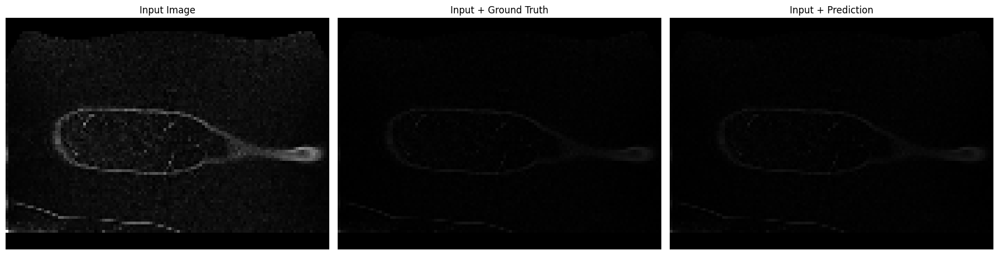

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9814
Mean IoU: 0.6705
Mean Dice Score: 0.7157


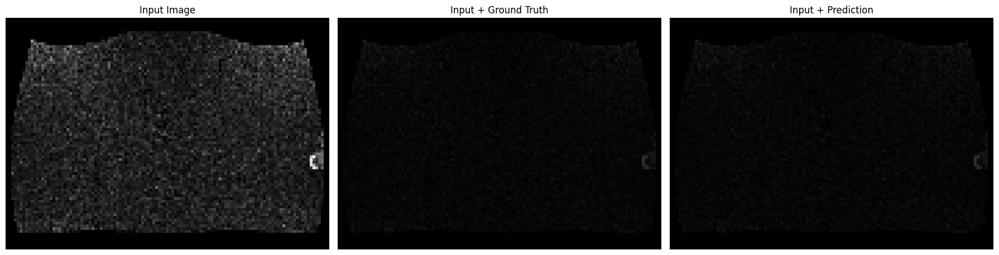

---------------------------------
Nombre de réentrainnement : 21/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2342, Valid Loss: 1.4442
Saved best model at epoch 1 with validation loss: 1.4442
Epoch 2/30: Train Loss: 0.2810, Valid Loss: 0.4220
Saved best model at epoch 2 with validation loss: 0.4220
Epoch 3/30: Train Loss: 0.2583, Valid Loss: 0.5709
Epoch 4/30: Train Loss: 0.2771, Valid Loss: 0.4305
Epoch 5/30: Train Loss: 0.2772, Valid Loss: 0.4698
Epoch 6/30: Train Loss: 0.2507, Valid Loss: 0.4636
Epoch 7/30: Train Loss: 0.2730, Valid Loss: 0.4708
Epoch 8/30: Train Loss: 0.2513, Valid Loss: 0.4290
Epoch 9/30: Train Loss: 0.2468, Valid Loss: 0.4291
Epoch 10/30: Train Loss: 0.2941, Valid Loss: 0.4457
Epoch 11/30: Train Loss: 0.2564, Valid Loss: 0.4197
Saved best model at epoch 11 with validation loss: 0.4197
Epoch 12/30: Train Loss: 0.2529, Valid Loss: 0.4272
Epoch 13/30: Train Loss: 0.2713, Valid Loss: 0.4548
Epoch 14/30: Train Loss: 0.2415, Valid Loss: 0.4679
Epoch 15/30: Train Loss: 0.2752, Valid Loss: 0.4266
Epoch 16/30: Train Loss: 0.2823, Valid Loss: 0.4305
Epoch

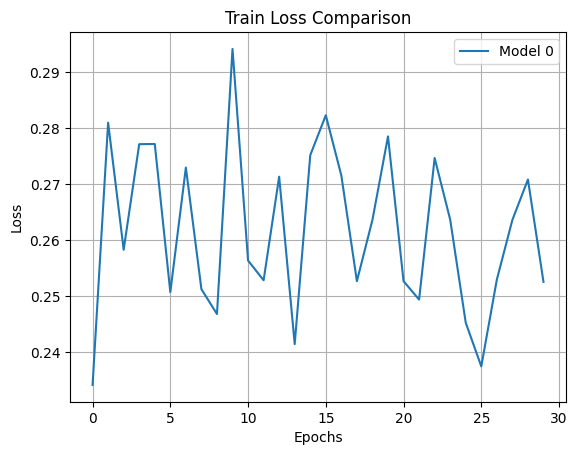

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9956
Mean IoU: 0.9356
Mean Dice Score: 0.9485


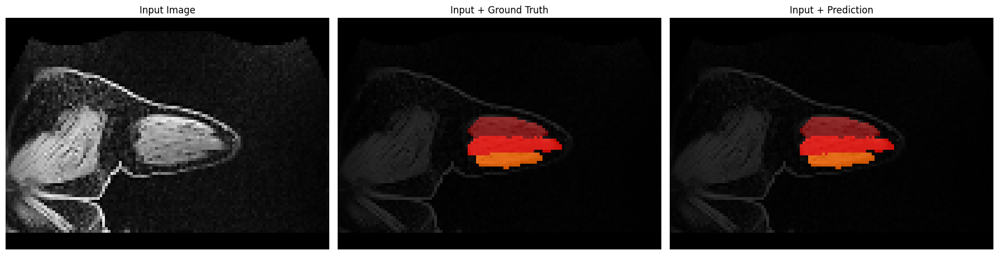

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9814
Mean IoU: 0.6527
Mean Dice Score: 0.6986


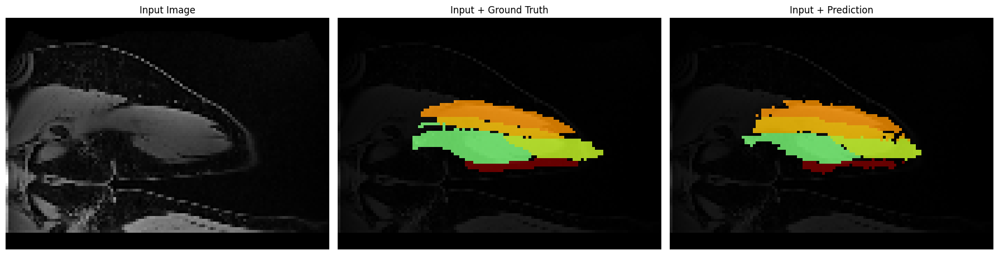

---------------------------------
Nombre de réentrainnement : 22/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2657, Valid Loss: 0.6808
Saved best model at epoch 1 with validation loss: 0.6808
Epoch 2/30: Train Loss: 0.2668, Valid Loss: 0.5145
Saved best model at epoch 2 with validation loss: 0.5145
Epoch 3/30: Train Loss: 0.2897, Valid Loss: 0.4314
Saved best model at epoch 3 with validation loss: 0.4314
Epoch 4/30: Train Loss: 0.2409, Valid Loss: 0.4521
Epoch 5/30: Train Loss: 0.2577, Valid Loss: 0.4581
Epoch 6/30: Train Loss: 0.2435, Valid Loss: 0.4674
Epoch 7/30: Train Loss: 0.2509, Valid Loss: 0.4937
Epoch 8/30: Train Loss: 0.2746, Valid Loss: 0.4695
Epoch 9/30: Train Loss: 0.2885, Valid Loss: 0.4367
Epoch 10/30: Train Loss: 0.2871, Valid Loss: 0.4551
Epoch 11/30: Train Loss: 0.2681, Valid Loss: 0.4663
Epoch 12/30: Train Loss: 0.2533, Valid Loss: 0.3926
Saved best model at epoch 12 with validation loss: 0.3926
Epoch 13/30: Train Loss: 0.2417, Valid Loss: 0.4409
Epoch 14/30: Train Loss: 0.2788, Valid Loss: 0.4440
Epoch 15/30: Train Loss: 0.2752, Valid Loss: 0.4756


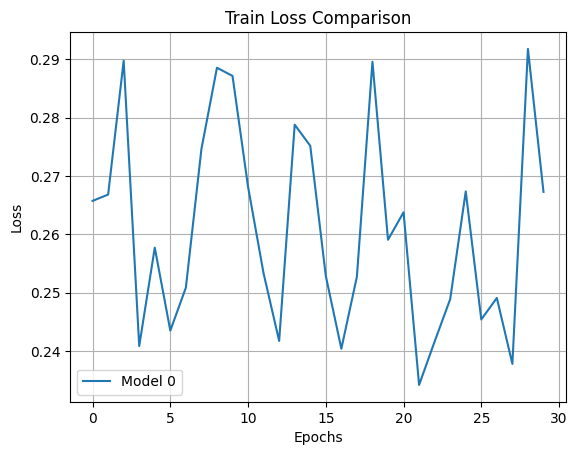

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9956
Mean IoU: 0.9283
Mean Dice Score: 0.9409


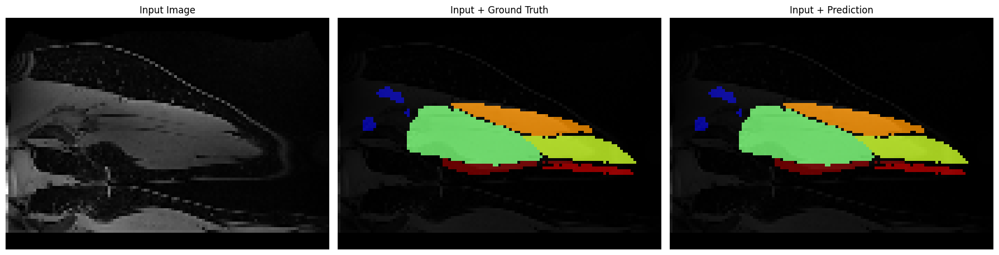

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9810
Mean IoU: 0.6685
Mean Dice Score: 0.7134


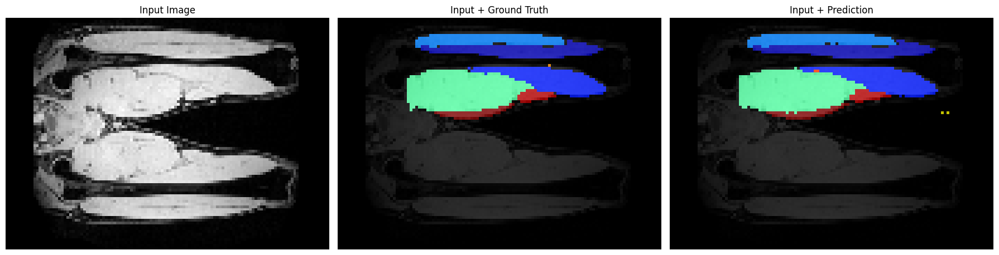

---------------------------------
Nombre de réentrainnement : 23/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2557, Valid Loss: 1.0101
Saved best model at epoch 1 with validation loss: 1.0101
Epoch 2/30: Train Loss: 0.2712, Valid Loss: 0.4322
Saved best model at epoch 2 with validation loss: 0.4322
Epoch 3/30: Train Loss: 0.2532, Valid Loss: 0.4705
Epoch 4/30: Train Loss: 0.2527, Valid Loss: 0.4434
Epoch 5/30: Train Loss: 0.3039, Valid Loss: 0.4400
Epoch 6/30: Train Loss: 0.2492, Valid Loss: 0.4281
Saved best model at epoch 6 with validation loss: 0.4281
Epoch 7/30: Train Loss: 0.2530, Valid Loss: 0.4218
Saved best model at epoch 7 with validation loss: 0.4218
Epoch 8/30: Train Loss: 0.2302, Valid Loss: 0.4488
Epoch 9/30: Train Loss: 0.2705, Valid Loss: 0.4628
Epoch 10/30: Train Loss: 0.2835, Valid Loss: 0.4483
Epoch 11/30: Train Loss: 0.2523, Valid Loss: 0.4334
Epoch 12/30: Train Loss: 0.2570, Valid Loss: 0.4411
Epoch 13/30: Train Loss: 0.2735, Valid Loss: 0.4805
Epoch 14/30: Train Loss: 0.2541, Valid Loss: 0.4744
Epoch 15/30: Train Loss: 0.2542, Valid Loss: 0.3970
S

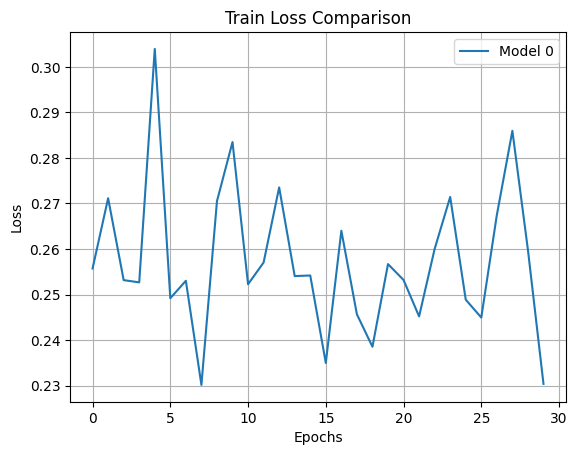

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9957
Mean IoU: 0.9252
Mean Dice Score: 0.9382


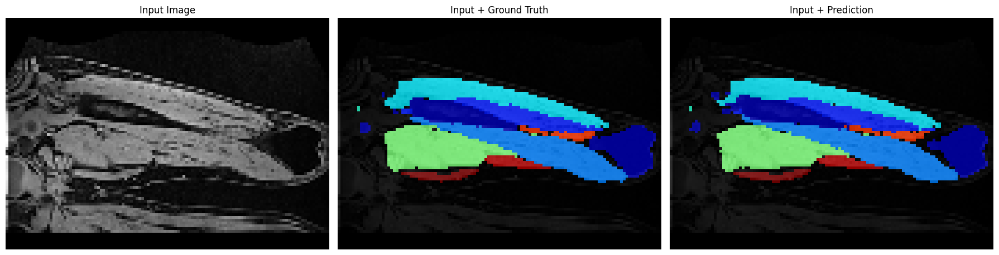

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9802
Mean IoU: 0.6435
Mean Dice Score: 0.6885


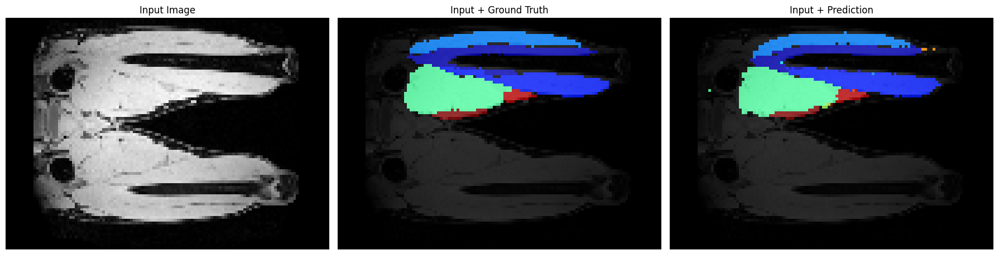

---------------------------------
Nombre de réentrainnement : 24/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2257, Valid Loss: 1.6632
Saved best model at epoch 1 with validation loss: 1.6632
Epoch 2/30: Train Loss: 0.2598, Valid Loss: 0.5633
Saved best model at epoch 2 with validation loss: 0.5633
Epoch 3/30: Train Loss: 0.2608, Valid Loss: 0.4296
Saved best model at epoch 3 with validation loss: 0.4296
Epoch 4/30: Train Loss: 0.2642, Valid Loss: 0.4238
Saved best model at epoch 4 with validation loss: 0.4238
Epoch 5/30: Train Loss: 0.2964, Valid Loss: 0.4814
Epoch 6/30: Train Loss: 0.2324, Valid Loss: 0.4663
Epoch 7/30: Train Loss: 0.2690, Valid Loss: 0.4565
Epoch 8/30: Train Loss: 0.2747, Valid Loss: 0.4443
Epoch 9/30: Train Loss: 0.2473, Valid Loss: 0.4456
Epoch 10/30: Train Loss: 0.2769, Valid Loss: 0.4124
Saved best model at epoch 10 with validation loss: 0.4124
Epoch 11/30: Train Loss: 0.2628, Valid Loss: 0.4768
Epoch 12/30: Train Loss: 0.2624, Valid Loss: 0.4309
Epoch 13/30: Train Loss: 0.2843, Valid Loss: 0.4706
Epoch 14/30: Train Loss: 0.2612, Valid Loss: 0.

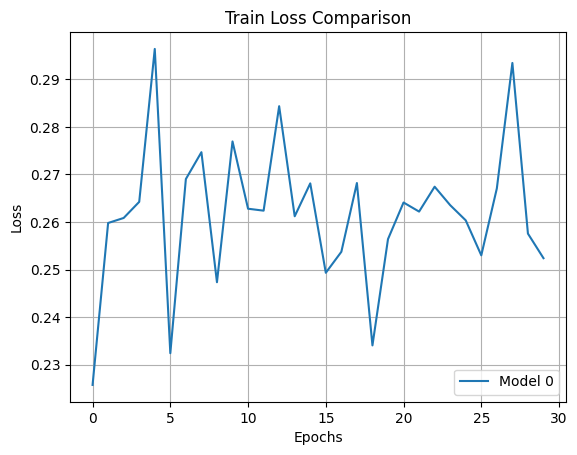

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9957
Mean IoU: 0.9282
Mean Dice Score: 0.9401


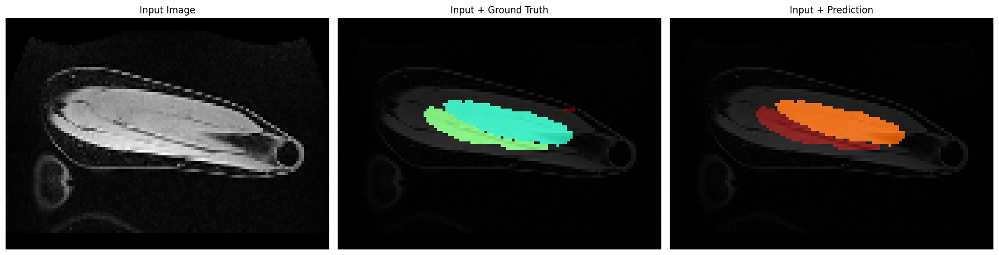

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9806
Mean IoU: 0.6692
Mean Dice Score: 0.7144


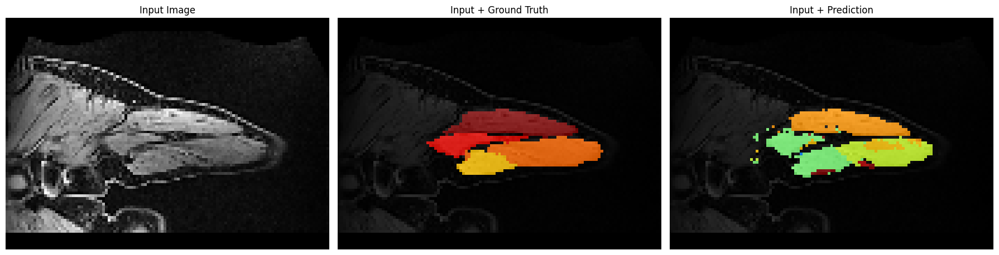

---------------------------------
Nombre de réentrainnement : 25/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2662, Valid Loss: 0.7300
Saved best model at epoch 1 with validation loss: 0.7300
Epoch 2/30: Train Loss: 0.2320, Valid Loss: 0.5864
Saved best model at epoch 2 with validation loss: 0.5864
Epoch 3/30: Train Loss: 0.2534, Valid Loss: 0.4679
Saved best model at epoch 3 with validation loss: 0.4679
Epoch 4/30: Train Loss: 0.2442, Valid Loss: 0.4540
Saved best model at epoch 4 with validation loss: 0.4540
Epoch 5/30: Train Loss: 0.2455, Valid Loss: 0.4890
Epoch 6/30: Train Loss: 0.2605, Valid Loss: 0.4060
Saved best model at epoch 6 with validation loss: 0.4060
Epoch 7/30: Train Loss: 0.2560, Valid Loss: 0.4593
Epoch 8/30: Train Loss: 0.2623, Valid Loss: 0.4034
Saved best model at epoch 8 with validation loss: 0.4034
Epoch 9/30: Train Loss: 0.2796, Valid Loss: 0.4658
Epoch 10/30: Train Loss: 0.2824, Valid Loss: 0.4955
Epoch 11/30: Train Loss: 0.2717, Valid Loss: 0.4711
Epoch 12/30: Train Loss: 0.2860, Valid Loss: 0.4605
Epoch 13/30: Train Loss: 0.2418, Valid Loss

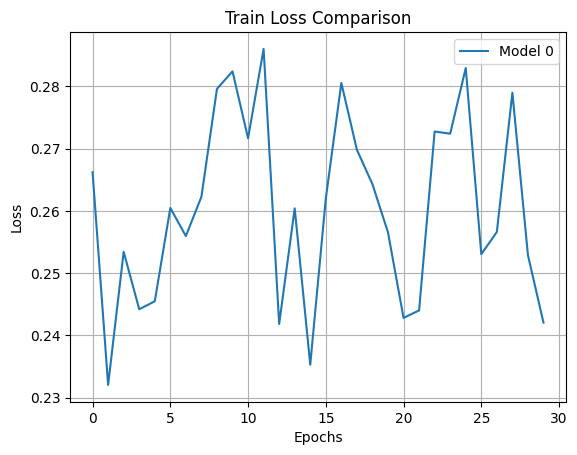

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9956
Mean IoU: 0.9274
Mean Dice Score: 0.9392


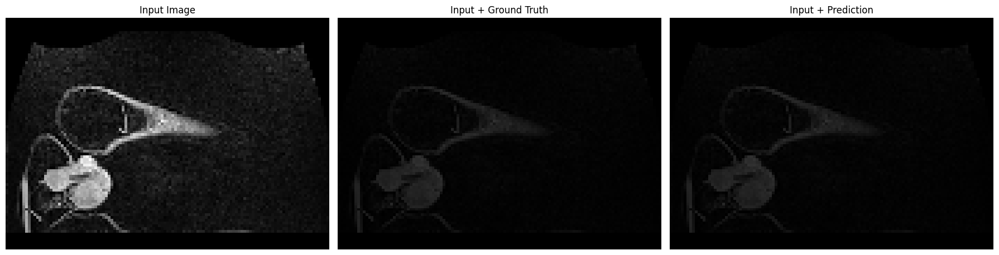

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9802
Mean IoU: 0.6545
Mean Dice Score: 0.6992


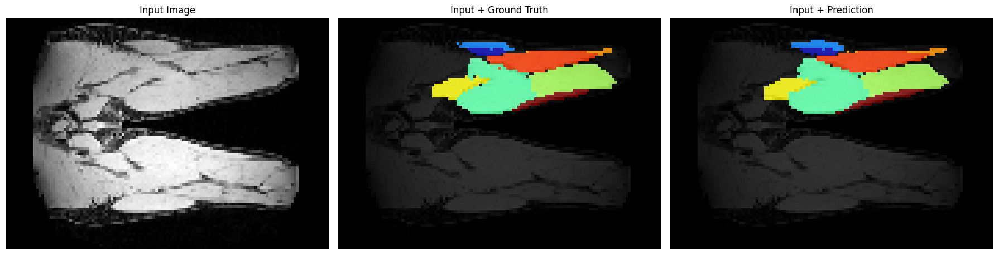

---------------------------------
Nombre de réentrainnement : 26/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2475, Valid Loss: 1.7452
Saved best model at epoch 1 with validation loss: 1.7452
Epoch 2/30: Train Loss: 0.2672, Valid Loss: 0.5413
Saved best model at epoch 2 with validation loss: 0.5413
Epoch 3/30: Train Loss: 0.2843, Valid Loss: 0.5668
Epoch 4/30: Train Loss: 0.2613, Valid Loss: 0.5008
Saved best model at epoch 4 with validation loss: 0.5008
Epoch 5/30: Train Loss: 0.2612, Valid Loss: 0.4724
Saved best model at epoch 5 with validation loss: 0.4724
Epoch 6/30: Train Loss: 0.2723, Valid Loss: 0.4527
Saved best model at epoch 6 with validation loss: 0.4527
Epoch 7/30: Train Loss: 0.2464, Valid Loss: 0.4748
Epoch 8/30: Train Loss: 0.2680, Valid Loss: 0.4413
Saved best model at epoch 8 with validation loss: 0.4413
Epoch 9/30: Train Loss: 0.2940, Valid Loss: 0.4634
Epoch 10/30: Train Loss: 0.2648, Valid Loss: 0.4561
Epoch 11/30: Train Loss: 0.2686, Valid Loss: 0.4750
Epoch 12/30: Train Loss: 0.2574, Valid Loss: 0.4606
Epoch 13/30: Train Loss: 0.2537, Valid Loss

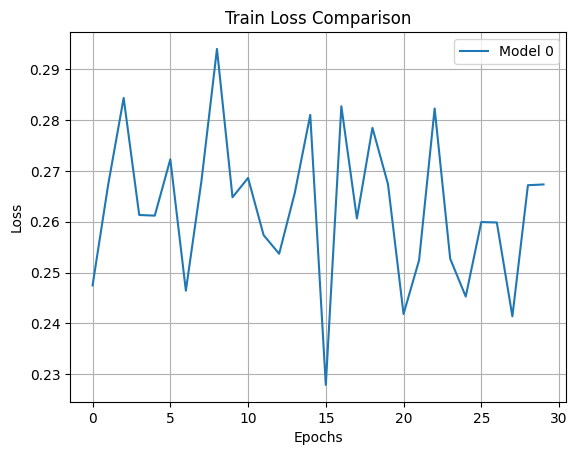

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9957
Mean IoU: 0.9277
Mean Dice Score: 0.9405


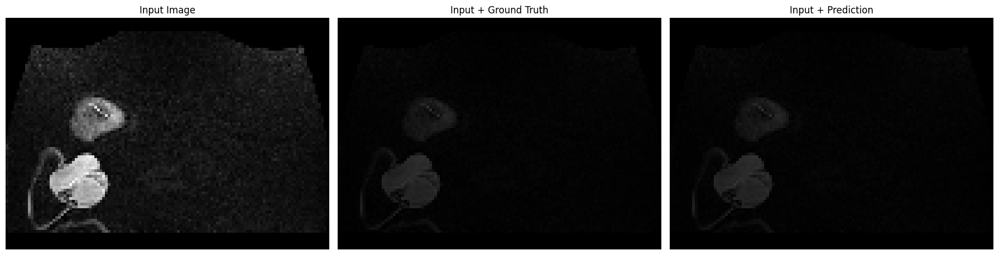

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9809
Mean IoU: 0.6437
Mean Dice Score: 0.6879


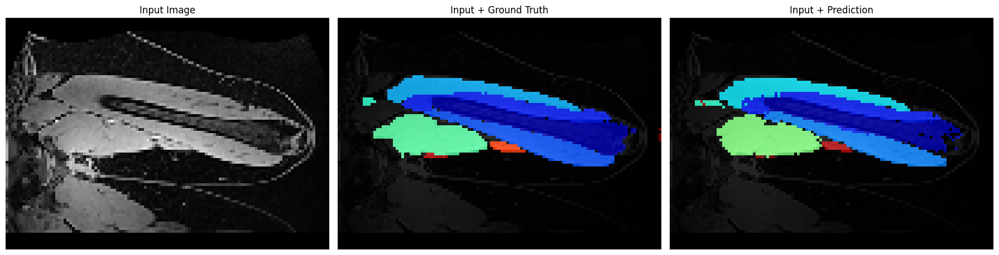

---------------------------------
Nombre de réentrainnement : 27/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2909, Valid Loss: 0.5512
Saved best model at epoch 1 with validation loss: 0.5512
Epoch 2/30: Train Loss: 0.2520, Valid Loss: 0.4746
Saved best model at epoch 2 with validation loss: 0.4746
Epoch 3/30: Train Loss: 0.2587, Valid Loss: 0.4492
Saved best model at epoch 3 with validation loss: 0.4492
Epoch 4/30: Train Loss: 0.2774, Valid Loss: 0.4697
Epoch 5/30: Train Loss: 0.2462, Valid Loss: 0.4412
Saved best model at epoch 5 with validation loss: 0.4412
Epoch 6/30: Train Loss: 0.2862, Valid Loss: 0.4392
Saved best model at epoch 6 with validation loss: 0.4392
Epoch 7/30: Train Loss: 0.2456, Valid Loss: 0.4510
Epoch 8/30: Train Loss: 0.2786, Valid Loss: 0.4816
Epoch 9/30: Train Loss: 0.2568, Valid Loss: 0.4027
Saved best model at epoch 9 with validation loss: 0.4027
Epoch 10/30: Train Loss: 0.2640, Valid Loss: 0.4523
Epoch 11/30: Train Loss: 0.2719, Valid Loss: 0.4565
Epoch 12/30: Train Loss: 0.2410, Valid Loss: 0.4431
Epoch 13/30: Train Loss: 0.2744, Valid Loss

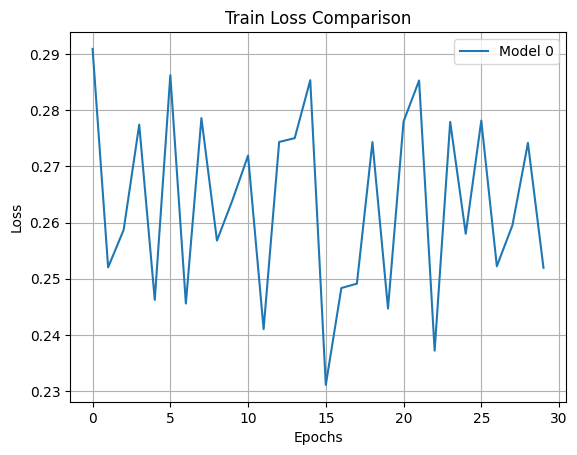

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9957
Mean IoU: 0.9377
Mean Dice Score: 0.9513


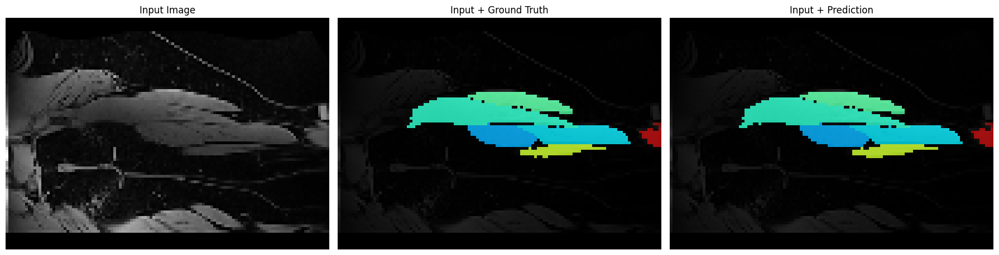

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9811
Mean IoU: 0.6381
Mean Dice Score: 0.6832


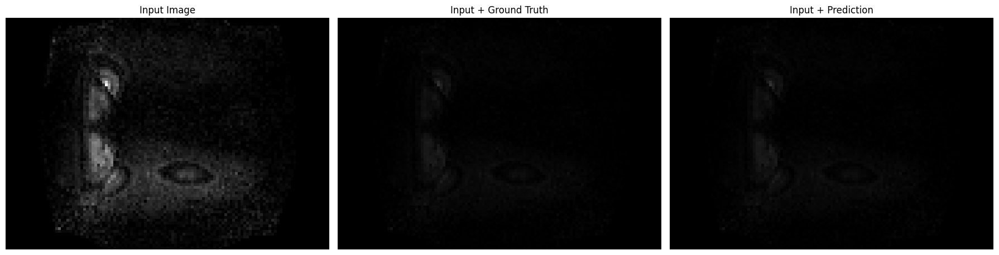

---------------------------------
Nombre de réentrainnement : 28/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2350, Valid Loss: 0.7261
Saved best model at epoch 1 with validation loss: 0.7261
Epoch 2/30: Train Loss: 0.2581, Valid Loss: 0.6104
Saved best model at epoch 2 with validation loss: 0.6104
Epoch 3/30: Train Loss: 0.2546, Valid Loss: 0.5297
Saved best model at epoch 3 with validation loss: 0.5297
Epoch 4/30: Train Loss: 0.2650, Valid Loss: 0.4833
Saved best model at epoch 4 with validation loss: 0.4833
Epoch 5/30: Train Loss: 0.2369, Valid Loss: 0.4947
Epoch 6/30: Train Loss: 0.2325, Valid Loss: 0.4532
Saved best model at epoch 6 with validation loss: 0.4532
Epoch 7/30: Train Loss: 0.2763, Valid Loss: 0.4294
Saved best model at epoch 7 with validation loss: 0.4294
Epoch 8/30: Train Loss: 0.2535, Valid Loss: 0.4834
Epoch 9/30: Train Loss: 0.2459, Valid Loss: 0.5049
Epoch 10/30: Train Loss: 0.2637, Valid Loss: 0.4723
Epoch 11/30: Train Loss: 0.2606, Valid Loss: 0.4867
Epoch 12/30: Train Loss: 0.2717, Valid Loss: 0.4493
Epoch 13/30: Train Loss: 0.2682, Valid Loss

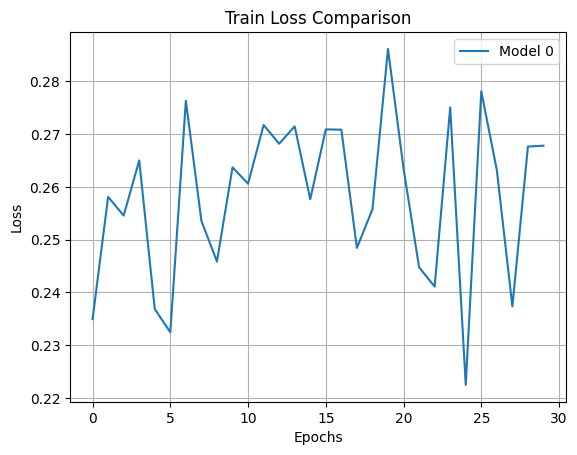

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9956
Mean IoU: 0.9386
Mean Dice Score: 0.9504


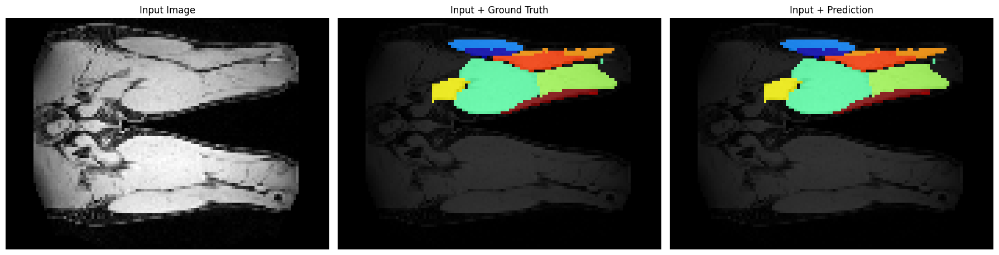

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9809
Mean IoU: 0.6434
Mean Dice Score: 0.6879


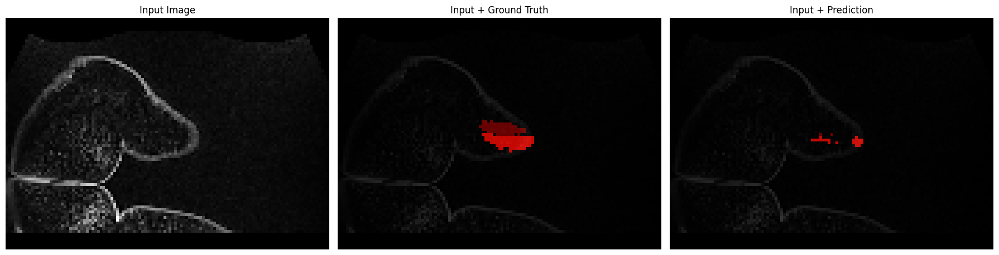

---------------------------------
Nombre de réentrainnement : 29/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2458, Valid Loss: 1.0598
Saved best model at epoch 1 with validation loss: 1.0598
Epoch 2/30: Train Loss: 0.2361, Valid Loss: 0.6663
Saved best model at epoch 2 with validation loss: 0.6663
Epoch 3/30: Train Loss: 0.2612, Valid Loss: 0.5301
Saved best model at epoch 3 with validation loss: 0.5301
Epoch 4/30: Train Loss: 0.2794, Valid Loss: 0.5116
Saved best model at epoch 4 with validation loss: 0.5116
Epoch 5/30: Train Loss: 0.2495, Valid Loss: 0.3956
Saved best model at epoch 5 with validation loss: 0.3956
Epoch 6/30: Train Loss: 0.2646, Valid Loss: 0.4841
Epoch 7/30: Train Loss: 0.2548, Valid Loss: 0.4547
Epoch 8/30: Train Loss: 0.2485, Valid Loss: 0.4694
Epoch 9/30: Train Loss: 0.2735, Valid Loss: 0.4878
Epoch 10/30: Train Loss: 0.2511, Valid Loss: 0.4368
Epoch 11/30: Train Loss: 0.2689, Valid Loss: 0.4508
Epoch 12/30: Train Loss: 0.2608, Valid Loss: 0.4838
Epoch 13/30: Train Loss: 0.2577, Valid Loss: 0.4578
Epoch 14/30: Train Loss: 0.2451, Valid Loss: 0.4

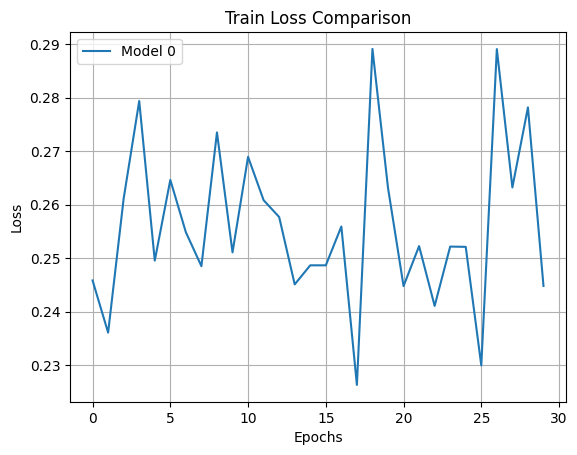

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9956
Mean IoU: 0.9435
Mean Dice Score: 0.9543


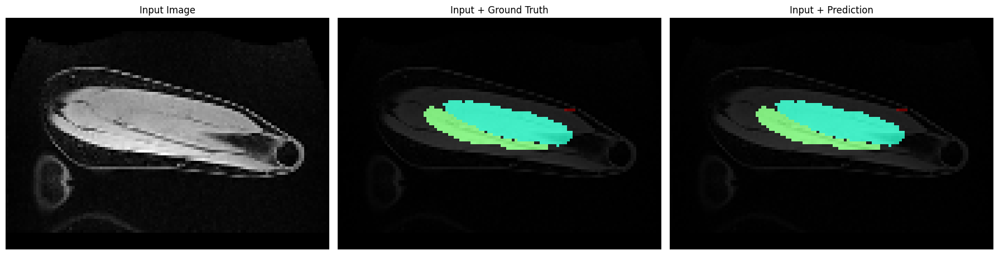

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9806
Mean IoU: 0.6318
Mean Dice Score: 0.6754


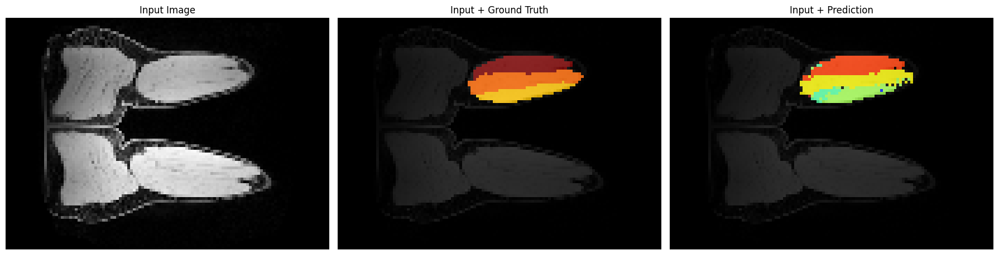

---------------------------------
Nombre de réentrainnement : 30/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2462, Valid Loss: 1.1162
Saved best model at epoch 1 with validation loss: 1.1162
Epoch 2/30: Train Loss: 0.2284, Valid Loss: 0.4943
Saved best model at epoch 2 with validation loss: 0.4943
Epoch 3/30: Train Loss: 0.2574, Valid Loss: 0.4927
Saved best model at epoch 3 with validation loss: 0.4927
Epoch 4/30: Train Loss: 0.2571, Valid Loss: 0.4469
Saved best model at epoch 4 with validation loss: 0.4469
Epoch 5/30: Train Loss: 0.2427, Valid Loss: 0.5333
Epoch 6/30: Train Loss: 0.2536, Valid Loss: 0.4822
Epoch 7/30: Train Loss: 0.2866, Valid Loss: 0.4297
Saved best model at epoch 7 with validation loss: 0.4297
Epoch 8/30: Train Loss: 0.2899, Valid Loss: 0.4514
Epoch 9/30: Train Loss: 0.2747, Valid Loss: 0.4849
Epoch 10/30: Train Loss: 0.2819, Valid Loss: 0.4778
Epoch 11/30: Train Loss: 0.2595, Valid Loss: 0.5001
Epoch 12/30: Train Loss: 0.2559, Valid Loss: 0.4854
Epoch 13/30: Train Loss: 0.2409, Valid Loss: 0.4705
Epoch 14/30: Train Loss: 0.2335, Valid Loss: 0.4

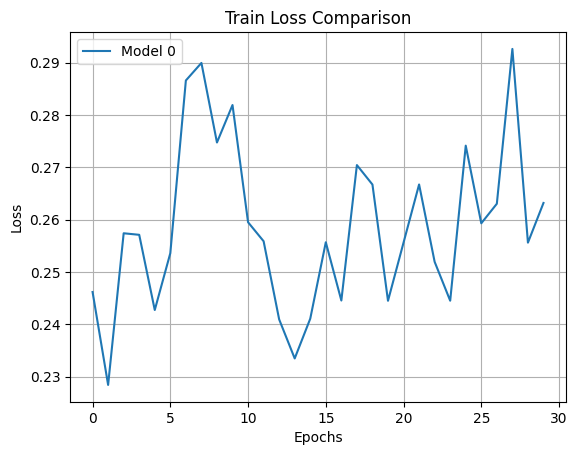

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9956
Mean IoU: 0.9414
Mean Dice Score: 0.9510


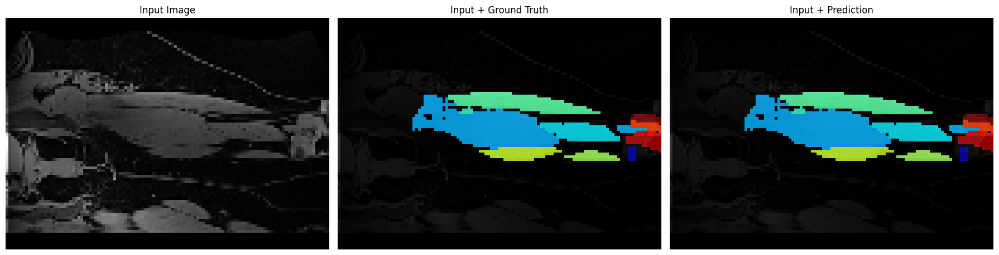

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9806
Mean IoU: 0.6344
Mean Dice Score: 0.6787


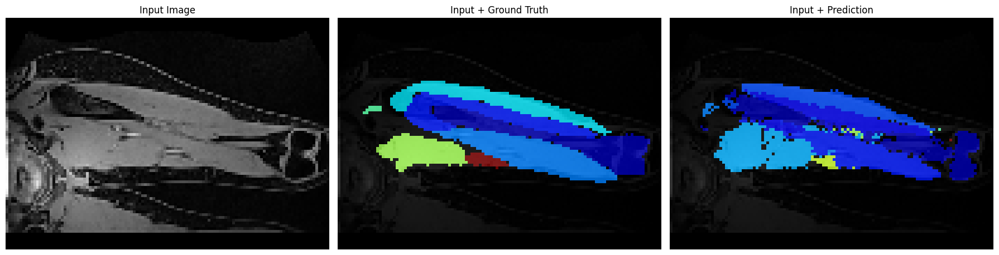

---------------------------------
Nombre de réentrainnement : 31/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2562, Valid Loss: 0.7396
Saved best model at epoch 1 with validation loss: 0.7396
Epoch 2/30: Train Loss: 0.2458, Valid Loss: 0.5303
Saved best model at epoch 2 with validation loss: 0.5303
Epoch 3/30: Train Loss: 0.2616, Valid Loss: 0.4861
Saved best model at epoch 3 with validation loss: 0.4861
Epoch 4/30: Train Loss: 0.2653, Valid Loss: 0.4862
Epoch 5/30: Train Loss: 0.2714, Valid Loss: 0.4891
Epoch 6/30: Train Loss: 0.2603, Valid Loss: 0.4671
Saved best model at epoch 6 with validation loss: 0.4671
Epoch 7/30: Train Loss: 0.2340, Valid Loss: 0.4608
Saved best model at epoch 7 with validation loss: 0.4608
Epoch 8/30: Train Loss: 0.2784, Valid Loss: 0.4928
Epoch 9/30: Train Loss: 0.2304, Valid Loss: 0.4822
Epoch 10/30: Train Loss: 0.2640, Valid Loss: 0.4787
Epoch 11/30: Train Loss: 0.2455, Valid Loss: 0.4311
Saved best model at epoch 11 with validation loss: 0.4311
Epoch 12/30: Train Loss: 0.2565, Valid Loss: 0.4727
Epoch 13/30: Train Loss: 0.2494, Valid Los

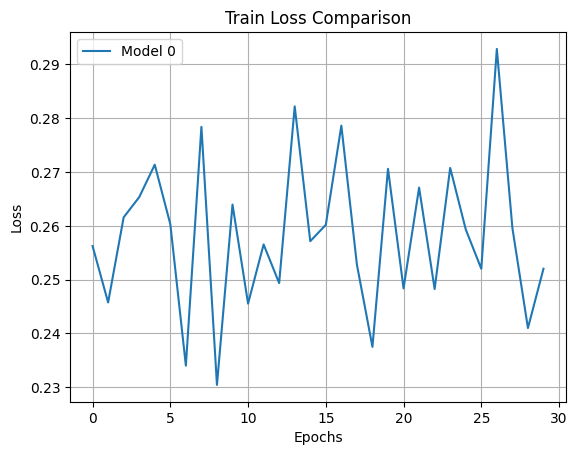

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9956
Mean IoU: 0.9384
Mean Dice Score: 0.9485


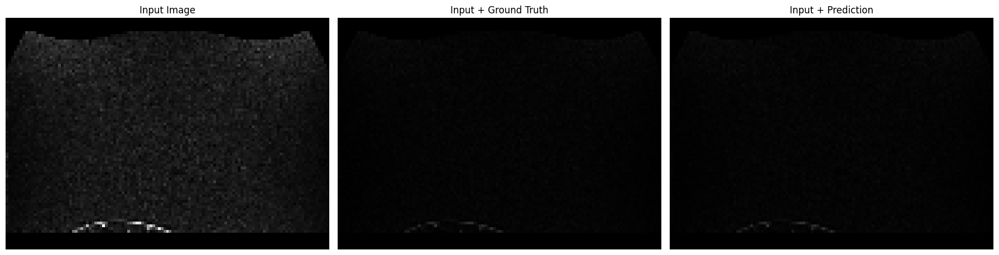

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9802
Mean IoU: 0.6080
Mean Dice Score: 0.6525


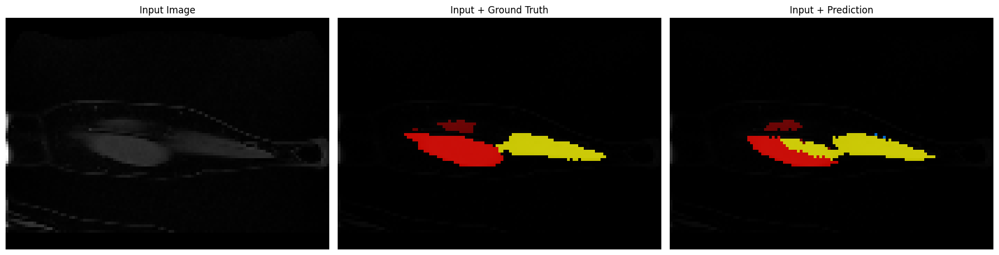

---------------------------------
Nombre de réentrainnement : 32/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2462, Valid Loss: 0.8513
Saved best model at epoch 1 with validation loss: 0.8513
Epoch 2/30: Train Loss: 0.2542, Valid Loss: 0.8801
Epoch 3/30: Train Loss: 0.2650, Valid Loss: 0.4890
Saved best model at epoch 3 with validation loss: 0.4890
Epoch 4/30: Train Loss: 0.2646, Valid Loss: 0.4334
Saved best model at epoch 4 with validation loss: 0.4334
Epoch 5/30: Train Loss: 0.2679, Valid Loss: 0.4018
Saved best model at epoch 5 with validation loss: 0.4018
Epoch 6/30: Train Loss: 0.2419, Valid Loss: 0.4278
Epoch 7/30: Train Loss: 0.2425, Valid Loss: 0.4141
Epoch 8/30: Train Loss: 0.2650, Valid Loss: 0.4490
Epoch 9/30: Train Loss: 0.2460, Valid Loss: 0.4451
Epoch 10/30: Train Loss: 0.2838, Valid Loss: 0.4523
Epoch 11/30: Train Loss: 0.2473, Valid Loss: 0.4474
Epoch 12/30: Train Loss: 0.2606, Valid Loss: 0.5138
Epoch 13/30: Train Loss: 0.2564, Valid Loss: 0.4826
Epoch 14/30: Train Loss: 0.2672, Valid Loss: 0.4916
Epoch 15/30: Train Loss: 0.2669, Valid Loss: 0.4470
E

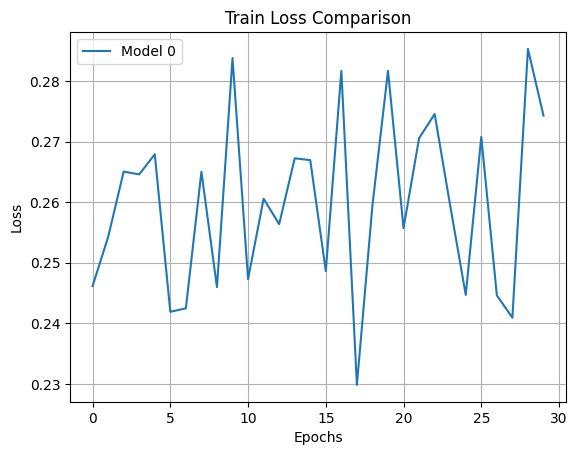

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9958
Mean IoU: 0.9357
Mean Dice Score: 0.9468


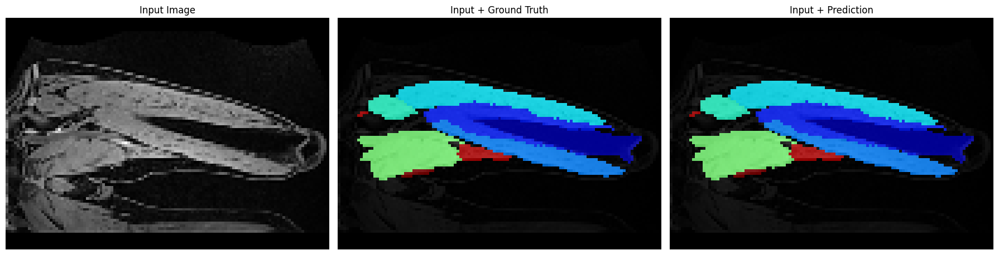

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9804
Mean IoU: 0.6080
Mean Dice Score: 0.6525


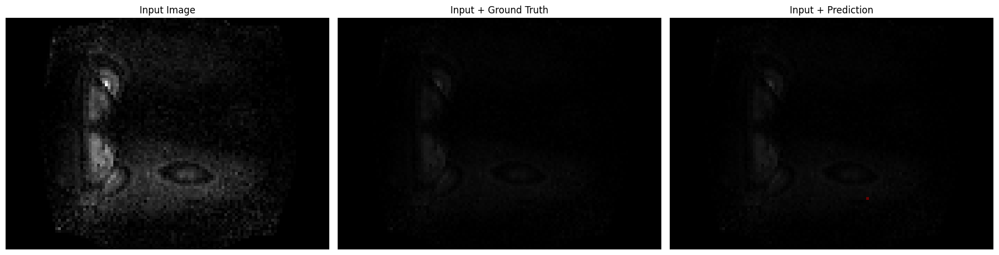

---------------------------------
Nombre de réentrainnement : 33/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2651, Valid Loss: 0.5090
Saved best model at epoch 1 with validation loss: 0.5090
Epoch 2/30: Train Loss: 0.2953, Valid Loss: 0.5430
Epoch 3/30: Train Loss: 0.2607, Valid Loss: 0.5179
Epoch 4/30: Train Loss: 0.2417, Valid Loss: 0.4939
Saved best model at epoch 4 with validation loss: 0.4939
Epoch 5/30: Train Loss: 0.2527, Valid Loss: 0.4684
Saved best model at epoch 5 with validation loss: 0.4684
Epoch 6/30: Train Loss: 0.2525, Valid Loss: 0.4535
Saved best model at epoch 6 with validation loss: 0.4535
Epoch 7/30: Train Loss: 0.2599, Valid Loss: 0.4157
Saved best model at epoch 7 with validation loss: 0.4157
Epoch 8/30: Train Loss: 0.2339, Valid Loss: 0.4750
Epoch 9/30: Train Loss: 0.2635, Valid Loss: 0.4764
Epoch 10/30: Train Loss: 0.2450, Valid Loss: 0.4795
Epoch 11/30: Train Loss: 0.2494, Valid Loss: 0.4811
Epoch 12/30: Train Loss: 0.2533, Valid Loss: 0.5267
Epoch 13/30: Train Loss: 0.2731, Valid Loss: 0.5151
Epoch 14/30: Train Loss: 0.2444, Valid Loss: 0.4

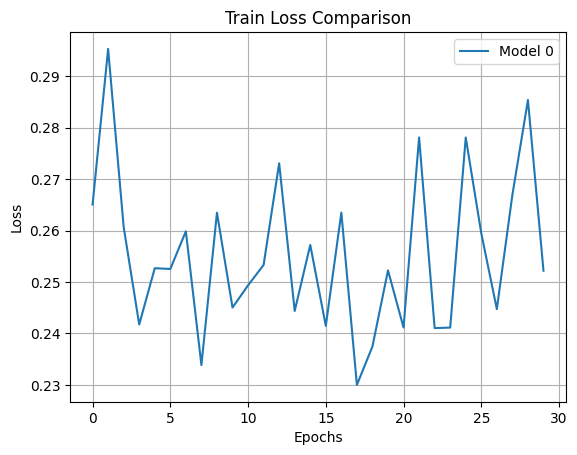

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9957
Mean IoU: 0.9410
Mean Dice Score: 0.9519


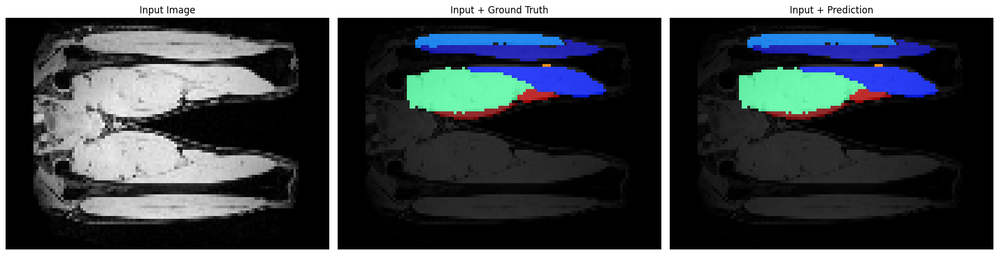

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9801
Mean IoU: 0.6136
Mean Dice Score: 0.6588


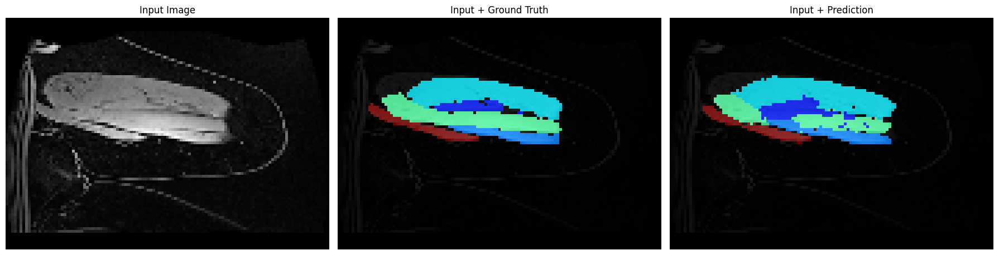

---------------------------------
Nombre de réentrainnement : 34/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2642, Valid Loss: 0.6074
Saved best model at epoch 1 with validation loss: 0.6074
Epoch 2/30: Train Loss: 0.2725, Valid Loss: 0.4979
Saved best model at epoch 2 with validation loss: 0.4979
Epoch 3/30: Train Loss: 0.2498, Valid Loss: 0.4281
Saved best model at epoch 3 with validation loss: 0.4281
Epoch 4/30: Train Loss: 0.2750, Valid Loss: 0.4314
Epoch 5/30: Train Loss: 0.2602, Valid Loss: 0.4934
Epoch 6/30: Train Loss: 0.2270, Valid Loss: 0.4530
Epoch 7/30: Train Loss: 0.2454, Valid Loss: 0.4832
Epoch 8/30: Train Loss: 0.2308, Valid Loss: 0.4312
Epoch 9/30: Train Loss: 0.2462, Valid Loss: 0.4399
Epoch 10/30: Train Loss: 0.2601, Valid Loss: 0.4750
Epoch 11/30: Train Loss: 0.2486, Valid Loss: 0.4666
Epoch 12/30: Train Loss: 0.2558, Valid Loss: 0.4573
Epoch 13/30: Train Loss: 0.3002, Valid Loss: 0.4806
Epoch 14/30: Train Loss: 0.2373, Valid Loss: 0.4462
Epoch 15/30: Train Loss: 0.2742, Valid Loss: 0.4273
Saved best model at epoch 15 with validation loss: 0.4273


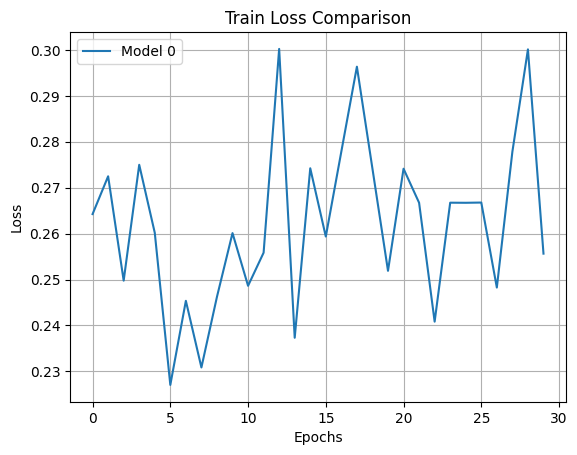

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9957
Mean IoU: 0.9309
Mean Dice Score: 0.9414


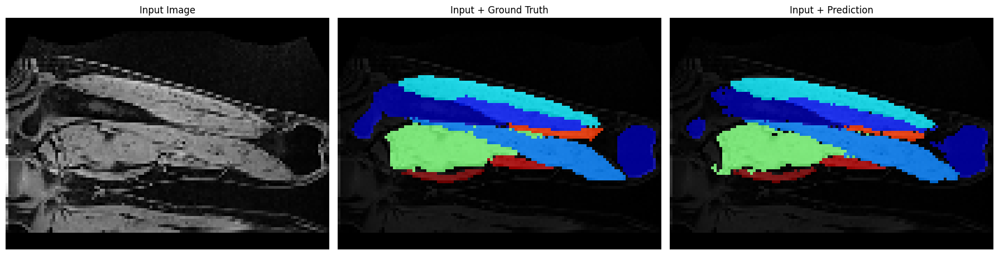

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9803
Mean IoU: 0.6092
Mean Dice Score: 0.6534


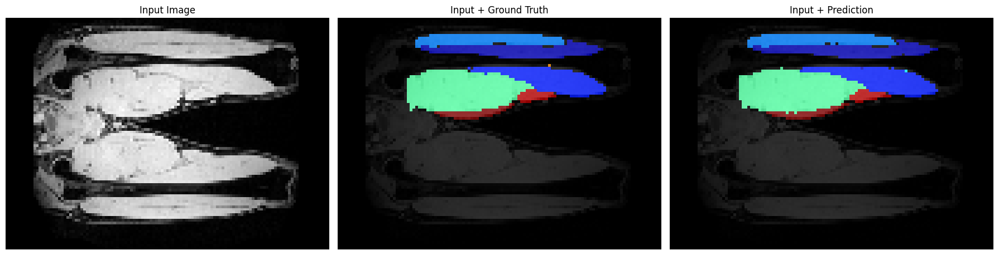

---------------------------------
Nombre de réentrainnement : 35/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2455, Valid Loss: 0.6051
Saved best model at epoch 1 with validation loss: 0.6051
Epoch 2/30: Train Loss: 0.2881, Valid Loss: 0.5003
Saved best model at epoch 2 with validation loss: 0.5003
Epoch 3/30: Train Loss: 0.2590, Valid Loss: 0.4939
Saved best model at epoch 3 with validation loss: 0.4939
Epoch 4/30: Train Loss: 0.2470, Valid Loss: 0.4602
Saved best model at epoch 4 with validation loss: 0.4602
Epoch 5/30: Train Loss: 0.2942, Valid Loss: 0.4931
Epoch 6/30: Train Loss: 0.2495, Valid Loss: 0.4802
Epoch 7/30: Train Loss: 0.2674, Valid Loss: 0.4537
Saved best model at epoch 7 with validation loss: 0.4537
Epoch 8/30: Train Loss: 0.2420, Valid Loss: 0.4871
Epoch 9/30: Train Loss: 0.2338, Valid Loss: 0.4279
Saved best model at epoch 9 with validation loss: 0.4279
Epoch 10/30: Train Loss: 0.2526, Valid Loss: 0.4708
Epoch 11/30: Train Loss: 0.2411, Valid Loss: 0.4757
Epoch 12/30: Train Loss: 0.2935, Valid Loss: 0.4654
Epoch 13/30: Train Loss: 0.2676, Valid Loss

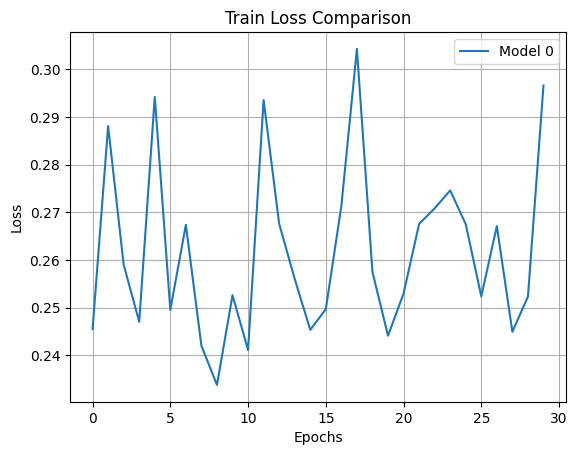

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9956
Mean IoU: 0.9352
Mean Dice Score: 0.9456


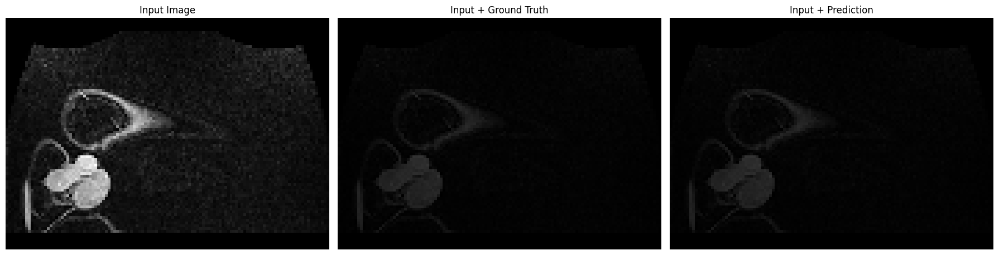

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9803
Mean IoU: 0.6161
Mean Dice Score: 0.6602


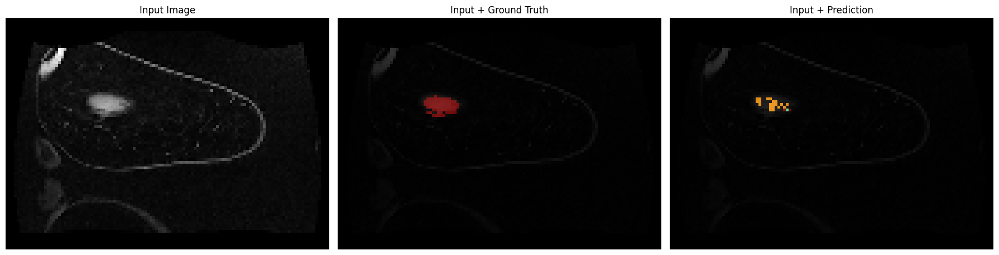

---------------------------------
Nombre de réentrainnement : 36/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2606, Valid Loss: 0.8950
Saved best model at epoch 1 with validation loss: 0.8950
Epoch 2/30: Train Loss: 0.2498, Valid Loss: 0.7287
Saved best model at epoch 2 with validation loss: 0.7287
Epoch 3/30: Train Loss: 0.2501, Valid Loss: 0.5254
Saved best model at epoch 3 with validation loss: 0.5254
Epoch 4/30: Train Loss: 0.2950, Valid Loss: 0.4243
Saved best model at epoch 4 with validation loss: 0.4243
Epoch 5/30: Train Loss: 0.2540, Valid Loss: 0.4842
Epoch 6/30: Train Loss: 0.2495, Valid Loss: 0.4806
Epoch 7/30: Train Loss: 0.2426, Valid Loss: 0.4498
Epoch 8/30: Train Loss: 0.2529, Valid Loss: 0.4806
Epoch 9/30: Train Loss: 0.2536, Valid Loss: 0.4605
Epoch 10/30: Train Loss: 0.2458, Valid Loss: 0.4708
Epoch 11/30: Train Loss: 0.2607, Valid Loss: 0.4739
Epoch 12/30: Train Loss: 0.2712, Valid Loss: 0.4929
Epoch 13/30: Train Loss: 0.2637, Valid Loss: 0.4825
Epoch 14/30: Train Loss: 0.2563, Valid Loss: 0.4252
Epoch 15/30: Train Loss: 0.2652, Valid Loss: 0.4552
E

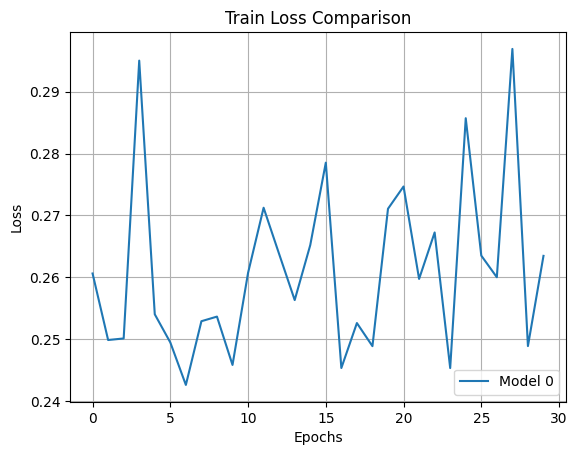

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9956
Mean IoU: 0.9316
Mean Dice Score: 0.9424


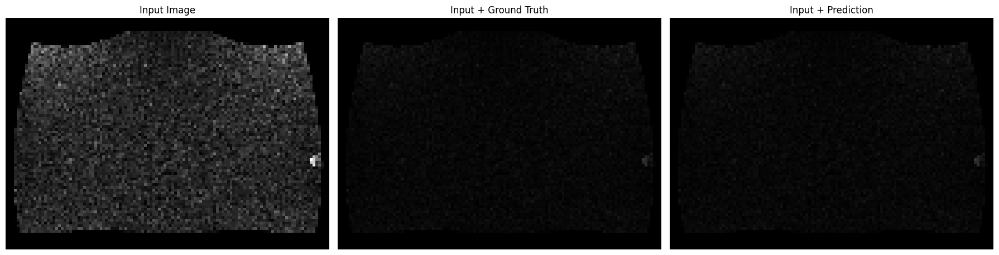

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9802
Mean IoU: 0.5947
Mean Dice Score: 0.6396


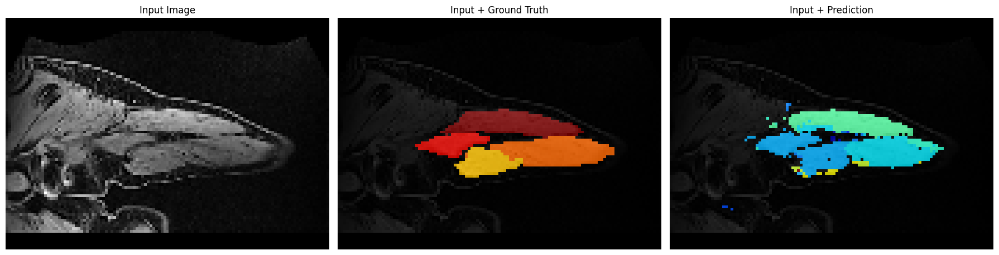

---------------------------------
Nombre de réentrainnement : 37/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.3013, Valid Loss: 0.6082
Saved best model at epoch 1 with validation loss: 0.6082
Epoch 2/30: Train Loss: 0.2538, Valid Loss: 0.4928
Saved best model at epoch 2 with validation loss: 0.4928
Epoch 3/30: Train Loss: 0.2573, Valid Loss: 0.4594
Saved best model at epoch 3 with validation loss: 0.4594
Epoch 4/30: Train Loss: 0.2390, Valid Loss: 0.5033
Epoch 5/30: Train Loss: 0.2368, Valid Loss: 0.4892
Epoch 6/30: Train Loss: 0.2700, Valid Loss: 0.4682
Epoch 7/30: Train Loss: 0.2657, Valid Loss: 0.5007
Epoch 8/30: Train Loss: 0.2551, Valid Loss: 0.5013
Epoch 9/30: Train Loss: 0.2686, Valid Loss: 0.4507
Saved best model at epoch 9 with validation loss: 0.4507
Epoch 10/30: Train Loss: 0.2576, Valid Loss: 0.4663
Epoch 11/30: Train Loss: 0.2511, Valid Loss: 0.4859
Epoch 12/30: Train Loss: 0.2715, Valid Loss: 0.4798
Epoch 13/30: Train Loss: 0.2678, Valid Loss: 0.4765
Epoch 14/30: Train Loss: 0.2635, Valid Loss: 0.4228
Saved best model at epoch 14 with validation loss: 0.

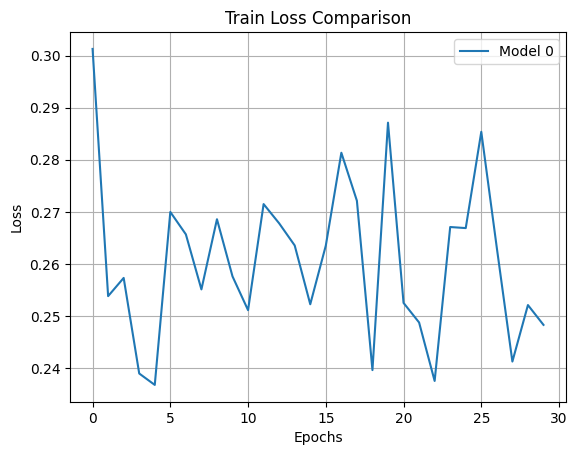

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9957
Mean IoU: 0.9289
Mean Dice Score: 0.9389


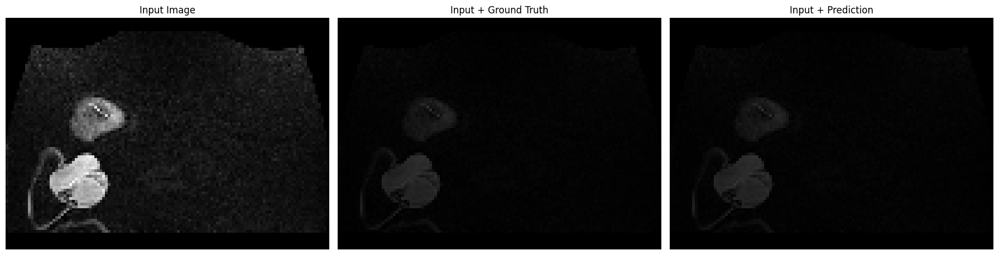

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9804
Mean IoU: 0.6352
Mean Dice Score: 0.6797


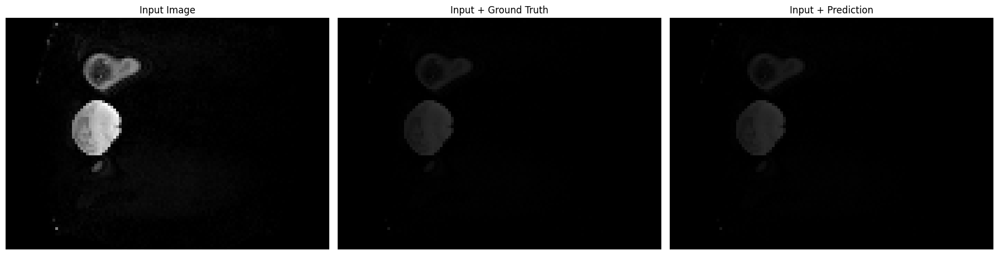

---------------------------------
Nombre de réentrainnement : 38/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2793, Valid Loss: 0.8622
Saved best model at epoch 1 with validation loss: 0.8622
Epoch 2/30: Train Loss: 0.2614, Valid Loss: 0.7221
Saved best model at epoch 2 with validation loss: 0.7221
Epoch 3/30: Train Loss: 0.2623, Valid Loss: 0.4963
Saved best model at epoch 3 with validation loss: 0.4963
Epoch 4/30: Train Loss: 0.2864, Valid Loss: 0.4031
Saved best model at epoch 4 with validation loss: 0.4031
Epoch 5/30: Train Loss: 0.2868, Valid Loss: 0.4435
Epoch 6/30: Train Loss: 0.2508, Valid Loss: 0.4889
Epoch 7/30: Train Loss: 0.2962, Valid Loss: 0.4571
Epoch 8/30: Train Loss: 0.2542, Valid Loss: 0.4355
Epoch 9/30: Train Loss: 0.2427, Valid Loss: 0.4842
Epoch 10/30: Train Loss: 0.2574, Valid Loss: 0.4789
Epoch 11/30: Train Loss: 0.2619, Valid Loss: 0.4983
Epoch 12/30: Train Loss: 0.2784, Valid Loss: 0.4840
Epoch 13/30: Train Loss: 0.2487, Valid Loss: 0.5026
Epoch 14/30: Train Loss: 0.2710, Valid Loss: 0.4221
Epoch 15/30: Train Loss: 0.2522, Valid Loss: 0.4854
E

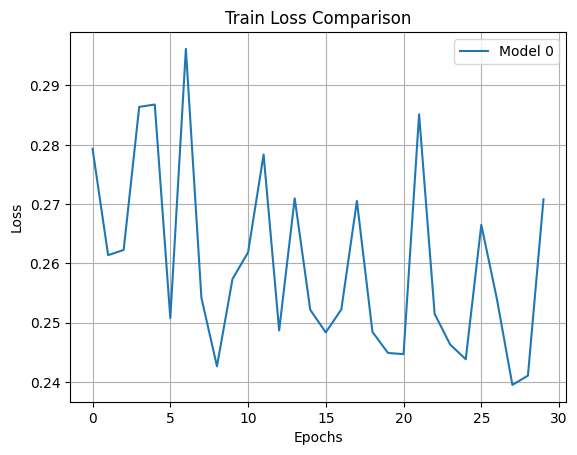

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9956
Mean IoU: 0.9357
Mean Dice Score: 0.9459


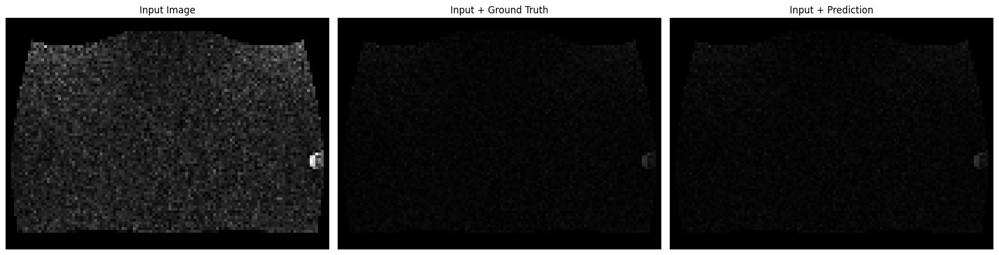

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9795
Mean IoU: 0.6088
Mean Dice Score: 0.6526


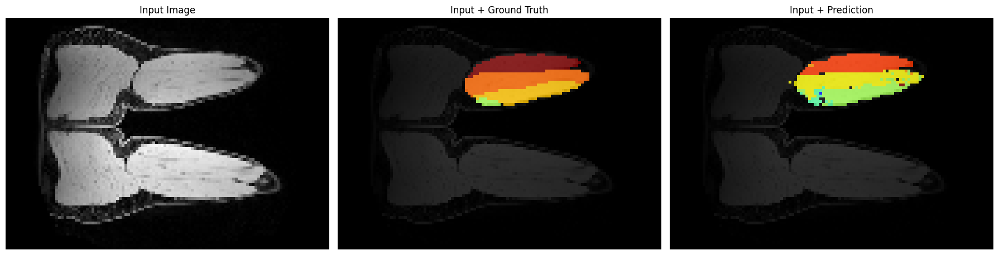

---------------------------------
Nombre de réentrainnement : 39/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2428, Valid Loss: 0.5505
Saved best model at epoch 1 with validation loss: 0.5505
Epoch 2/30: Train Loss: 0.2555, Valid Loss: 0.4453
Saved best model at epoch 2 with validation loss: 0.4453
Epoch 3/30: Train Loss: 0.2465, Valid Loss: 0.4641
Epoch 4/30: Train Loss: 0.2643, Valid Loss: 0.4710
Epoch 5/30: Train Loss: 0.2603, Valid Loss: 0.4907
Epoch 6/30: Train Loss: 0.2384, Valid Loss: 0.4101
Saved best model at epoch 6 with validation loss: 0.4101
Epoch 7/30: Train Loss: 0.2680, Valid Loss: 0.5295
Epoch 8/30: Train Loss: 0.2751, Valid Loss: 0.4336
Epoch 9/30: Train Loss: 0.2421, Valid Loss: 0.4584
Epoch 10/30: Train Loss: 0.2749, Valid Loss: 0.4433
Epoch 11/30: Train Loss: 0.2598, Valid Loss: 0.4822
Epoch 12/30: Train Loss: 0.2633, Valid Loss: 0.4317
Epoch 13/30: Train Loss: 0.2336, Valid Loss: 0.4827
Epoch 14/30: Train Loss: 0.2372, Valid Loss: 0.4664
Epoch 15/30: Train Loss: 0.2409, Valid Loss: 0.3914
Saved best model at epoch 15 with validation loss: 0.3914


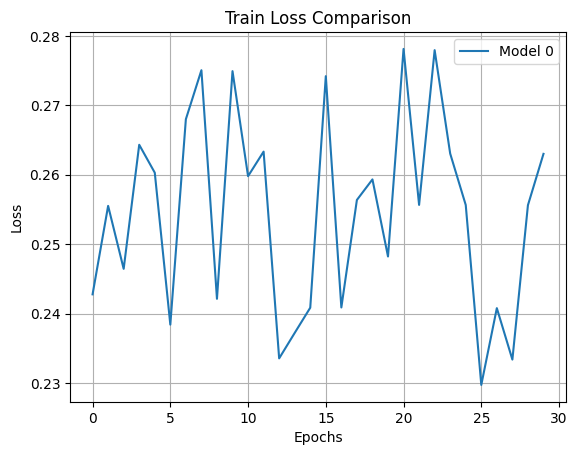

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9956
Mean IoU: 0.9260
Mean Dice Score: 0.9357


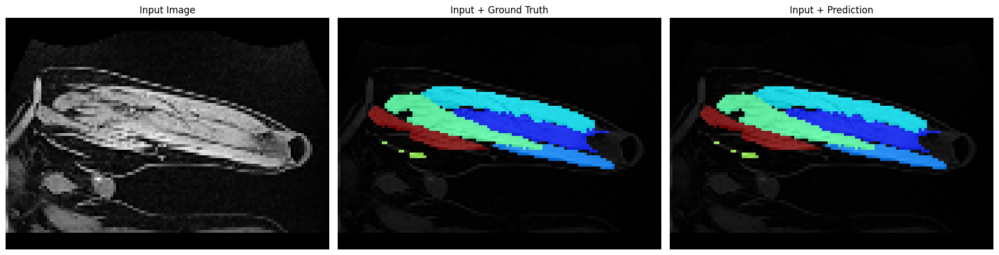

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9806
Mean IoU: 0.6513
Mean Dice Score: 0.6946


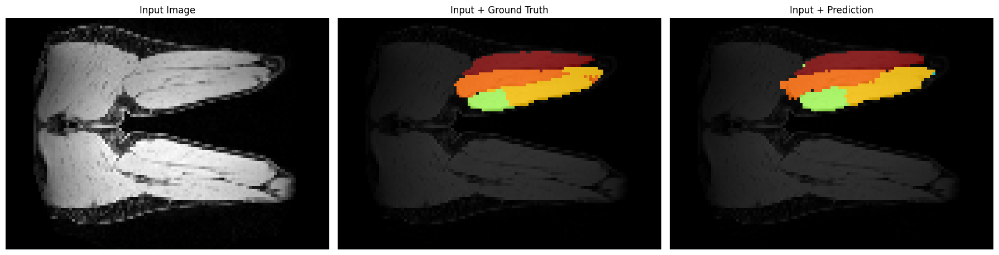

---------------------------------
Nombre de réentrainnement : 40/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2387, Valid Loss: 0.5244
Saved best model at epoch 1 with validation loss: 0.5244
Epoch 2/30: Train Loss: 0.2461, Valid Loss: 0.4534
Saved best model at epoch 2 with validation loss: 0.4534
Epoch 3/30: Train Loss: 0.2455, Valid Loss: 0.4435
Saved best model at epoch 3 with validation loss: 0.4435
Epoch 4/30: Train Loss: 0.2788, Valid Loss: 0.4341
Saved best model at epoch 4 with validation loss: 0.4341
Epoch 5/30: Train Loss: 0.2567, Valid Loss: 0.4288
Saved best model at epoch 5 with validation loss: 0.4288
Epoch 6/30: Train Loss: 0.2486, Valid Loss: 0.4480
Epoch 7/30: Train Loss: 0.2736, Valid Loss: 0.4462
Epoch 8/30: Train Loss: 0.2626, Valid Loss: 0.4685
Epoch 9/30: Train Loss: 0.2588, Valid Loss: 0.4342
Epoch 10/30: Train Loss: 0.2336, Valid Loss: 0.4803
Epoch 11/30: Train Loss: 0.2656, Valid Loss: 0.4896
Epoch 12/30: Train Loss: 0.2661, Valid Loss: 0.4002
Saved best model at epoch 12 with validation loss: 0.4002
Epoch 13/30: Train Loss: 0.2750, Valid Los

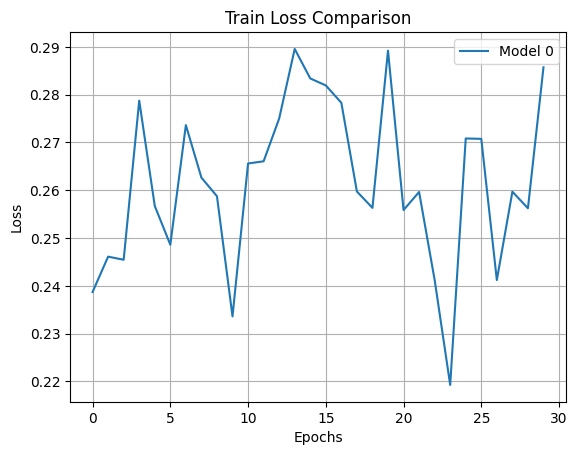

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9953
Mean IoU: 0.9283
Mean Dice Score: 0.9388


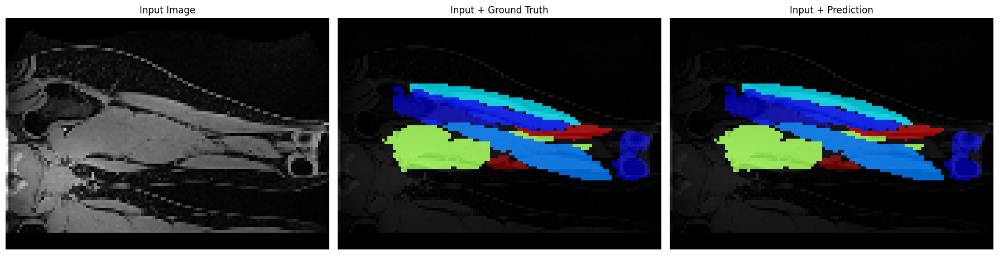

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9797
Mean IoU: 0.6259
Mean Dice Score: 0.6712


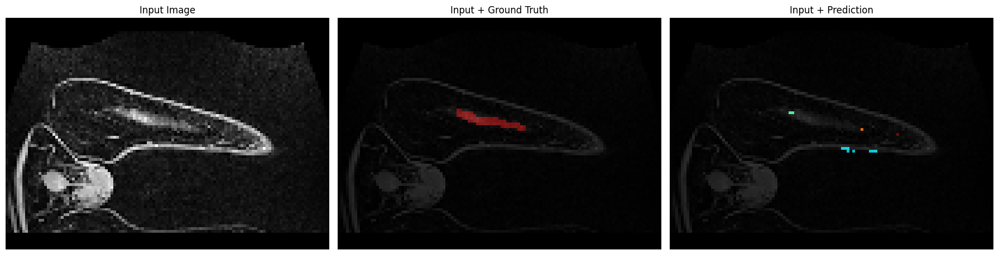

---------------------------------
Nombre de réentrainnement : 41/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.3114, Valid Loss: 1.1906
Saved best model at epoch 1 with validation loss: 1.1906
Epoch 2/30: Train Loss: 0.2639, Valid Loss: 0.5370
Saved best model at epoch 2 with validation loss: 0.5370
Epoch 3/30: Train Loss: 0.2429, Valid Loss: 0.5893
Epoch 4/30: Train Loss: 0.2718, Valid Loss: 0.4893
Saved best model at epoch 4 with validation loss: 0.4893
Epoch 5/30: Train Loss: 0.2460, Valid Loss: 0.4785
Saved best model at epoch 5 with validation loss: 0.4785
Epoch 6/30: Train Loss: 0.2681, Valid Loss: 0.4944
Epoch 7/30: Train Loss: 0.2385, Valid Loss: 0.4976
Epoch 8/30: Train Loss: 0.2568, Valid Loss: 0.4135
Saved best model at epoch 8 with validation loss: 0.4135
Epoch 9/30: Train Loss: 0.2715, Valid Loss: 0.4957
Epoch 10/30: Train Loss: 0.2563, Valid Loss: 0.4878
Epoch 11/30: Train Loss: 0.2561, Valid Loss: 0.4462
Epoch 12/30: Train Loss: 0.2819, Valid Loss: 0.4969
Epoch 13/30: Train Loss: 0.2670, Valid Loss: 0.4732
Epoch 14/30: Train Loss: 0.2373, Valid Loss: 0.4

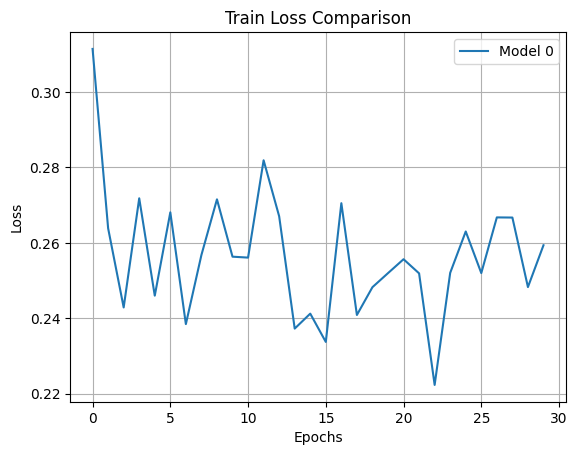

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9955
Mean IoU: 0.9365
Mean Dice Score: 0.9478


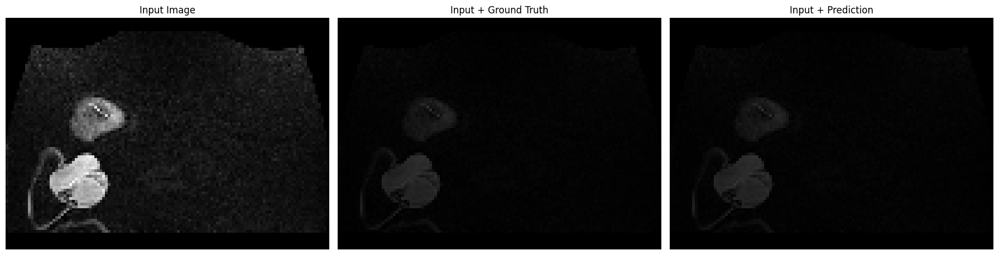

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9805
Mean IoU: 0.6417
Mean Dice Score: 0.6876


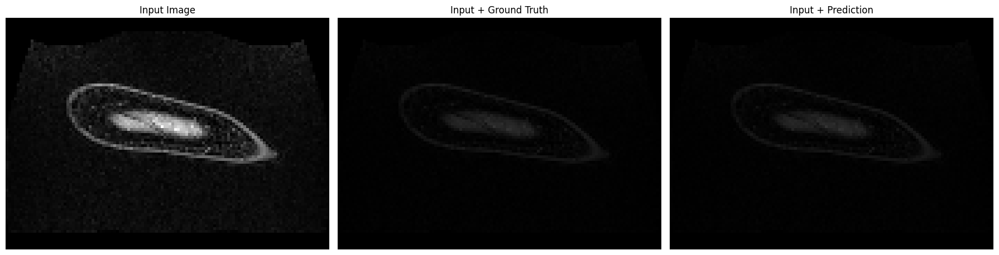

---------------------------------
Nombre de réentrainnement : 42/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2463, Valid Loss: 0.6680
Saved best model at epoch 1 with validation loss: 0.6680
Epoch 2/30: Train Loss: 0.2576, Valid Loss: 0.5036
Saved best model at epoch 2 with validation loss: 0.5036
Epoch 3/30: Train Loss: 0.2645, Valid Loss: 0.4798
Saved best model at epoch 3 with validation loss: 0.4798
Epoch 4/30: Train Loss: 0.2496, Valid Loss: 0.4492
Saved best model at epoch 4 with validation loss: 0.4492
Epoch 5/30: Train Loss: 0.2751, Valid Loss: 0.4359
Saved best model at epoch 5 with validation loss: 0.4359
Epoch 6/30: Train Loss: 0.2818, Valid Loss: 0.4573
Epoch 7/30: Train Loss: 0.2492, Valid Loss: 0.4304
Saved best model at epoch 7 with validation loss: 0.4304
Epoch 8/30: Train Loss: 0.2654, Valid Loss: 0.4189
Saved best model at epoch 8 with validation loss: 0.4189
Epoch 9/30: Train Loss: 0.2884, Valid Loss: 0.4906
Epoch 10/30: Train Loss: 0.2499, Valid Loss: 0.4757
Epoch 11/30: Train Loss: 0.2676, Valid Loss: 0.4611
Epoch 12/30: Train Loss: 0.2783, Valid

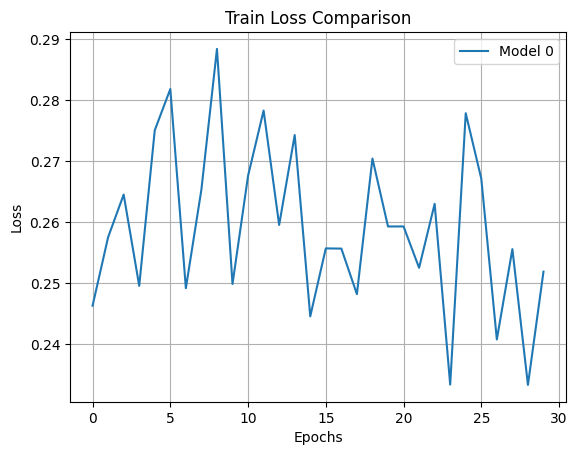

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9956
Mean IoU: 0.9426
Mean Dice Score: 0.9534


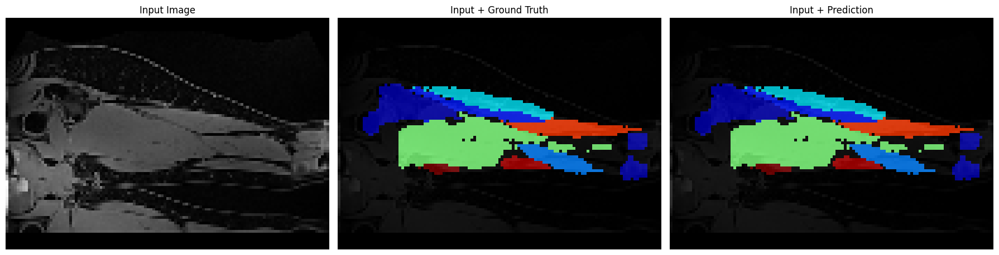

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9804
Mean IoU: 0.6308
Mean Dice Score: 0.6758


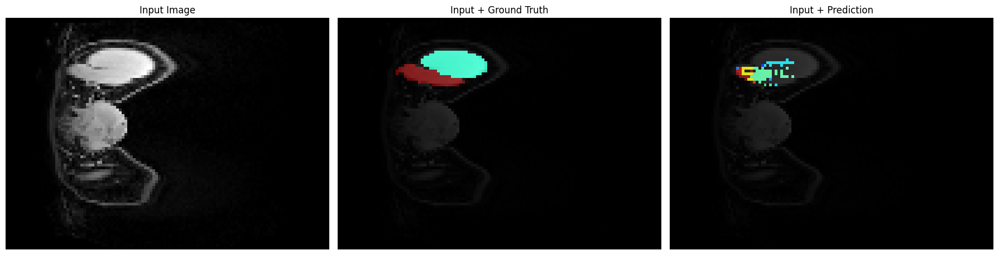

---------------------------------
Nombre de réentrainnement : 43/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2673, Valid Loss: 0.5903
Saved best model at epoch 1 with validation loss: 0.5903
Epoch 2/30: Train Loss: 0.2653, Valid Loss: 0.4774
Saved best model at epoch 2 with validation loss: 0.4774
Epoch 3/30: Train Loss: 0.2494, Valid Loss: 0.5451
Epoch 4/30: Train Loss: 0.2564, Valid Loss: 0.4498
Saved best model at epoch 4 with validation loss: 0.4498
Epoch 5/30: Train Loss: 0.2382, Valid Loss: 0.4632
Epoch 6/30: Train Loss: 0.2787, Valid Loss: 0.4946
Epoch 7/30: Train Loss: 0.2895, Valid Loss: 0.4793
Epoch 8/30: Train Loss: 0.2670, Valid Loss: 0.4935
Epoch 9/30: Train Loss: 0.2967, Valid Loss: 0.4431
Saved best model at epoch 9 with validation loss: 0.4431
Epoch 10/30: Train Loss: 0.2931, Valid Loss: 0.4896
Epoch 11/30: Train Loss: 0.2417, Valid Loss: 0.4955
Epoch 12/30: Train Loss: 0.2527, Valid Loss: 0.4600
Epoch 13/30: Train Loss: 0.2717, Valid Loss: 0.4809
Epoch 14/30: Train Loss: 0.2609, Valid Loss: 0.4486
Epoch 15/30: Train Loss: 0.2531, Valid Loss: 0.4316
S

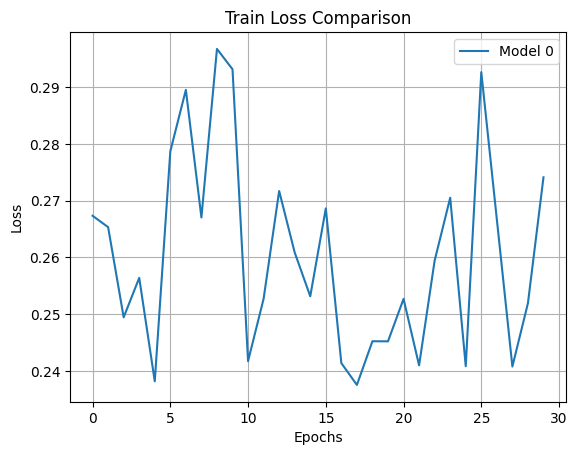

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9954
Mean IoU: 0.9412
Mean Dice Score: 0.9520


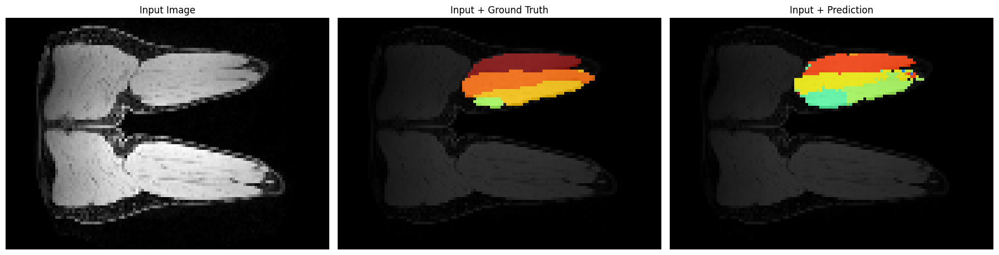

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9797
Mean IoU: 0.6239
Mean Dice Score: 0.6683


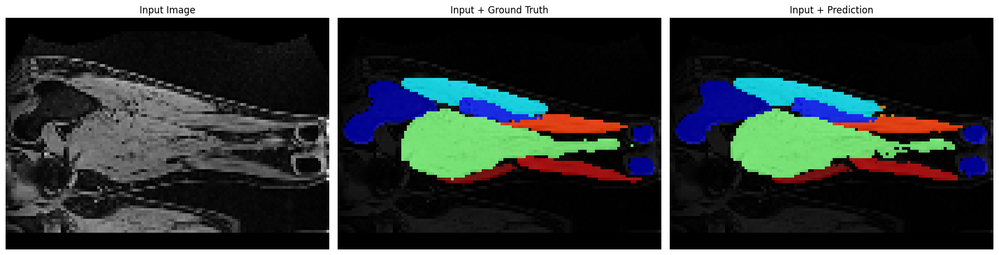

---------------------------------
Nombre de réentrainnement : 44/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2829, Valid Loss: 0.5490
Saved best model at epoch 1 with validation loss: 0.5490
Epoch 2/30: Train Loss: 0.2429, Valid Loss: 0.5662
Epoch 3/30: Train Loss: 0.2649, Valid Loss: 0.4697
Saved best model at epoch 3 with validation loss: 0.4697
Epoch 4/30: Train Loss: 0.2453, Valid Loss: 0.4991
Epoch 5/30: Train Loss: 0.2415, Valid Loss: 0.4840
Epoch 6/30: Train Loss: 0.2379, Valid Loss: 0.4424
Saved best model at epoch 6 with validation loss: 0.4424
Epoch 7/30: Train Loss: 0.2566, Valid Loss: 0.4781
Epoch 8/30: Train Loss: 0.2564, Valid Loss: 0.4740
Epoch 9/30: Train Loss: 0.2566, Valid Loss: 0.4800
Epoch 10/30: Train Loss: 0.2600, Valid Loss: 0.5199
Epoch 11/30: Train Loss: 0.2860, Valid Loss: 0.4933
Epoch 12/30: Train Loss: 0.2722, Valid Loss: 0.4770
Epoch 13/30: Train Loss: 0.2524, Valid Loss: 0.5122
Epoch 14/30: Train Loss: 0.2447, Valid Loss: 0.4919
Epoch 15/30: Train Loss: 0.2711, Valid Loss: 0.4414
Saved best model at epoch 15 with validation loss: 0.4414


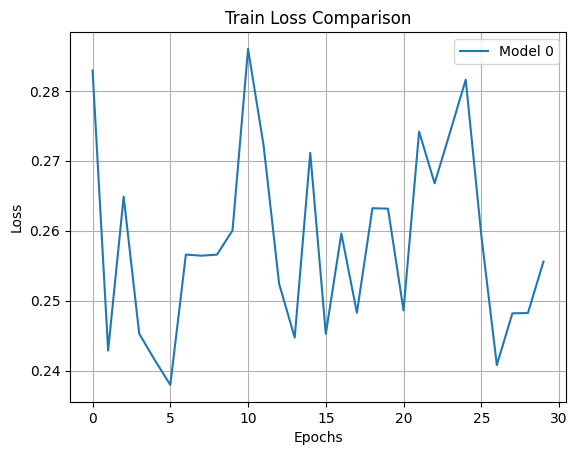

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9954
Mean IoU: 0.9336
Mean Dice Score: 0.9441


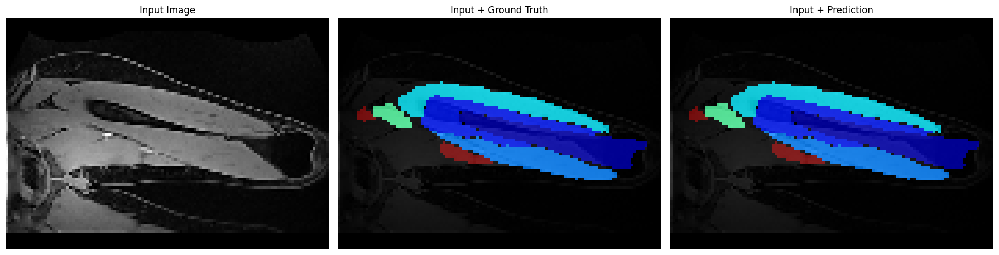

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9798
Mean IoU: 0.5977
Mean Dice Score: 0.6423


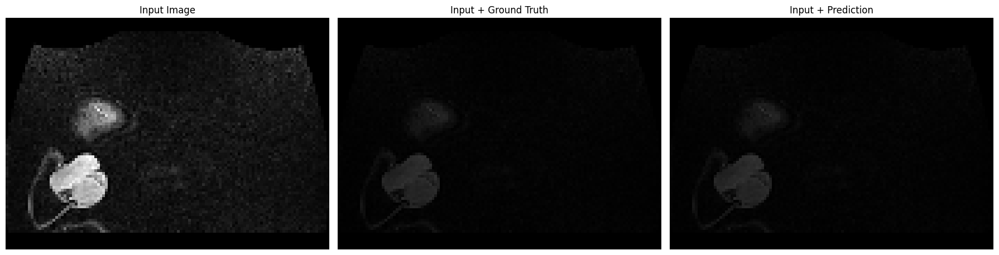

---------------------------------
Nombre de réentrainnement : 45/45
Using device: cuda


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add

Epoch 1/30: Train Loss: 0.2542, Valid Loss: 0.9512
Saved best model at epoch 1 with validation loss: 0.9512
Epoch 2/30: Train Loss: 0.2976, Valid Loss: 0.6571
Saved best model at epoch 2 with validation loss: 0.6571
Epoch 3/30: Train Loss: 0.2870, Valid Loss: 0.4342
Saved best model at epoch 3 with validation loss: 0.4342
Epoch 4/30: Train Loss: 0.2716, Valid Loss: 0.5036
Epoch 5/30: Train Loss: 0.2528, Valid Loss: 0.4957
Epoch 6/30: Train Loss: 0.2823, Valid Loss: 0.4420
Epoch 7/30: Train Loss: 0.2783, Valid Loss: 0.4850
Epoch 8/30: Train Loss: 0.2634, Valid Loss: 0.4362
Epoch 9/30: Train Loss: 0.2375, Valid Loss: 0.4631
Epoch 10/30: Train Loss: 0.2521, Valid Loss: 0.4580
Epoch 11/30: Train Loss: 0.2557, Valid Loss: 0.4787
Epoch 12/30: Train Loss: 0.2299, Valid Loss: 0.4810
Epoch 13/30: Train Loss: 0.2635, Valid Loss: 0.5045
Epoch 14/30: Train Loss: 0.2486, Valid Loss: 0.4725
Epoch 15/30: Train Loss: 0.2483, Valid Loss: 0.4764
Epoch 16/30: Train Loss: 0.2520, Valid Loss: 0.4681
Epoch 

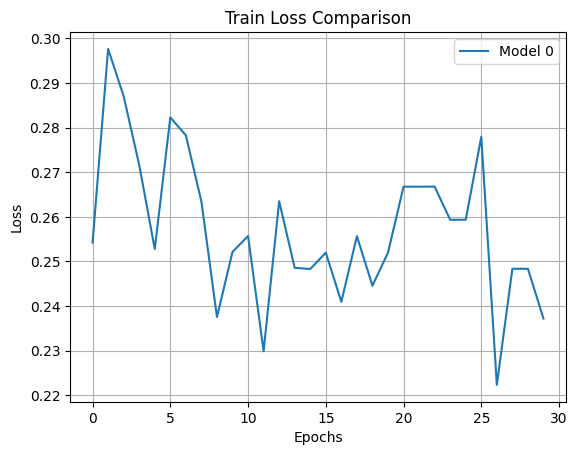

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9953
Mean IoU: 0.9240
Mean Dice Score: 0.9361


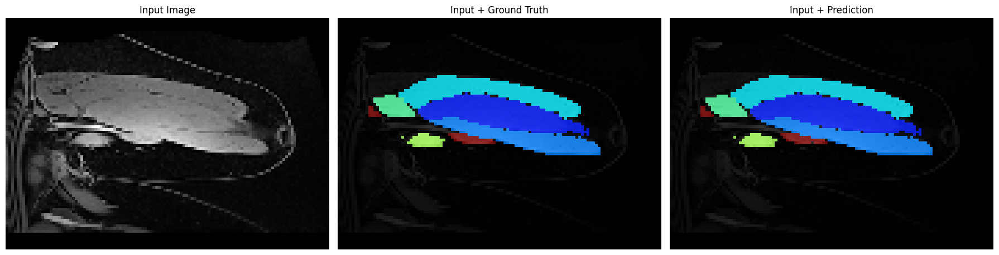

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Test Accuracy: 0.9794
Mean IoU: 0.5974
Mean Dice Score: 0.6425


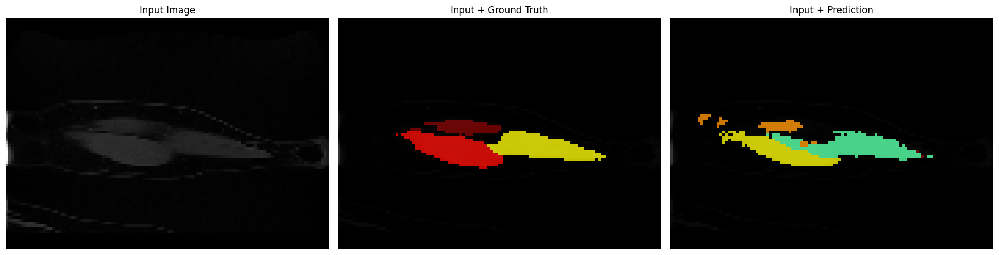

In [51]:
#Inférence avec modele de base = test voir new_data
affichage_ewc_dice=[]
affichage_ewc_acc=[]


image_inference,label_inference,prediction,test_accuracy,mean_dice=test_model_dice(test_dataset, 'best_model.pth')
affichage_ewc_acc.append(test_accuracy)
affichage_ewc_dice.append(mean_dice)

# print(type(label_inference))
# print(type(label_inference[0]))
# print(label_inference[0])
# print("------------------")

# Sur la segmentation modifier la prédiction 
# => comparaison vérité et prédiction puis ajout de 50% de diffrérence = Modification Epert
# for i in range(len(image_inference)):
#     image_inference[] = images_fe.squeeze(0) 
#     print(images_fe.shape)
# print(image_inference[0].shape)
compte=1
model_to_train=['best_model.pth','best_model_sys.pth','best_model_sys.pth','best_model_sys.pth','best_model_sys.pth']
for u in range(45):
    print('---------------------------------')
    print(f'Nombre de réentrainnement : {compte}/45')
    compte+=1
    model_to_train.append('best_model_sys.pth')
    corrected_predictions_list=[]
    for i in range(len(image_inference)):
        # print(type(label[i]))
        # print(image[i].shape)
        image_inference[i]=image_inference[i].squeeze(0)
        # print(image_inference[i].shape)
        # Prepare data for visualization
        imagep = image_inference[i].squeeze().detach().cpu().numpy()  # Image
        labelp = label_inference[i].squeeze().detach().cpu().numpy()  # Label
        predictionp = prediction[i].squeeze().detach().cpu().numpy()  # Prediction

        # Convert one-hot encoded label to class indices if necessary
        if labelp.ndim == 3:  # One-hot encoded label
            labelp = np.argmax(labelp, axis=0)

        # Ensure the image is grayscale if it's a single-channel image
        if imagep.ndim == 3:
            imagep = imagep[0]  # Take the first channel if it's RGB


        # Calculer la matrice des différences
        incorrect_pixels = (predictionp != labelp)

        # Générer une matrice aléatoire avec 50% de chances pour chaque pixel
        random_mask = np.random.rand(*predictionp.shape) < 0.5

        # Identifier les pixels à corriger (intersection des pixels incorrects et du masque aléatoire)
        correction_mask = incorrect_pixels & random_mask

        # Appliquer les corrections sur la matrice de prédictions
        corrected_predictions = predictionp.copy()
        corrected_predictions[correction_mask] = labelp[correction_mask]
        corrected_predictions_list.append(corrected_predictions)


    # Vérifier les tailles des listes avant de passer à train_test_split
    # print(len(image_inference))  # Affiche la taille de 'image'
    # print(len(corrected_predictions_list))  # Affiche la taille de 'corrected_predictions_list'

    # Assurez-vous que les deux ont le même nombre d'exemples
    if len(image_inference) != len(corrected_predictions_list):
        raise ValueError("Les listes 'image' et 'corrected_predictions_list' n'ont pas le même nombre d'échantillons")

    # Remise sus forme de dataloader
    new_train_image_files, new_valid_image_files, new_train_label_files, new_valid_label_files = train_test_split(
        image_inference, corrected_predictions_list, test_size=0.2, random_state=42
    )

    # print(type(image_inference))
    # print(type(new_train_image_files))

    new_train_image_files = [torch.tensor(img) for img in new_train_image_files]
    new_train_label_files = [torch.tensor(lbl) for lbl in new_train_label_files]
    new_train_image_files = torch.stack(new_train_image_files)
    new_train_label_files = torch.stack(new_train_label_files)
    # new_train_dataset = CustomDataset(new_train_image_files, new_train_label_files, transform=train_transforms)
    new_train_dataset = CustomDataset_tensor(new_train_image_files, new_train_label_files)
    new_train_dataset = TensorDataset(new_train_image_files, new_train_label_files)
    new_train_loader = DataLoader(new_train_dataset, batch_size=batch_size, shuffle=True, pin_memory=False)

    new_valid_image_files = [torch.tensor(img) for img in new_valid_image_files]
    new_valid_label_files = [torch.tensor(lbl) for lbl in new_valid_label_files]
    new_valid_image_files = torch.stack(new_valid_image_files)
    new_valid_label_files = torch.stack(new_valid_label_files)
    new_valid_dataset = CustomDataset_tensor(new_valid_image_files, new_valid_label_files)
    new_valid_dataset = TensorDataset(new_valid_image_files, new_valid_label_files)
    new_valid_loader = DataLoader(new_valid_dataset, batch_size=batch_size, shuffle=True, pin_memory=False)

    # print(type(train_loader))
    # print(type(new_train_loader))

    # Réentrainnement (avec et sans EWC)
    # model.load_state_dict(torch.load('best_model.pth'),strict=False)  # Load the best model
    # model.to(device)

    # # fine_tune_with_ewc(
    # #     model, new_train_loader, new_valid_loader, optimizer, scheduler, fisher, prev_params,
    # #     combined_loss, num_classes, lambda_ewc=lambda_ewc, dice_weight=dice_weight, n_epochs=30, device=device
    # # )



    list_train_loss=[]
    list_valid_loss=[]
    # train_loss,valid_loss= train_model(new_train_loader,new_valid_loader,model,model_to_train[u])
    train_loss,valid_loss= train_model_with_ewc(new_train_loader,new_valid_loader,model,train_loader,model_to_train[u], 0.01)
    
    list_train_loss.append(train_loss)
    list_valid_loss.append(valid_loss)

    for i, loss in enumerate(list_train_loss):
        plt.plot(loss, label=f'Model {i}')  # Ajouter une légende avec le numéro de modèle

    # Ajouter des détails au graphique
    plt.title('Train Loss Comparison')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()  # Afficher les légendes
    plt.grid(True)  # Ajouter une grille pour faciliter la lecture
    plt.show()

    # # Inférence avec nouveau model =data test pour comparé nouvelle prédiction et vérité 
    image_inference,label_inference,prediction,test_accuracy,mean_dice=test_model_dice(test_dataset, 'best_model_sys.pth')

    affichage_ewc_acc.append(test_accuracy)
    affichage_ewc_dice.append(mean_dice)
   








### Affichage Courbes

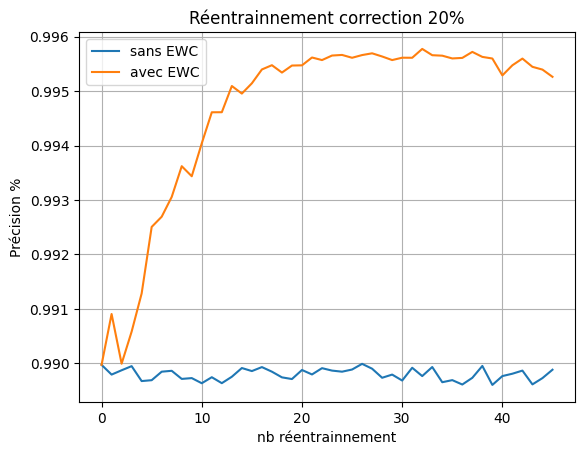

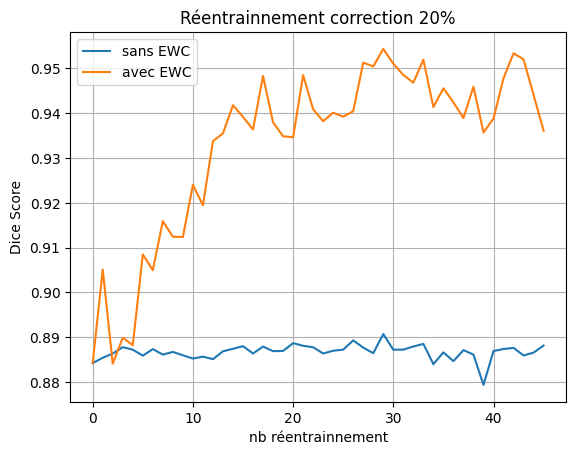

In [ ]:
plt.plot(range(len(affichage_acc)), affichage_acc, label='sans EWC')
plt.plot(range(len(affichage_acc)), affichage_ewc_acc, label='avec EWC')

plt.title('Réentrainnement correction 20%')
plt.xlabel('nb réentrainnement')
plt.ylabel('Précision %')
plt.legend()  # Afficher les légendes
plt.grid(True)  # Ajouter une grille pour faciliter la lecture
plt.show()

plt.plot(range(len(affichage_dice)), affichage_dice, label='sans EWC')
plt.plot(range(len(affichage_dice)), affichage_ewc_dice, label='avec EWC')

plt.title('Réentrainnement correction 20%')
plt.xlabel('nb réentrainnement')
plt.ylabel('Dice Score')
plt.legend()  # Afficher les légendes
plt.grid(True)  # Ajouter une grille pour faciliter la lecture
plt.show()